# Imports

In [5]:
import numpy as np
import seaborn as sns
from sklearn.impute import SimpleImputer
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
from networkx.algorithms import community
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go

# Importar los DataFiles

In [6]:
df = pd.read_csv('responses.csv')

In [7]:
sns.set()

df['ID'] = df.index #Creo una columna ID con los indices para diferenciar a los individuos
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x: '%.2f' % x)
pd.set_option('display.max_rows', None)

# Limpieza de datos


## *Comenzaremos* con el análisis de datos **atípicos**


Empezaré con la variable altura, viendo si hay algun dato anómalo evidente

In [8]:
df[df['Height'] < 145]

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,Punk,"Hiphop, Rap","Reggae, Ska","Swing, Jazz",Rock n roll,Alternative,Latino,"Techno, Trance",Opera,Movies,Horror,Thriller,Comedy,Romantic,Sci-fi,War,Fantasy/Fairy tales,Animated,Documentary,Western,Action,History,Psychology,Politics,Mathematics,Physics,Internet,PC,Economy Management,Biology,Chemistry,Reading,Geography,Foreign languages,Medicine,Law,Cars,Art exhibitions,Religion,"Countryside, outdoors",Dancing,Musical instruments,Writing,Passive sport,Active sport,Gardening,Celebrities,Shopping,Science and technology,Theatre,Fun with friends,Adrenaline sports,Pets,Flying,Storm,Darkness,Heights,Spiders,Snakes,Rats,Ageing,Dangerous dogs,Fear of public speaking,Smoking,Alcohol,Healthy eating,Daily events,Prioritising workload,Writing notes,Workaholism,Thinking ahead,Final judgement,Reliability,Keeping promises,Loss of interest,Friends versus money,Funniness,Fake,Criminal damage,Decision making,Elections,Self-criticism,Judgment calls,Hypochondria,Empathy,Eating to survive,Giving,Compassion to animals,Borrowed stuff,Loneliness,Cheating in school,Health,Changing the past,God,Dreams,Charity,Number of friends,Punctuality,Lying,Waiting,New environment,Mood swings,Appearence and gestures,Socializing,Achievements,Responding to a serious letter,Children,Assertiveness,Getting angry,Knowing the right people,Public speaking,Unpopularity,Life struggles,Happiness in life,Energy levels,Small - big dogs,Personality,Finding lost valuables,Getting up,Interests or hobbies,Parents' advice,Questionnaires or polls,Internet usage,Finances,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Age,Height,Weight,Number of siblings,Gender,Left - right handed,Education,Only child,Village - town,House - block of flats,ID
676,5.00,4.00,2.00,2.00,1.00,2.00,2.00,1.00,2.00,2.00,1.00,2.00,1.00,2.00,1.00,5.00,2.00,2.00,2.00,5.00,1.00,2.00,2.00,3.00,1.00,2.00,3.00,4.00,5.00,1.00,3.00,3.00,1.00,1.00,1.00,1.00,5.00,1.00,1.00,1.00,1.00,1.00,3.00,4.00,1.00,5.00,2.00,3.00,1.00,4.00,1.00,1.00,1.00,5.00,5.00,2.00,4.00,3.00,3.00,5.00,5.00,2.00,3.00,1.00,2.00,2.00,2.00,3.00,3,4.00,3.00,3.00,3.00,current smoker,drink a lot,4.00,2.00,1.00,2.00,1.00,2.00,3.00,3.00,3.00,4.00,4.00,2.00,2.00,5.00,2.00,1.00,2.00,4.00,2.00,4.00,1,2.00,1.00,2.00,2.00,NaN,3.00,4.00,4.00,3,2.00,3,i am often early,everytime it suits me,3.00,3.00,5.00,3.00,3.00,3.00,4.00,4.00,1.00,2.00,4.00,2.00,3.00,3.00,3.00,2.00,2.00,4.00,4.00,2.00,3.00,3.00,1.00,few hours a day,3.00,4.00,2.00,2.00,4.00,2,4.00,20.00,62.00,55.00,2.00,female,right handed,college/bachelor degree,no,city,house/bungalow,676


In [9]:
df['Weight'].median()

64.0

Encontramos un dato de una mujer, que pesa 55 kg lo que es normal, pero con una altura de 62 cm.
Seguramente sea un error de entrada y la altura sea 162 cm, lo que sería normal para una mujer de 55 kg

In [10]:
df.loc[df['ID'] == 676, 'Height'] = 162.0
df[df['ID'] == 676]

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,Punk,"Hiphop, Rap","Reggae, Ska","Swing, Jazz",Rock n roll,Alternative,Latino,"Techno, Trance",Opera,Movies,Horror,Thriller,Comedy,Romantic,Sci-fi,War,Fantasy/Fairy tales,Animated,Documentary,Western,Action,History,Psychology,Politics,Mathematics,Physics,Internet,PC,Economy Management,Biology,Chemistry,Reading,Geography,Foreign languages,Medicine,Law,Cars,Art exhibitions,Religion,"Countryside, outdoors",Dancing,Musical instruments,Writing,Passive sport,Active sport,Gardening,Celebrities,Shopping,Science and technology,Theatre,Fun with friends,Adrenaline sports,Pets,Flying,Storm,Darkness,Heights,Spiders,Snakes,Rats,Ageing,Dangerous dogs,Fear of public speaking,Smoking,Alcohol,Healthy eating,Daily events,Prioritising workload,Writing notes,Workaholism,Thinking ahead,Final judgement,Reliability,Keeping promises,Loss of interest,Friends versus money,Funniness,Fake,Criminal damage,Decision making,Elections,Self-criticism,Judgment calls,Hypochondria,Empathy,Eating to survive,Giving,Compassion to animals,Borrowed stuff,Loneliness,Cheating in school,Health,Changing the past,God,Dreams,Charity,Number of friends,Punctuality,Lying,Waiting,New environment,Mood swings,Appearence and gestures,Socializing,Achievements,Responding to a serious letter,Children,Assertiveness,Getting angry,Knowing the right people,Public speaking,Unpopularity,Life struggles,Happiness in life,Energy levels,Small - big dogs,Personality,Finding lost valuables,Getting up,Interests or hobbies,Parents' advice,Questionnaires or polls,Internet usage,Finances,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Age,Height,Weight,Number of siblings,Gender,Left - right handed,Education,Only child,Village - town,House - block of flats,ID
676,5.00,4.00,2.00,2.00,1.00,2.00,2.00,1.00,2.00,2.00,1.00,2.00,1.00,2.00,1.00,5.00,2.00,2.00,2.00,5.00,1.00,2.00,2.00,3.00,1.00,2.00,3.00,4.00,5.00,1.00,3.00,3.00,1.00,1.00,1.00,1.00,5.00,1.00,1.00,1.00,1.00,1.00,3.00,4.00,1.00,5.00,2.00,3.00,1.00,4.00,1.00,1.00,1.00,5.00,5.00,2.00,4.00,3.00,3.00,5.00,5.00,2.00,3.00,1.00,2.00,2.00,2.00,3.00,3,4.00,3.00,3.00,3.00,current smoker,drink a lot,4.00,2.00,1.00,2.00,1.00,2.00,3.00,3.00,3.00,4.00,4.00,2.00,2.00,5.00,2.00,1.00,2.00,4.00,2.00,4.00,1,2.00,1.00,2.00,2.00,NaN,3.00,4.00,4.00,3,2.00,3,i am often early,everytime it suits me,3.00,3.00,5.00,3.00,3.00,3.00,4.00,4.00,1.00,2.00,4.00,2.00,3.00,3.00,3.00,2.00,2.00,4.00,4.00,2.00,3.00,3.00,1.00,few hours a day,3.00,4.00,2.00,2.00,4.00,2,4.00,20.00,162.00,55.00,2.00,female,right handed,college/bachelor degree,no,city,house/bungalow,676


Podemos analizar las columnas de número de hermanos y si un individuo es hijo único

In [11]:
df[(df['Only child'] == 'yes') & (df['Number of siblings'] > 0)][['Only child', 'Number of siblings']].head()


,Only child,Number of siblings
3,yes,1.00
25,yes,1.00
28,yes,2.00
47,yes,1.00
48,yes,1.00


Como se puede ver a continuación, la distribución de la columna de número de hermanos es bastante normal y el promedio de la columna y el número promedio de hijos por mujer en Eslovaquia están cerca, por lo que asumiremos que la columna de numero de hermanos es precisa y la usaremos para volver a rellenar la columna de hijo único.

In [12]:
print('Promedio de número de hermanos: ', round(df['Number of siblings'].mean(), 2))
print('Promedio de número de hijos/mujer en Eslovaquia: 1.45')

Promedio de número de hermanos:  1.3
Promedio de número de hijos/mujer en Eslovaquia: 1.45


Vamos a rellenar las 6 filas de datos faltantes en número de hermanos

In [13]:
df['Number of siblings'].fillna(1, inplace=True) #Los datos faltantes se les da el valor inicial de 1
df['Only child'] = 0  #Recodificamos la columna poniendo a todos que no son hijos únicos
df.loc[df['Number of siblings'] == 0, 'Only child'] = 1 #Si el número de hermanos es igual a 0, se le pone que es hijo único


Vamos a separar la base de datos, en variables categóricas, continuas y discretas.

In [14]:
# Selecciona las columnas categóricas del dfFrame
cat_cols = df.select_dtypes(include='object').columns.to_list()

# Define las columnas continuas y no ordinales
cont_cols = ['Age', 'Height', 'Weight', 'Number of siblings', 'ID']

# Combina las columnas continuas y categóricas para obtener las columnas no ordinales
non_ord_cols = cont_cols + cat_cols

# Encuentra las columnas ordinales eliminando las columnas no ordinales del conjunto de todas las columnas
ord_cols = df.drop(columns=non_ord_cols).columns.to_list()

# Muestra las primeras filas de las columnas ordinales
df[ord_cols].head(1)


,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,Punk,"Hiphop, Rap","Reggae, Ska","Swing, Jazz",Rock n roll,Alternative,Latino,"Techno, Trance",Opera,Movies,Horror,Thriller,Comedy,Romantic,Sci-fi,War,Fantasy/Fairy tales,Animated,Documentary,Western,Action,History,Psychology,Politics,Mathematics,Physics,Internet,PC,Economy Management,Biology,Chemistry,Reading,Geography,Foreign languages,Medicine,Law,Cars,Art exhibitions,Religion,"Countryside, outdoors",Dancing,Musical instruments,Writing,Passive sport,Active sport,Gardening,Celebrities,Shopping,Science and technology,Theatre,Fun with friends,Adrenaline sports,Pets,Flying,Storm,Darkness,Heights,Spiders,Snakes,Rats,Ageing,Dangerous dogs,Fear of public speaking,Healthy eating,Daily events,Prioritising workload,Writing notes,Workaholism,Thinking ahead,Final judgement,Reliability,Keeping promises,Loss of interest,Friends versus money,Funniness,Fake,Criminal damage,Decision making,Elections,Self-criticism,Judgment calls,Hypochondria,Empathy,Eating to survive,Giving,Compassion to animals,Borrowed stuff,Loneliness,Cheating in school,Health,Changing the past,God,Dreams,Charity,Number of friends,Waiting,New environment,Mood swings,Appearence and gestures,Socializing,Achievements,Responding to a serious letter,Children,Assertiveness,Getting angry,Knowing the right people,Public speaking,Unpopularity,Life struggles,Happiness in life,Energy levels,Small - big dogs,Personality,Finding lost valuables,Getting up,Interests or hobbies,Parents' advice,Questionnaires or polls,Finances,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Only child
0,5.00,3.00,2.00,1.00,2.00,2.00,1.00,5.00,5.00,1.00,1.00,1.00,1.00,1.00,3.00,1.00,1.00,1.00,1.00,5.00,4.00,2.00,5.00,4.00,4.00,1.00,5.00,5.00,3.00,1.00,2.00,1.00,5.00,1.00,3.00,3.00,5.00,3.00,5.00,3.00,3.00,3.00,3.00,5.00,3.00,1.00,1.00,1.00,1.00,5.00,3.00,3.00,2.00,1.00,5.00,5.00,1.00,4.00,4.00,2.00,5.00,4.00,4.00,1.00,1.00,1.00,1.00,1.00,5,3.00,1.00,3.00,2.00,4.00,2.00,2.00,5.00,4.00,2.00,5.00,4.00,4.00,1.00,3.00,5.00,1.00,1.00,3.00,4.00,1.00,3.00,1.00,3.00,1,4.00,5.00,4.00,3.00,2.00,1.00,1.00,1.00,4,2.00,3,3.00,4.00,3.00,4.00,3.00,4.00,3.00,5.00,1.00,1.00,3.00,5.00,5.00,1.00,4.00,5.00,1.00,4.00,3.00,2.00,3.00,4.00,3.00,3.00,4.00,5.00,3.00,3.00,1,3.00,0


In [15]:
pd.options.display.max_rows = 200
df.isnull().sum()

Music                              3
Slow songs or fast songs           2
Dance                              4
Folk                               5
Country                            5
Classical music                    7
Musical                            2
Pop                                3
Rock                               6
Metal or Hardrock                  3
Punk                               8
Hiphop, Rap                        4
Reggae, Ska                        7
Swing, Jazz                        6
Rock n roll                        7
Alternative                        7
Latino                             8
Techno, Trance                     7
Opera                              1
Movies                             6
Horror                             2
Thriller                           1
Comedy                             3
Romantic                           3
Sci-fi                             2
War                                2
Fantasy/Fairy tales                3
A

## Tratamiento de datos ausentes

Afortunadamente, no hay demasiados valores faltantes, pero aún así necesitamos tratar los que tenemos.

Podríamos eliminar las filas con valores faltantes, pero sería lamentable perder toda la información contenida en las otras columnas solo por unos pocos valores faltantes, así que vamos a imputar valores en su lugar. Podríamos simplemente usar la media para esto, pero hay una manera que estime mejor los valores.

Comencemos con las columnas categóricas primero, ya que son menos, y puede ser más fácil tratar con ellas.

In [16]:
cat_cols = df.select_dtypes(include='object').columns.tolist()
df[cat_cols].head()

,Smoking,Alcohol,Punctuality,Lying,Internet usage,Gender,Left - right handed,Education,Village - town,House - block of flats
0,never smoked,drink a lot,i am always on time,never,few hours a day,female,right handed,college/bachelor degree,village,block of flats
1,never smoked,drink a lot,i am often early,sometimes,few hours a day,female,right handed,college/bachelor degree,city,block of flats
2,tried smoking,drink a lot,i am often running late,sometimes,few hours a day,female,right handed,secondary school,city,block of flats
3,former smoker,drink a lot,i am often early,only to avoid hurting someone,most of the day,female,right handed,college/bachelor degree,city,house/bungalow
4,tried smoking,social drinker,i am always on time,everytime it suits me,few hours a day,female,right handed,secondary school,village,house/bungalow


In [17]:
for i in cat_cols:
    print(i)
    print(df[i].value_counts(normalize=True))
    print()

Smoking
tried smoking    0.43
never smoked     0.21
current smoker   0.19
former smoker    0.17
Name: Smoking, dtype: float64

Alcohol
social drinker   0.66
drink a lot      0.22
never            0.12
Name: Alcohol, dtype: float64

Punctuality
i am always on time       0.40
i am often early          0.32
i am often running late   0.28
Name: Punctuality, dtype: float64

Lying
sometimes                       0.54
only to avoid hurting someone   0.27
everytime it suits me           0.14
never                           0.05
Name: Lying, dtype: float64

Internet usage
few hours a day           0.74
less than an hour a day   0.14
most of the day           0.12
no time at all            0.00
Name: Internet usage, dtype: float64

Gender
female   0.59
male     0.41
Name: Gender, dtype: float64

Left - right handed
right handed   0.90
left handed    0.10
Name: Left - right handed, dtype: float64

Education
secondary school                   0.62
college/bachelor degree            0.21
masters de

  Para Fumar, Alcohol, Mentir, Puntualidad y Ser diestro o zurdo, vamos a imputar la moda.

In [18]:
df['Left - right handed'].fillna('right handed', inplace=True)
df['Smoking'].fillna('tried smoking', inplace=True)
df['Alcohol'].fillna('social drinker', inplace=True)
df['Lying'].fillna('sometimes', inplace=True)
df['Punctuality'].fillna('i am always on time', inplace=True)

En promedio, los hombres tienden a ser más altos y pesar más que las mujeres.

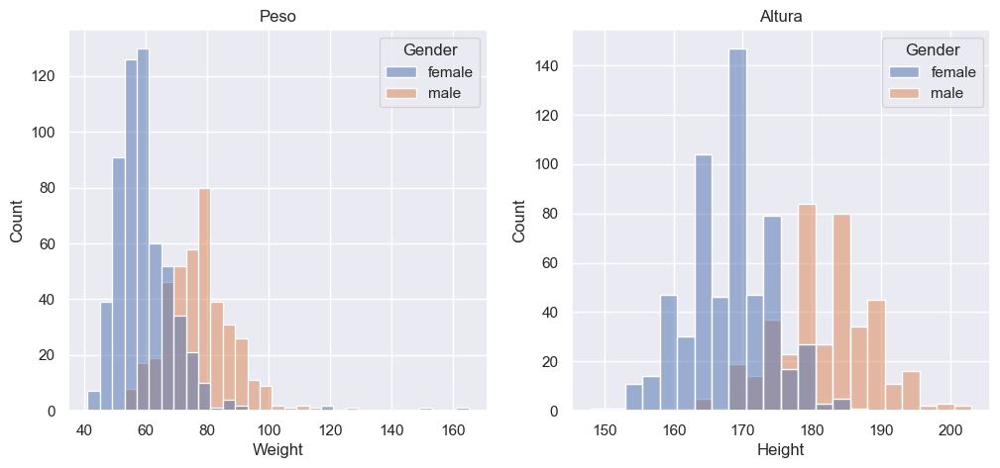

In [19]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,5))

sns.histplot(data=df, x='Weight', hue='Gender', ax=axes[0]).set_title('Peso')
sns.histplot(data=df, x='Height', hue='Gender', ax=axes[1]).set_title('Altura')
plt.show()

También sabemos que la edad tiene un efecto en el peso y la altura

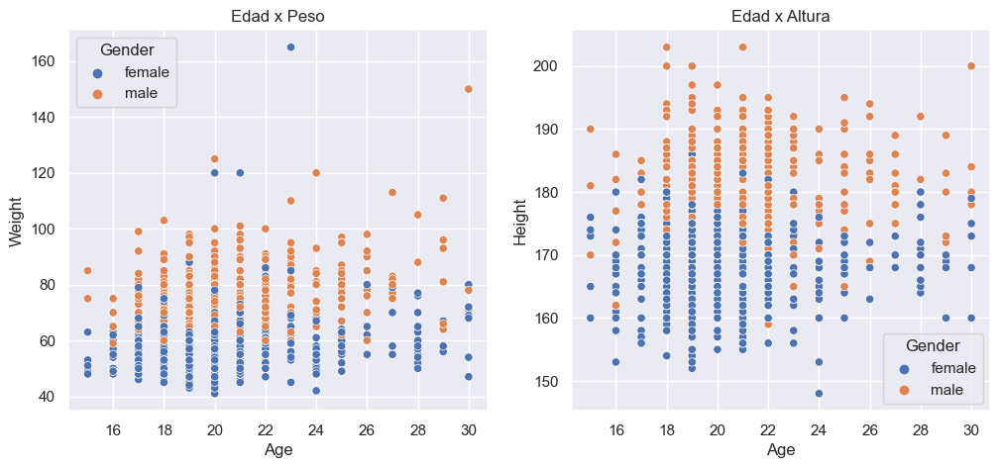

In [20]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,5))

ax = sns.scatterplot(x=df['Age'], y=df['Weight'], hue=df['Gender'], ax=axes[0]).set_title('Edad x Peso')
ax = sns.scatterplot(x=df['Age'], y=df['Height'], hue=df['Gender'], ax=axes[1]).set_title('Edad x Altura')

plt.show()

Usando esta información, podemos crear diccionarios con peso y altura que contenga el promedio para cada edad, separados por géneros. Los utilizaremos para rellenar filas en las que el peso y la altura sean nulos, e imputar el género basandonos en que tan cercano son los valores de ese individuo en peso y altura.

In [21]:
#Que ID tienen los datos faltante para Género
df.loc[df['Gender'].isnull(), ['Gender', 'Height', 'Weight', 'Age']]


,Gender,Height,Weight,Age
137,NaN,NaN,NaN,NaN
201,NaN,168.00,56.00,18.00
226,NaN,164.00,54.00,25.00
542,NaN,182.00,92.00,29.00
621,NaN,183.00,65.00,20.00
934,NaN,163.00,54.00,19.00


In [22]:
#Diccionarios con la media del peso y altura dependiendo del género
dic_mujer_edad_peso= {}
dic_hombre_edad_peso = {}
dic_mujer_edad_altura = {}
dic_hombre_edad_altura = {}

#Para valores únicos de edad para mujeres
for i in df[df['Gender'] == 'female']['Age'].unique():
    dic_mujer_edad_altura[i] = df.loc[(df['Age'] == i) & (df['Gender'] == 'female'), 'Height'].mean()
    dic_mujer_edad_peso[i] = df.loc[(df['Age'] == i) & (df['Gender'] == 'female'), 'Weight'].mean()

#Para valores únicos de edad para hombres
for i in df[df['Gender'] == 'male']['Age'].unique():
    dic_hombre_edad_altura[i] = df.loc[(df['Age'] == i) & (df['Gender'] == 'male'), 'Height'].mean()
    dic_hombre_edad_peso[i] = df.loc[(df['Age'] == i) & (df['Gender'] == 'male'), 'Weight'].mean()

#Iterando sobre los datos faltantes para género y que no tenga nulo el valor de peso
for i in df.loc[(df['Gender'].isnull()) & (df['Weight'].notnull())]['ID']:
    dif_altura_hombre = abs(df.loc[df['ID'] == i, 'Height'].values[0] - dic_hombre_edad_altura[df.loc[df['ID'] == i, 'Age'].values[0]])
    dif_peso_hombre = abs(df.loc[df['ID'] == i, 'Weight'].values[0] - dic_hombre_edad_peso[df.loc[df['ID'] == i, 'Age'].values[0]])
    dif_altura_mujer = abs(df.loc[df['ID'] == i, 'Height'].values[0] - dic_mujer_edad_altura[df.loc[df['ID'] == i, 'Age'].values[0]])
    dif_peso_mujer = abs(df.loc[df['ID'] == i, 'Weight'].values[0] - dic_mujer_edad_peso[df.loc[df['ID'] == i, 'Age'].values[0]])
    if (dif_altura_hombre < dif_altura_mujer) & (dif_peso_hombre < dif_peso_mujer):
        df.loc[df['ID'] == i, 'Gender'] = 'male'
    if (dif_altura_mujer < dif_altura_hombre) & (dif_peso_mujer < dif_peso_hombre):
        df.loc[df['ID'] == i, 'Gender'] = 'female'

df[df['ID'].isin([137,201,226,542,621,934])][['Gender', 'Height', 'Weight', 'Age']]

,Gender,Height,Weight,Age
137,NaN,NaN,NaN,NaN
201,female,168.00,56.00,18.00
226,female,164.00,54.00,25.00
542,male,182.00,92.00,29.00
621,NaN,183.00,65.00,20.00
934,female,163.00,54.00,19.00


Hemos podido ocuparnos de todas las filas nulas de género excepto dos. El primero tiene valores nulos para altura y peso, por lo que no se puede hacer mucho allí. La otra es una excepción a nuestra lógica anterior, ya que la altura es más cercana a la del hombre promedio de la misma edad y el peso es similar al de la mujer promedio de la misma edad.

Si observamos las distribuciones de altura y peso anteriores, si bien es más probable que una mujer pese 65 kg que un hombre, es mucho más probable que un hombre mida 183 cm que una mujer, por lo que, si bien es un poco arbitrario, supondremos que es hombre.

In [23]:
df.loc[df['ID'] == 621, 'Gender'] = 'male'


Para Educación, solo tenemos una fila con un valor nulo:

In [24]:
df[df['Education'].isnull()]

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,Punk,"Hiphop, Rap","Reggae, Ska","Swing, Jazz",Rock n roll,Alternative,Latino,"Techno, Trance",Opera,Movies,Horror,Thriller,Comedy,Romantic,Sci-fi,War,Fantasy/Fairy tales,Animated,Documentary,Western,Action,History,Psychology,Politics,Mathematics,Physics,Internet,PC,Economy Management,Biology,Chemistry,Reading,Geography,Foreign languages,Medicine,Law,Cars,Art exhibitions,Religion,"Countryside, outdoors",Dancing,Musical instruments,Writing,Passive sport,Active sport,Gardening,Celebrities,Shopping,Science and technology,Theatre,Fun with friends,Adrenaline sports,Pets,Flying,Storm,Darkness,Heights,Spiders,Snakes,Rats,Ageing,Dangerous dogs,Fear of public speaking,Smoking,Alcohol,Healthy eating,Daily events,Prioritising workload,Writing notes,Workaholism,Thinking ahead,Final judgement,Reliability,Keeping promises,Loss of interest,Friends versus money,Funniness,Fake,Criminal damage,Decision making,Elections,Self-criticism,Judgment calls,Hypochondria,Empathy,Eating to survive,Giving,Compassion to animals,Borrowed stuff,Loneliness,Cheating in school,Health,Changing the past,God,Dreams,Charity,Number of friends,Punctuality,Lying,Waiting,New environment,Mood swings,Appearence and gestures,Socializing,Achievements,Responding to a serious letter,Children,Assertiveness,Getting angry,Knowing the right people,Public speaking,Unpopularity,Life struggles,Happiness in life,Energy levels,Small - big dogs,Personality,Finding lost valuables,Getting up,Interests or hobbies,Parents' advice,Questionnaires or polls,Internet usage,Finances,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Age,Height,Weight,Number of siblings,Gender,Left - right handed,Education,Only child,Village - town,House - block of flats,ID
831,5.00,NaN,4.00,2.00,4.00,4.00,4.00,5.00,4.00,3.00,4.00,5.00,4.00,4.00,5.00,3.00,4.00,3.00,4.00,5.00,5.00,5.00,5.00,4.00,4.00,4.00,4.00,4.00,3.00,3.00,4.00,4.00,3.00,3.00,3.00,2.00,5.00,3.00,4.00,3.00,3.00,3.00,3.00,5.00,3.00,5.00,5.00,5.00,4.00,4.00,3.00,2.00,2.00,4.00,1.00,2.00,4.00,4.00,4.00,4.00,5.00,4.00,3.00,3.00,3.00,3.00,1.00,3.00,3,3.00,2.00,4.00,2.00,tried smoking,social drinker,3.00,3.00,3.00,4.00,3.00,3.00,4.00,5.00,5.00,4.00,5.00,4.00,1.00,1.00,2.00,2.00,2.00,4.00,2.00,4.00,3,2.00,4.00,4.00,3.00,5.00,3.00,3.00,5.00,3,2.00,5,i am always on time,only to avoid hurting someone,3.00,3.00,3.00,4.00,4.00,3.00,4.00,3.00,3.00,3.00,5.00,4.00,4.00,2.00,4.00,4.00,1.00,4.00,3.00,4.00,3.00,4.00,4.00,few hours a day,3.00,5.00,3.00,2.00,4.00,3,4.00,17.00,170.00,50.00,2.00,female,right handed,NaN,0,village,house/bungalow,831


Después de leer sobre la educación en Eslovaquia, nos dimos cuenta que la edad típica de alguien en su último año de escuela primaria es de 14 a 15 años, y de 18 a 19 años para la escuela secundaria, por lo que usaremos la escuela secundaria para completar el valor nulo.

In [25]:
df.loc[df['ID'] == 831, 'Education'] = 'secondary school'


Ahora veamos las variables de de Ciudad o Pueblo, con el tipo de vivienda.

Como se puede observar alguien que vive en la ciudad tiene muchas más probabilidades de vivir en un bloque de pisos que en una casa, mientras que ocurre lo contrario para aquellos que viven en un pueblo.

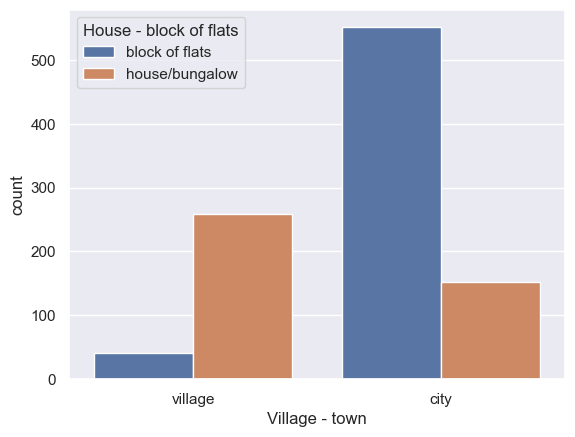

In [26]:
sns.countplot(x=df['Village - town'], hue=df['House - block of flats'])
plt.show()

Usemos esta información para imputar valores para ambas variables.

In [27]:
df.loc[(df['Village - town'].isnull()) & (df['House - block of flats'] == 'block of flats'), 'Village - town'] = 'city'
df.loc[(df['Village - town'].isnull()) & (df['House - block of flats'] == 'house/bungalow'), 'Village - town'] = 'village'
df.loc[(df['House - block of flats'].isnull()) & (df['Village - town'] == 'city'), 'House - block of flats'] = 'block of flats'
df.loc[(df['House - block of flats'].isnull()) & (df['Village - town'] == 'village'), 'House - block of flats'] = 'house/bungalow'

A continuación, veamos las filas donde Peso, Altura o Edad son nulos.

In [28]:
df.loc[(df['Height'].isnull()) | (df['Weight'].isnull()) | (df['Age'].isnull())][['Age', 'Weight', 'Height', 'Gender']].head()

,Age,Weight,Height,Gender
51,19.00,75.00,NaN,female
137,NaN,NaN,NaN,NaN
142,NaN,NaN,NaN,male
164,20.00,NaN,188.00,male
209,21.00,NaN,NaN,male


In [29]:
for i in df.loc[(df['Weight'].isnull()) & (df['Age'].notnull()) & (df['Gender'] == 'male')]['ID']:
    df.loc[df['ID'] == i, 'Weight'] = dic_hombre_edad_peso[df.loc[df['ID'] == i, 'Age'].values[0]]

for i in df.loc[(df['Height'].isnull()) & (df['Age'].notnull()) & (df['Gender'] == 'male')]['ID']:
    df.loc[df['ID'] == i, 'Height'] = dic_hombre_edad_altura[df.loc[df['ID'] == i, 'Age'].values[0]]

for i in df.loc[(df['Weight'].isnull()) & (df['Age'].notnull()) & (df['Gender'] == 'female')]['ID']:
    df.loc[df['ID'] == i, 'Weight'] = dic_mujer_edad_peso[df.loc[df['ID'] == i, 'Age'].values[0]]

for i in df.loc[(df['Height'].isnull()) & (df['Age'].notnull()) & (df['Gender'] == 'female')]['ID']:
    df.loc[df['ID'] == i, 'Height'] = dic_mujer_edad_altura[df.loc[df['ID'] == i, 'Age'].values[0]]

df.loc[(df['Height'].isnull()) | (df['Weight'].isnull()) | (df['Age'].isnull())][['Age', 'Weight', 'Height', 'Gender']]


,Age,Weight,Height,Gender
137,NaN,NaN,NaN,NaN
142,NaN,NaN,NaN,male
462,NaN,60.00,NaN,female
549,NaN,51.00,166.00,female
735,NaN,67.00,165.00,female
902,NaN,NaN,NaN,male
960,NaN,NaN,NaN,female


También podemos estimar los valores de Edad faltantes utilizando la columna Educación. Si las filas a las que les faltan valores de edad tienen un valor de Educación, podemos usar el valor mediano para ese nivel de educación para imputar valores.

In [30]:
df.loc[(df['Age'].isnull()) & (df['Education'] == 'college/bachelor degree'), 'Age'] = 21
df.loc[(df['Age'].isnull()) & (df['Education'] == 'masters degree'), 'Age'] = 26

for i in df.loc[(df['Weight'].isnull()) & (df['Age'].notnull()) & (df['Gender'] == 'male')]['ID']:
    df.loc[df['ID'] == i, 'Weight'] = dic_hombre_edad_peso[df.loc[df['ID'] == i, 'Age'].values[0]]

for i in df.loc[(df['Height'].isnull()) & (df['Age'].notnull()) & (df['Gender'] == 'male')]['ID']:
    df.loc[df['ID'] == i, 'Height'] = dic_hombre_edad_altura[df.loc[df['ID'] == i, 'Age'].values[0]]

for i in df.loc[(df['Weight'].isnull()) & (df['Age'].notnull()) & (df['Gender'] == 'female')]['ID']:
    df.loc[df['ID'] == i, 'Weight'] = dic_mujer_edad_peso[df.loc[df['ID'] == i, 'Age'].values[0]]

for i in df.loc[(df['Height'].isnull()) & (df['Age'].notnull()) & (df['Gender'] == 'female')]['ID']:
    df.loc[df['ID'] == i, 'Height'] = dic_mujer_edad_altura[df.loc[df['ID'] == i, 'Age'].values[0]]

df.loc[(df['Height'].isnull()) | (df['Weight'].isnull()) | (df['Age'].isnull())][['Age', 'Weight', 'Height', 'Gender']]

,Age,Weight,Height,Gender
137,NaN,NaN,NaN,NaN
142,NaN,NaN,NaN,male


Ahora las únicas columnas restantes que no hemos tratado son las preguntas principales de la encuesta no categóricas. Podríamos simplemente imputar el promedio de estos, o el promedio a lo largo de una determinada dimensión como la edad o el sexo, pero posiblemente una mejor manera de hacerlo sería usar KNNImputer, que utiliza el algoritmo de vecinos más cercanos para imputar la media de n vecinos más cercanos para valores faltantes.

Una regla general sencilla sobre qué usar para K es la raíz cuadrada del número de muestras en el conjunto de datos, por lo que en nuestro caso K = 32.

In [31]:
cont_cols = ['Age', 'Height', 'Weight', 'Number of siblings', 'ID']
non_ord_cols = cont_cols + cat_cols
ord_cols = df.drop(columns=non_ord_cols).columns.to_list()

df[df['Passive sport'].isnull()].head()

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,Punk,"Hiphop, Rap","Reggae, Ska","Swing, Jazz",Rock n roll,Alternative,Latino,"Techno, Trance",Opera,Movies,Horror,Thriller,Comedy,Romantic,Sci-fi,War,Fantasy/Fairy tales,Animated,Documentary,Western,Action,History,Psychology,Politics,Mathematics,Physics,Internet,PC,Economy Management,Biology,Chemistry,Reading,Geography,Foreign languages,Medicine,Law,Cars,Art exhibitions,Religion,"Countryside, outdoors",Dancing,Musical instruments,Writing,Passive sport,Active sport,Gardening,Celebrities,Shopping,Science and technology,Theatre,Fun with friends,Adrenaline sports,Pets,Flying,Storm,Darkness,Heights,Spiders,Snakes,Rats,Ageing,Dangerous dogs,Fear of public speaking,Smoking,Alcohol,Healthy eating,Daily events,Prioritising workload,Writing notes,Workaholism,Thinking ahead,Final judgement,Reliability,Keeping promises,Loss of interest,Friends versus money,Funniness,Fake,Criminal damage,Decision making,Elections,Self-criticism,Judgment calls,Hypochondria,Empathy,Eating to survive,Giving,Compassion to animals,Borrowed stuff,Loneliness,Cheating in school,Health,Changing the past,God,Dreams,Charity,Number of friends,Punctuality,Lying,Waiting,New environment,Mood swings,Appearence and gestures,Socializing,Achievements,Responding to a serious letter,Children,Assertiveness,Getting angry,Knowing the right people,Public speaking,Unpopularity,Life struggles,Happiness in life,Energy levels,Small - big dogs,Personality,Finding lost valuables,Getting up,Interests or hobbies,Parents' advice,Questionnaires or polls,Internet usage,Finances,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Age,Height,Weight,Number of siblings,Gender,Left - right handed,Education,Only child,Village - town,House - block of flats,ID
83,5.00,3.00,5.00,1.00,2.00,4.00,4.00,5.00,5.00,3.00,1.00,3.00,2.00,4.00,3.00,1.00,5.00,5.00,3.00,5.00,3.00,5.00,5.00,5.00,1.00,1.00,5.00,5.00,5.00,1.00,5.00,NaN,2.00,1.00,1.00,1.00,5.00,3.00,3.00,5.00,3.00,2.00,2.00,4.00,5.00,5.00,4.00,3.00,1.00,5.00,3.00,1.00,1.00,NaN,1.00,3.00,1.00,3.00,3.00,5.00,5.00,5.00,5.00,3.00,4.00,5.00,3.00,5.00,4,4.00,3.00,3.00,3.00,former smoker,social drinker,3.00,1.00,3.00,5.00,3.00,3.00,3.00,5.00,4.00,1.00,3.00,5.00,2.00,2.00,2.00,5.00,1.00,4.00,1.00,5.00,1,5.00,5.00,5.00,2.00,5.00,5.00,5.00,4.00,3,3.00,4,i am always on time,sometimes,3.00,5.00,5.00,5.00,3.00,3.00,1.00,5.00,5.00,5.00,3.00,3.00,3.00,5.00,3.00,4.00,1.00,3.00,4.00,5.00,3.00,2.00,3.00,few hours a day,3.00,3.00,1.00,3.00,5.00,5,5.00,22.00,163.00,53.00,2.00,female,right handed,secondary school,0,city,block of flats,83
202,5.00,3.00,5.00,1.00,1.00,1.00,1.00,3.00,2.00,1.00,1.00,5.00,3.00,1.00,1.00,1.00,1.00,4.00,1.00,5.00,5.00,3.00,5.00,2.00,5.00,5.00,4.00,4.00,2.00,3.00,5.00,2.00,2.00,2.00,1.00,1.00,4.00,4.00,3.00,5.00,4.00,1.00,3.00,5.00,3.00,1.00,4.00,1.00,1.00,2.00,5.00,2.00,1.00,NaN,4.00,1.00,3.00,4.00,4.00,1.00,5.00,3.00,4.00,1.00,1.00,2.00,2.00,4.00,4,3.00,2.00,3.00,1.00,never smoked,never,2.00,3.00,3.00,1.00,2.00,5.00,3.00,3.00,4.00,5.00,5.00,3.00,1.00,5.00,4.00,1.00,4.00,4.00,3.00,4.00,2,4.00,5.00,5.00,3.00,5.00,3.00,1.00,1.00,4,4.00,4,i am often early,sometimes,2.00,5.00,4.00,5.00,3.00,2.00,4.00,3.00,4.00,3.00,3.00,2.00,4.00,1.00,4.00,4.00,4.00,4.00,2.00,4.00,3.00,2.00,3.00,few hours a day,3.00,3.00,5.00,2.00,4.00,2,2.00,15.00,181.00,63.00,0.00,male,right handed,primary school,1,city,block of flats,202
330,5.00,3.00,4.00,2.00,1.00,4.00,3.00,3.00,5.00,3.00,3.00,3.00,2.00,3.00,3.00,4.00,NaN,3.00,2.00,5.00,1.00,1.00,5.00,3.00,4.00,2.00,4.00,4.00,4.00,1.00,3.00,4.00,3.00,2.00,1.00,2.00,4.00,3.00,1.00,2.00,1.00,1.00,3.00,5.00,NaN,1.00,1.00,2.00,2.00,3.00,1.00,1.00,1.00,NaN,4.00,1.00,4.00,3.00,3.00,5.00,4.00,1.00,5.00,3.00,5.00,4.00,3.00,5.00,3,NaN,4.00,4.00,5.00,tried smoking,social drinker,2.00,3.00,1.00,4.00,3.00,3.00,3.00,NaN,3.00,2.00,4.00,2.00,2.00,2.00,4.00,2.00,3.00,3.00,

In [32]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=32, weights='distance')

cont_cols = ['Age', 'Height', 'Weight', 'Number of siblings', 'ID']
non_ord_cols = cont_cols + cat_cols
ord_cols = df.drop(columns=non_ord_cols).columns.to_list()

df[ord_cols] = imputer.fit_transform(df[ord_cols]).round(0)

In [33]:
print(len(df))
print(len(df.dropna()))

1010
1008


Ahora hemos reducido el número de filas con valores faltantes a solo 2 entradas. Dado que se trata de un número tan pequeño, continuaremos y los eliminaremos.

In [34]:
df.dropna(inplace=True)


## Modificacion del nombre de columnas 


In [35]:
cambio_nombre = ['Listen to music', 'Prefer slow or fast songs', 'Dance, Disco, Funk', 'Folk music', 'Country', 'Classical', 'Musicals', 'Pop', 'Rock', 'Metal, Hard rock', 'Punk', 'Hip hop, Rap', 'Reggae, Ska', 'Swing, Jazz', 'Rock n Roll', 'Alternative music', 'Latin', 'Techno, Trance', 'Opera', 'Enjoy watching movies', 'Horror movies', 'Thriller movies', 'Comedy movies', 'Romantic movies', 'Sci-fi movies', 'War movies', 'Tales', 'Cartoons', 'Documentaries', 'Western movies', 'Action movies', 'History', 'Psychology', 'Politics', 'Mathematics', 'Physics', 'Internet', 'PC Software, Hardware', 'Economy, Management', 'Biology', 'Chemistry', 'Poetry reading', 'Geography', 'Foreign languages', 'Medicine', 'Law', 'Cars', 'Art', 'Religion', 'Outdoor activities', 'Dancing', 'Playing musical instruments', 'Poetry writing', 'Sport and leisure activities', 'Sport at competitive level', 'Gardening', 'Celebrity lifestyle', 'Shopping', 'Science and technology', 'Theatre', 'Socializing', 'Adrenaline sports', 'Pets', 'Flying', 'Thunder, lightning', 'Darkness', 'Heights', 'Spiders', 'Snakes', 'Rats, mice', 'Ageing', 'Dangerous dogs', 'Public speaking', 'Smoking habits', 'Drinking', 'Live a very healthy lifestyle', 'Take notice of what goes on around', 'Try to do tasks as soon as possible and not leave them until last minute', 'Always make a list so I don\'t forget anything', 'Often study or work even in spare time', 'Look at things from all different angles before go ahead', 'Believe that bad people will suffer one day and good people will be rewarded', 'Reliable at work and always complete all tasks given to me', 'Always keep my promises', 'Can fall for someone very quickly and then completely lose interest', 'Would rather have lots of friends than lots of money', 'Always try to be the funniest one', 'Can be two-faced sometimes', 'Damaged things in the past when angry', 'Take my time to make decisions', 'Always try to vote in elections', 'Often think about and regret the decisions I make', 'Can tell if people listen to me or not when talk to them', 'A hypochondriac', 'An empathetic person', "Eat because I have to. Don't enjoy food and eat as fast as can", 'Try to give as much as can to other people at Christmas', "Don't like seeing animals suffering", 'Look after things have borrowed from others', 'Feel lonely in life', 'Used to cheat at school', 'Worry about my health', 'Wish I could change the past because of things have done', 'Believe in God', 'Always have good dreams', 'Always give to charity', 'Have lots of friends', 'Timekeeping', 'Do lie to others', 'Very patient', 'Can quickly adapt to a new environment', 'Moods change quickly', 'Well-mannered and look after my appearance', 'Enjoy meeting new people', 'Always let other people know about my achievements', 'Think carefully before answering any important letters', "Enjoy children's company", 'Not afraid to give my opinion if feel strongly about something', 'Can get angry very easily', 'Always make sure connect with the right people', 'Have to be well-prepared before public speaking', "Will find a fault in myself if people don't like me", "Cry when feel down or things don't go the right way", '100% happy with my life', 'Always full of life and energy', 'Prefer big dangerous dogs to smaller, calmer dogs', 'Believe all personality traits are positive', "If find something that doesn't belong to me, will hand it in", 'Find it very difficult to get up in the morning', 'Have many different hobbies and interests', "Always listen to my parents' advice", 'Enjoy taking part in surveys', 'How much time spend online', 'Save all the money can', 'Enjoy going to large shopping centers', 'Prefer branded clothing to non-branded', 'Spend a lot of money on partying and socializing', 'Spend a lot of money on my appearance', 'Spend a lot of money on gadgets', 'Will happily pay more money for good, quality, or healthy food', 'Age', 'Height', 'Weight', 'How many siblings do have', 'Gender', 'Left-handed or right-handed', 'Highest education achieved', 'The only child', 'Spent most of childhood in a village or town', 'Lived most of childhood in a house or block of flats']

df.rename(columns=dict(zip(df.columns, cambio_nombre)), inplace=True)

Como vemos, ahora la mayoría de las variables son más interpretables, ya que anteriormente existian variables difíciles de interpretar por su nombre

In [36]:
df.columns.tolist()[:5]

['Listen to music',
 'Prefer slow or fast songs',
 'Dance, Disco, Funk',
 'Folk music',
 'Country']

## Recodificación de columnas alfanuméricas a numéricas


In [37]:
columnas_alfanumericas = df.select_dtypes(include='object').columns

print(f"Columnas alfanuméricas: {columnas_alfanumericas}")



Columnas alfanuméricas: Index(['Smoking habits', 'Drinking', 'Timekeeping', 'Do lie to others',
       'How much time spend online', 'Gender', 'Left-handed or right-handed',
       'Highest education achieved',
       'Spent most of childhood in a village or town',
       'Lived most of childhood in a house or block of flats'],
      dtype='object')


In [38]:
df['Timekeeping'].unique()

array(['i am always on time', 'i am often early',
       'i am often running late'], dtype=object)

In [39]:
df['Do lie to others'].unique()

array(['never', 'sometimes', 'only to avoid hurting someone',
       'everytime it suits me'], dtype=object)

In [40]:
df['How much time spend online'].unique()

array(['few hours a day', 'most of the day', 'less than an hour a day',
       'no time at all'], dtype=object)

In [41]:
df['Gender'].unique()

array(['female', 'male'], dtype=object)

In [42]:
df['Left-handed or right-handed'].unique()

array(['right handed', 'left handed'], dtype=object)

In [43]:
df['Highest education achieved'].unique()

array(['college/bachelor degree', 'secondary school', 'primary school',
       'masters degree', 'doctorate degree',
       'currently a primary school pupil'], dtype=object)

In [44]:
df['Spent most of childhood in a village or town'].unique()

array(['village', 'city'], dtype=object)

In [45]:
df['Lived most of childhood in a house or block of flats'].unique()

array(['block of flats', 'house/bungalow'], dtype=object)

### Vemos que hay variables que solo tienen 3 posibles valores, esto es algo problemático ya que hace dificil sacar la media  (valor ópitimo = 5), así que lo debemos tener el cuenta posteriormente

### Variable 'Timekeeping'

In [46]:
for x in df['Timekeeping']:
      if x == "i am always on time":
          df.replace(x, 2, inplace=True)
      elif x == "i am often early":
          df.replace(x, 1, inplace=True)
      elif x == "i am often running late":
          df.replace(x, 0, inplace=True)
      elif x == "Nan":
          df.replace(x, np.nan, inplace=True)
      elif x == "nan":
          df.replace(x, np.nan, inplace=True)

In [47]:
df['Timekeeping'].unique()

array([2, 1, 0], dtype=int64)

### Variable 'Do lie to others'

In [48]:
for x in df['Do lie to others']:
      if x == "everytime it suits me":
          df.replace(x, 3, inplace=True)
      elif x == "only to avoid hurting someone":
          df.replace(x, 2, inplace=True)
      elif x == "sometimes":
          df.replace(x, 1, inplace=True)
      elif x == 0:
          df.replace(x, 0, inplace=True)
      elif x == "Nan":
          df.replace(x, np.nan, inplace=True)
      elif x == "nan":
          df.replace(x, np.nan, inplace=True)

In [49]:
df['Do lie to others'].unique()

array(['never', 1, 2, 3], dtype=object)

### Variable 'How much time spend online'

In [50]:
for x in df['How much time spend online']:
      if x == "most of the day":
          df.replace(x, 3, inplace=True)
      elif x == "few hours a day":
          df.replace(x, 2, inplace=True)
      elif x == "less than an hour a day":
          df.replace(x, 1, inplace=True)
      elif x == "no time at all":
          df.replace(x, 0, inplace=True)
      elif x == "Nan":
          df.replace(x, np.nan, inplace=True)
      elif x == "nan":
          df.replace(x, np.nan, inplace=True)

In [51]:
df['How much time spend online'].unique()

array([2, 3, 1, 0], dtype=int64)

### Variable 'Gender'

In [52]:
for x in df['Gender']:
      if x == "male":
          df.replace(x, 1, inplace=True)
      elif x == "female":
          df.replace(x, 0, inplace=True)
      elif x == "Nan":
          df.replace(x, np.nan, inplace=True)
      elif x == "nan":
          df.replace(x, np.nan, inplace=True)

In [53]:
df['Gender'].unique()

array([0, 1], dtype=int64)

### Variable 'Left-handed or right-handed'

In [54]:
for x in df['Left-handed or right-handed']:
      if x == "right handed":
          df.replace(x, 1, inplace=True)
      elif x == "left handed":
          df.replace(x, 0, inplace=True)
      elif x == "Nan":
          df.replace(x, np.nan, inplace=True)
      elif x == "nan":
          df.replace(x, np.nan, inplace=True)

In [55]:
df['Left-handed or right-handed'].unique()

array([1, 0], dtype=int64)

### Variable 'Highest education achieved'

Esta variable no tiene mucho sentido recodificarla, pero con tal de que el código no de errores al hacer cálculos, la recodificamos de menor a mayor nivel educativo

In [56]:
for x in df['Highest education achieved']:
      if x == "doctorate degree":
          df.replace(x, 4, inplace=True)
      if x == "masters degree":
          df.replace(x, 4, inplace=True)
      if x == "college/bachelor degree":
          df.replace(x, 3, inplace=True)
      if x == "secondary school":
          df.replace(x, 2, inplace=True)
      if x == "primary school":
          df.replace(x, 1, inplace=True)
      elif x == "currently a primary school pupil":
          df.replace(x, 0, inplace=True)
      elif x == "Nan":
          df.replace(x, np.nan, inplace=True)
      elif x == "nan":
          df.replace(x, np.nan, inplace=True)

In [57]:
df['Highest education achieved'].unique()

array([3, 2, 1, 4, 0], dtype=int64)

### Variable 'Spent most of childhood in a village or town'

In [58]:
for x in df['Spent most of childhood in a village or town']:
      if x == "city":
          df.replace(x, 1, inplace=True)
      elif x == "village":
          df.replace(x, 0, inplace=True)
      elif x == "Nan":
          df.replace(x, np.nan, inplace=True)
      elif x == "nan":
          df.replace(x, np.nan, inplace=True)

In [59]:
df['Spent most of childhood in a village or town'].unique()

array([0, 1], dtype=int64)

### Variable 'Lived most of childhood in a house or block of flats'

In [60]:
for x in df['Lived most of childhood in a house or block of flats']:
      if x == "block of flats":
          df.replace(x, 1, inplace=True)
      elif x == "house/bungalow":
          df.replace(x, 0, inplace=True)
      elif x == "Nan":
          df.replace(x, np.nan, inplace=True)
      elif x == "nan":
          df.replace(x, np.nan, inplace=True)

In [61]:
df['Lived most of childhood in a house or block of flats'].unique()

array([1, 0], dtype=int64)

### Variable 'Smoking habits'

In [62]:
for x in df['Smoking habits']:
      if x == "current smoker":
          df.replace(x, 3, inplace=True)
      elif x == "former smoker":
          df.replace(x, 2, inplace=True)
      elif x == "tried smoking":
          df.replace(x, 1, inplace=True)
      elif x == "never smoked":
          df.replace(x, 0, inplace=True)
      elif x == "Nan":
          df.replace(x, np.nan, inplace=True)
      elif x == "nan":
          df.replace(x, np.nan, inplace=True)

In [63]:
df['Smoking habits'].unique()

array([0, 1, 2, 3], dtype=int64)

### Variable 'Drinking'

In [64]:
for x in df["Drinking"]:
    if x == "drink a lot":
        df.replace(x, 2, inplace=True)
    elif x == "social drinker":
        df.replace(x, 1, inplace=True)
    elif x == "never":
        df.replace(x, 0, inplace=True)
    elif x == "Nan":
        df.replace(x, np.nan, inplace=True)
    elif x == "nan":
        df.replace(x, np.nan, inplace=True)

In [65]:
df['Drinking'].unique()

array([2, 1, 0], dtype=int64)

In [66]:
columnas_alfanumericas = df.select_dtypes(include='object').columns

print(f"Columnas alfanuméricas: {columnas_alfanumericas}")

Columnas alfanuméricas: Index([], dtype='object')


# Descripción general de los Datos

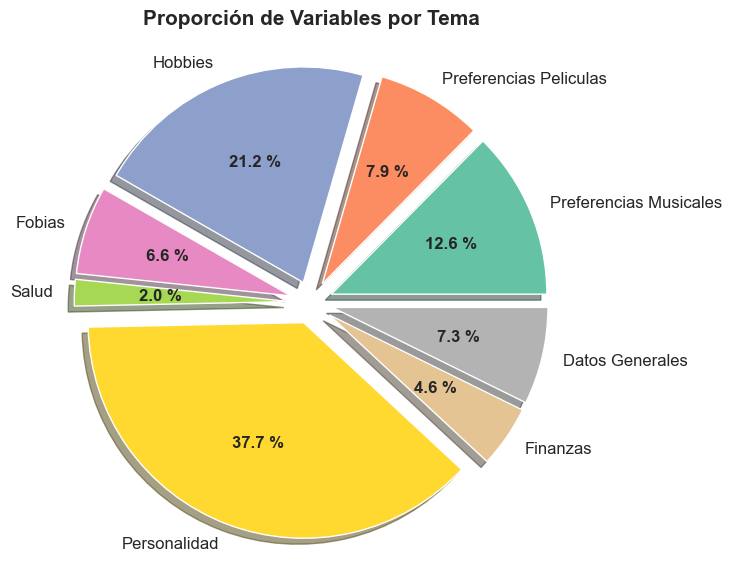

In [67]:

#Gráfico de sectores para ver la proporción de cada tema encuestado
preferenciasMusicales = df.columns[:19]
preferenciasPeliculas = df.columns[19:31]
hobbies = df.columns[31:63]
fobias = df.columns[63:73]
salud = df.columns[73:76]
personalidad = df.columns[76:133]
finanzas = df.columns[133:140]
datosEncuestados = df.columns[140:]

"""
Para ello voy a ver la longitud de las listas que tienen las variables clasificadas por cada tema
"""
lista_colors = ['#66c2a5', '#fc8d62', '#8da0cb', '#e78ac3', '#a6d854', '#ffd92f', '#e5c494', '#b3b3b3']
#Creo un diccionario con la longitud de cada tema
dicVariablesTemas = {
    'Preferencias Musicales': len(preferenciasMusicales),
    'Preferencias Peliculas': len(preferenciasPeliculas),
    'Hobbies': len(hobbies),
    'Fobias': len(fobias),
    'Salud': len(salud),
    'Personalidad': len(personalidad),
    'Finanzas': len(finanzas),
    'Datos Generales': len(datosEncuestados)
}
total_variables = sum(dicVariablesTemas.values())
porcentajes = [100 * valor / total_variables for valor in dicVariablesTemas.values()]

#Colores suaves y diferenciados
lista_colors = ['#66c2a5', '#fc8d62', '#8da0cb', '#e78ac3', '#a6d854', '#ffd92f', '#e5c494', '#b3b3b3']

plt.figure(figsize=(7, 7))
wedges, texts, autotexts = plt.pie(porcentajes, labels=dicVariablesTemas.keys(), autopct="%0.1f %%", colors=lista_colors, explode=(0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1), shadow=True)
plt.title('Proporción de Variables por Tema', fontweight='bold', fontsize=15)

#Añadir un círculo en el centro para que parezca más un donut
centro_circulo = plt.Circle((0, 0), 0.30, color='white')


#Cambiar el texto de las etiquetas a negrita y ajustar el tamaño de la fuente
for text in texts:
    text.set_fontsize(12)
for autotext in autotexts:
    autotext.set_fontweight('bold')
    autotext.set_fontsize(12)

plt.show()

In [68]:
df.describe()

,Listen to music,Prefer slow or fast songs,"Dance, Disco, Funk",Folk music,Country,Classical,Musicals,Pop,Rock,"Metal, Hard rock",Punk,"Hip hop, Rap","Reggae, Ska","Swing, Jazz",Rock n Roll,Alternative music,Latin,"Techno, Trance",Opera,Enjoy watching movies,Horror movies,Thriller movies,Comedy movies,Romantic movies,Sci-fi movies,War movies,Tales,Cartoons,Documentaries,Western movies,Action movies,History,Psychology,Politics,Mathematics,Physics,Internet,"PC Software, Hardware","Economy, Management",Biology,Chemistry,Poetry reading,Geography,Foreign languages,Medicine,Law,Cars,Art,Religion,Outdoor activities,Dancing,Playing musical instruments,Poetry writing,Sport and leisure activities,Sport at competitive level,Gardening,Celebrity lifestyle,Shopping,Science and technology,Theatre,Socializing,Adrenaline sports,Pets,Flying,"Thunder, lightning",Darkness,Heights,Spiders,Snakes,"Rats, mice",Ageing,Dangerous dogs,Public speaking,Smoking habits,Drinking,Live a very healthy lifestyle,Take notice of what goes on around,Try to do tasks as soon as possible and not leave them until last minute,Always make a list so I don't forget anything,Often study or work even in spare time,Look at things from all different angles before go ahead,Believe that bad people will suffer one day and good people will be rewarded,Reliable at work and always complete all tasks given to me,Always keep my promises,Can fall for someone very quickly and then completely lose interest,Would rather have lots of friends than lots of money,Always try to be the funniest one,Can be two-faced sometimes,Damaged things in the past when angry,Take my time to make decisions,Always try to vote in elections,Often think about and regret the decisions I make,Can tell if people listen to me or not when talk to them,A hypochondriac,An empathetic person,Eat because I have to. Don't enjoy food and eat as fast as can,Try to give as much as can to other people at Christmas,Don't like seeing animals suffering,Look after things have borrowed from others,Feel lonely in life,Used to cheat at school,Worry about my health,Wish I could change the past because of things have done,Believe in God,Always have good dreams,Always give to charity,Have lots of friends,Timekeeping,Do lie to others,Very patient,Can quickly adapt to a new environment,Moods change quickly,Well-mannered and look after my appearance,Enjoy meeting new people,Always let other people know about my achievements,Think carefully before answering any important letters,Enjoy children's company,Not afraid to give my opinion if feel strongly about something,Can get angry very easily,Always make sure connect with the right people,Have to be well-prepared before public speaking,Will find a fault in myself if people don't like me,Cry when feel down or things don't go the right way,100% happy with my life,Always full of life and energy,"Prefer big dangerous dogs to smaller, calmer dogs",Believe all personality traits are positive,"If find something that doesn't belong to me, will hand it in",Find it very difficult to get up in the morning,Have many different hobbies and interests,Always listen to my parents' advice,Enjoy taking part in surveys,How much time spend online,Save all the money can,Enjoy going to large shopping centers,Prefer branded clothing to non-branded,Spend a lot of money on partying and socializing,Spend a lot of money on my appearance,Spend a lot of money on gadgets,"Will happily pay more money for good, quality, or healthy food",Age,Height,Weight,How many siblings do have,Gender,Left-handed or right-handed,Highest education achieved,The only child,Spent most of childhood in a village or town,Lived most of childhood in a house or block of flats,ID
count,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008.00,1008

In [69]:
print(df.nunique().head())

Listen to music              5
Prefer slow or fast songs    5
Dance, Disco, Funk           5
Folk music                   5
Country                      5
dtype: int64


# Análisis multivariante

## Visualización segmentada

### Parte Género

In [70]:
df2 = df.copy()
#mujeres 0, hombres 1
diccionario_hombres = {}
diccionario_mujeres = {}

# Seleccionamos las columnas numéricas que no incluyen 'Gender' para luego poder filtrar
variables = df2.drop(columns=['Gender']).columns

# Calcular las medias para hombres y mujeres para cada columna usando el filtro y eliminando ciertas variables que no contienen informacion que nos interese para la visualización
for variable in variables:
    if variable != 'ID' and variable != 'Age' and variable != 'Height' and variable != 'Weight':
        media_hombres = df[df['Gender'] == 1][variable].mean()
        media_mujeres = df[df['Gender'] == 0][variable].mean()

        diccionario_hombres[variable] = media_hombres
        diccionario_mujeres[variable] = media_mujeres

# Ahora diccionario_hombres y diccionario_mujeres contienen las medias de cada variable para los hombres y para las mujeres respectivamente

In [71]:
# Pasamos el diccionario a un DataFrame y pasamos los indices a columna para luego poder plotear bien. Esto para los dos diccionarios
df_hombres = pd.DataFrame.from_dict(diccionario_hombres, orient='index', columns=['media'])
df_hombres.reset_index(inplace=True)

In [72]:
df_mujeres = pd.DataFrame.from_dict(diccionario_mujeres, orient='index', columns=['media'])
df_mujeres.reset_index(inplace=True)

In [73]:
df_hombres.head()

,index,media
0,Listen to music,4.65
1,Prefer slow or fast songs,3.40
2,"Dance, Disco, Funk",3.06
3,Folk music,2.23
4,Country,2.22


In [74]:
df_mujeres.head()

,index,media
0,Listen to music,4.79
1,Prefer slow or fast songs,3.28
2,"Dance, Disco, Funk",3.15
3,Folk music,2.33
4,Country,2.06


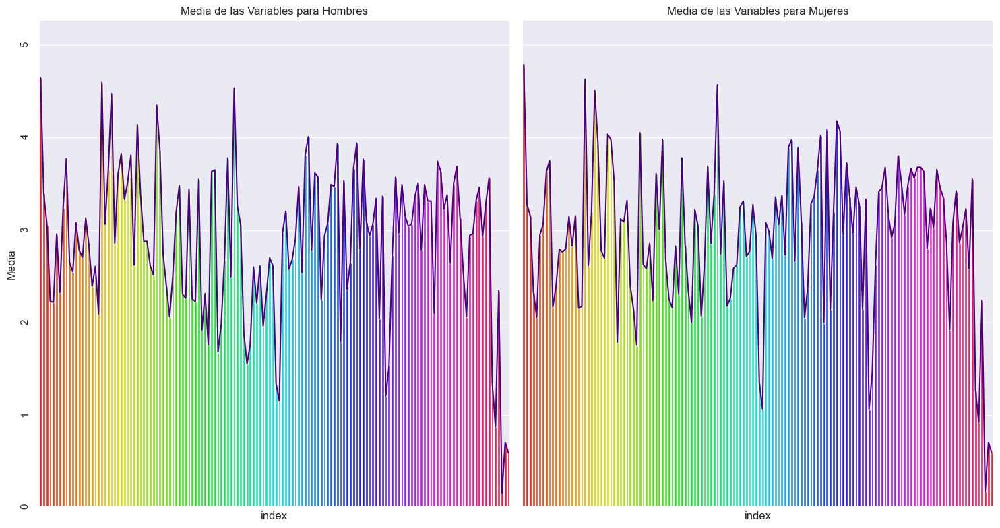

In [75]:
# Crear la figura y los ejes
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 8), sharey=True)


# Crear gráfico de barras para hombres
sns.lineplot(data=df_hombres, x='index', y='media', ax=axes[0], color = 'Indigo')
axes[0].set_title('Media de las Variables para Hombres')
#axes[0].set_xlabel('Variable')
axes[0].set_ylabel('Media')
axes[0].tick_params(rotation=90)  # Rotar las etiquetas del eje x para mejor legibilidad
axes[0].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)


sns.barplot(data=df_hombres, x='index', y='media', ax=axes[0], palette = 'hsv')
axes[0].set_title('Media de las Variables para Hombres')
#axes[2].set_xlabel('Variable')
axes[0].set_ylabel('Media')
axes[0].tick_params(rotation=90)  # Rotar las etiquetas del eje x para mejor legibilidad
axes[0].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

# Crear gráfico de barras para mujeres
sns.lineplot(data=df_mujeres, x='index', y='media', ax=axes[1], color = 'Indigo')
axes[1].set_title('Media de las Variables para Mujeres')
#axes[1].set_xlabel('Variable')
axes[1].tick_params(rotation=90)  # Rotar las etiquetas del eje x para mejor legibilidad
axes[1].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

sns.barplot(data=df_mujeres, x='index', y='media', ax=axes[1], palette = 'hsv')
axes[1].set_title('Media de las Variables para Mujeres')
#axes[3].set_xlabel('Variable')
axes[1].set_ylabel('Media')
axes[1].tick_params(rotation=90)  # Rotar las etiquetas del eje x para mejor legibilidad
axes[1].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

# Ajustar el layout para que no se solapen los gráficos
plt.tight_layout()


# Encontrar el valor máximo para establecer un límite común en el eje y
max_media = max(df_hombres['media'].max(), df_mujeres['media'].max())
axes[0].set_ylim(0, max_media * 1.1)  # Añadir un poco de margen en el límite superior
axes[1].set_ylim(0, max_media * 1.1)
plt.show()

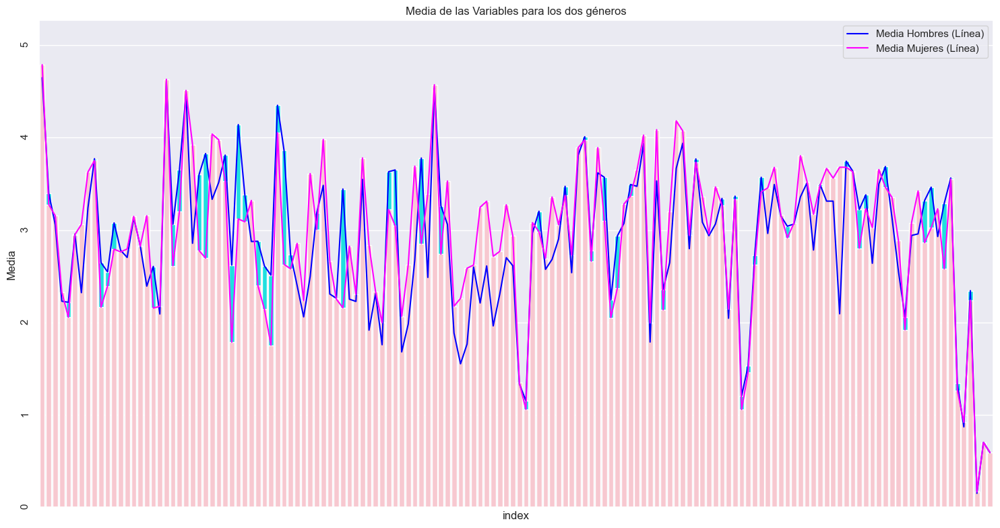

In [76]:
# Crear la figura y los ejes
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15, 8), sharey=True)


sns.set_palette("pastel")
# Crear gráfico de barras para hombres
sns.lineplot(data=df_hombres, x='index', y='media', color='blue', alpha=1, label='Media Hombres (Línea)')
axes.set_title('Media de las Variables para los dos géneros')
#axes.set_xlabel('Variable')
axes.set_ylabel('Media')
axes.tick_params(rotation=90)  # Rotar las etiquetas del eje x para mejor legibilidad
axes.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

sns.set_palette("pastel")
sns.barplot(data=df_hombres, x='index', y='media', color='cyan', alpha=1)
axes.set_title('Media de las Variables para los dos géneross')
#axes[2].set_xlabel('Variable')
axes.set_ylabel('Media')
axes.tick_params(rotation=90)  # Rotar las etiquetas del eje x para mejor legibilidad
axes.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

sns.set_palette("dark")
# Crear gráfico de barras para mujeres
sns.lineplot(data=df_mujeres, x='index', y='media', color='magenta', alpha=1, label='Media Mujeres (Línea)')
axes.set_title('Media de las Variables para los dos géneros')
#axes[1].set_xlabel('Variable')
axes.tick_params(rotation=90)  # Rotar las etiquetas del eje x para mejor legibilidad
axes.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

sns.barplot(data=df_mujeres, x='index', y='media', color='pink', alpha=1)
axes.set_title('Media de las Variables para los dos géneros')
#axes[3].set_xlabel('Variable')
axes.set_ylabel('Media')
axes.tick_params(rotation=90)  # Rotar las etiquetas del eje x para mejor legibilidad
axes.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

# Añado la leyenda
axes.legend(loc='upper right')

# Ajustar el layout para que no se solapen los gráficos
plt.tight_layout()


# Encontrar el valor máximo para establecer un límite común en el eje y
max_media = max(df_hombres['media'].max(), df_mujeres['media'].max())
axes.set_ylim(0, max_media * 1.1)  # Añadir un poco de margen en el límite superior
plt.show()


### Parte Edad

In [77]:
df['Age'].unique()

array([20., 19., 22., 18., 17., 24., 25., 27., 21., 23., 26., 28., 16.,
       15., 29., 30.])

In [78]:
# Edades 15-30
df3 = df.copy()
df['Age'].values
#mujeres 0, hombres 1
diccionario_edades1 = {}
diccionario_edades2 = {}
diccionario_edades3 = {}

# Seleccionamos las columnas numéricas que no incluyen 'Gender' para luego poder filtrar
filtro1 = df3.drop(columns=['Age']).columns

# Calcular las medias para hombres y mujeres para cada columna usando el filtro y eliminando ciertas variables que no contienen informacion que nos interese para la visualización
for variable in filtro1:
    if variable != 'ID' and variable != 'Height' and variable != 'Weight' and variable != 'Gender':
        media_1 = df[df['Age'] <= 20][variable].mean()
        media_2 = df[df['Age'] > 20][variable].mean()


        diccionario_edades1[variable] = media_1
        diccionario_edades2[variable] = media_2

# Ahora diccionario_edades1 y diccionario_edades2 contienen las medias de cada variable para los 15-20 y para los 20-25

In [79]:
df_edades1 = pd.DataFrame.from_dict(diccionario_edades1, orient='index', columns=['media'])
df_edades2 = pd.DataFrame.from_dict(diccionario_edades2, orient='index', columns=['media'])
df_edades1.reset_index(inplace=True)
df_edades2.reset_index(inplace=True)

In [80]:
df_edades1.head()

,index,media
0,Listen to music,4.76
1,Prefer slow or fast songs,3.30
2,"Dance, Disco, Funk",3.06
3,Folk music,2.20
4,Country,2.07


In [81]:
df_edades2.head()


,index,media
0,Listen to music,4.68
1,Prefer slow or fast songs,3.37
2,"Dance, Disco, Funk",3.20
3,Folk music,2.43
4,Country,2.20


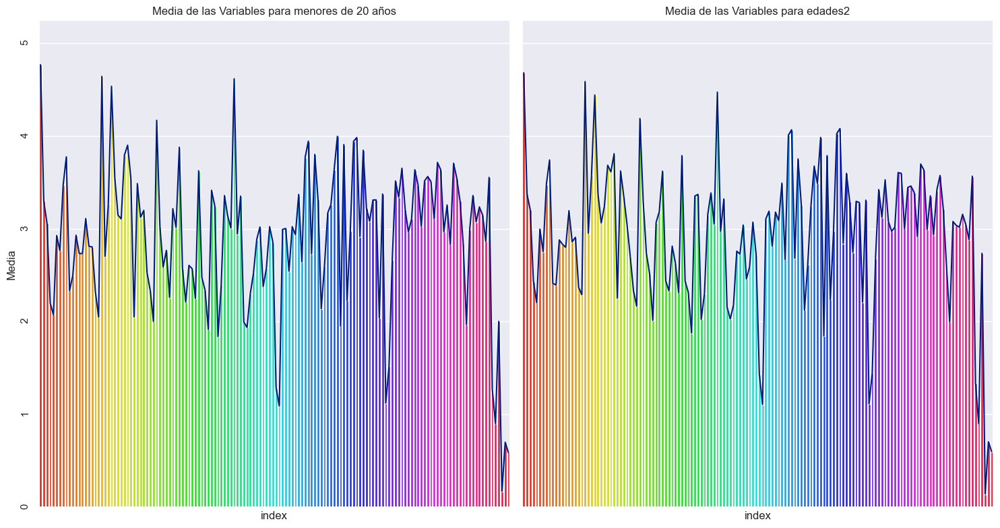

In [82]:
# Crear la figura y los ejes
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 8), sharey=True)

# Crear gráfico de barras para edades1
sns.lineplot(data=df_edades1, x='index', y='media', ax=axes[0])
axes[0].set_title('Media de las Variables para edades1')
#axes[0].set_xlabel('Variable')
axes[0].set_ylabel('Media')
axes[0].tick_params(rotation=90)  # Rotar las etiquetas del eje x para mejor legibilidad
axes[0].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)


sns.barplot(data=df_edades1, x='index', y='media', ax=axes[0], palette = 'hsv')
axes[0].set_title('Media de las Variables para menores de 20 años')
#axes[2].set_xlabel('Variable')
axes[0].set_ylabel('Media')
axes[0].tick_params(rotation=90)  # Rotar las etiquetas del eje x para mejor legibilidad
axes[0].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

# Crear gráfico de barras para edades2
sns.lineplot(data=df_edades2, x='index', y='media', ax=axes[1])
axes[1].set_title('Media de las Variables para mayores de 20 años')
#axes[1].set_xlabel('Variable')
axes[1].tick_params(rotation=90)  # Rotar las etiquetas del eje x para mejor legibilidad
axes[1].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

sns.barplot(data=df_edades2, x='index', y='media', ax=axes[1], palette = 'hsv')
axes[1].set_title('Media de las Variables para edades2')
#axes[3].set_xlabel('Variable')
axes[1].set_ylabel('Media')
axes[1].tick_params(rotation=90)  # Rotar las etiquetas del eje x para mejor legibilidad
axes[1].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

# Ajustar el layout para que no se solapen los gráficos
plt.tight_layout()


# Encontrar el valor máximo para establecer un límite común en el eje y
max_media = max(df_edades1['media'].max(), df_edades2['media'].max())
axes[0].set_ylim(0, max_media * 1.1)  # Añadir un poco de margen en el límite superior
axes[1].set_ylim(0, max_media * 1.1)
plt.show()

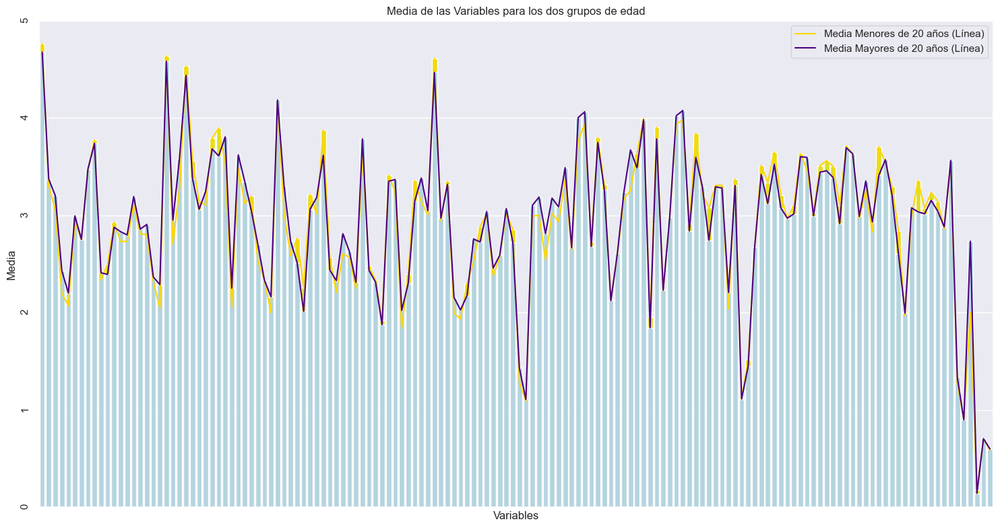

In [83]:
# Crear la figura y los ejes
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15, 8), sharey=True)


sns.set_palette("pastel")
# Crear gráfico de barras para edades1
sns.lineplot(data=df_edades1, x='index', y='media', color='Gold', alpha=1, label='Media Menores de 20 años (Línea)')
axes.set_title('Media de las Variables para los dos grupos de edad')
axes.set_ylabel('Media')
axes.tick_params(rotation=90)  # Rotar las etiquetas del eje x para mejor legibilidad
axes.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

sns.set_palette("pastel")
sns.barplot(data=df_edades1, x='index', y='media', color='Yellow', alpha=1)
axes.set_title('Media de las Variables para los dos grupos de edad')
axes.set_ylabel('Media')
axes.tick_params(rotation=90)  # Rotar las etiquetas del eje x para mejor legibilidad
axes.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

sns.set_palette("dark")
# Crear gráfico de barras para edades2
sns.lineplot(data=df_edades2, x='index', y='media', color='Indigo', alpha=1, label='Media Mayores de 20 años (Línea)')
axes.set_title('Media de las Variables para los dos grupos de edad')
axes.tick_params(rotation=90)  # Rotar las etiquetas del eje x para mejor legibilidad
axes.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

sns.barplot(data=df_edades2, x='index', y='media', color='LightBlue', alpha=1)
axes.set_title('Media de las Variables para los dos grupos de edad')
axes.set_xlabel('Variables')
axes.set_ylabel('Media')
axes.tick_params(rotation=90)  # Rotar las etiquetas del eje x para mejor legibilidad
axes.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)

# Añado la leyenda
axes.legend(loc='upper right')


# Ajustar el layout para que no se solapen los gráficos
plt.tight_layout()



## Correlaciones entre grupos de variables

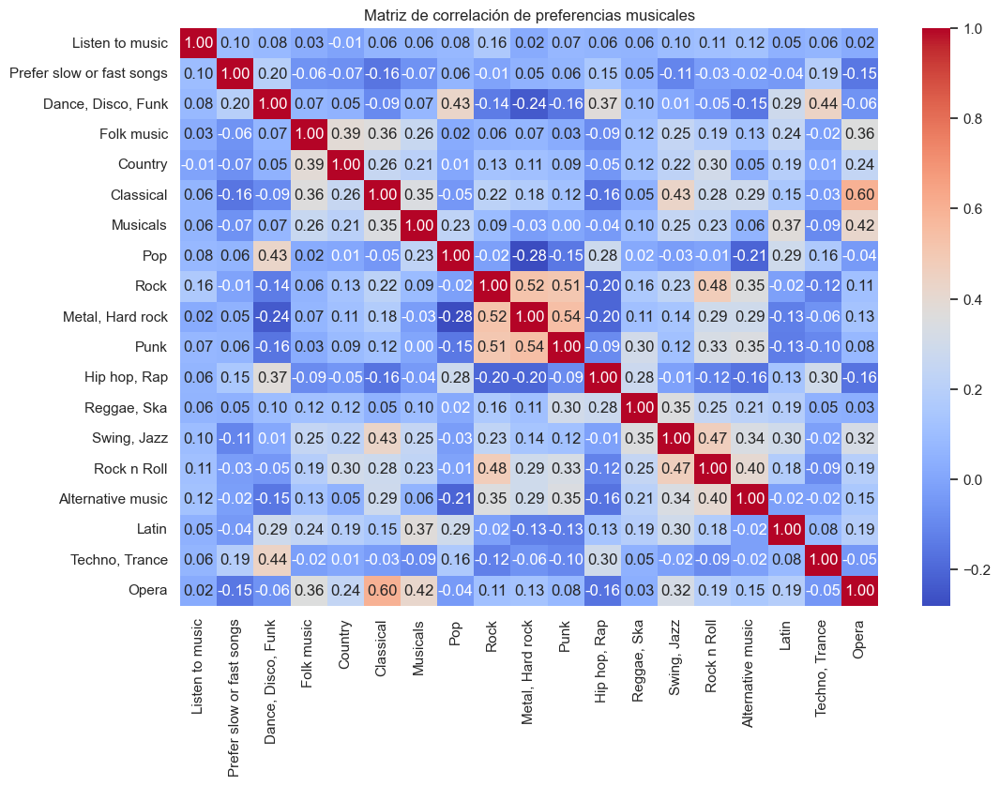

In [84]:
matriz_correlacion = df[preferenciasMusicales].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(matriz_correlacion, annot=True, cmap="coolwarm", fmt=".2f")
plt.title('Matriz de correlación de preferencias musicales')
plt.show()

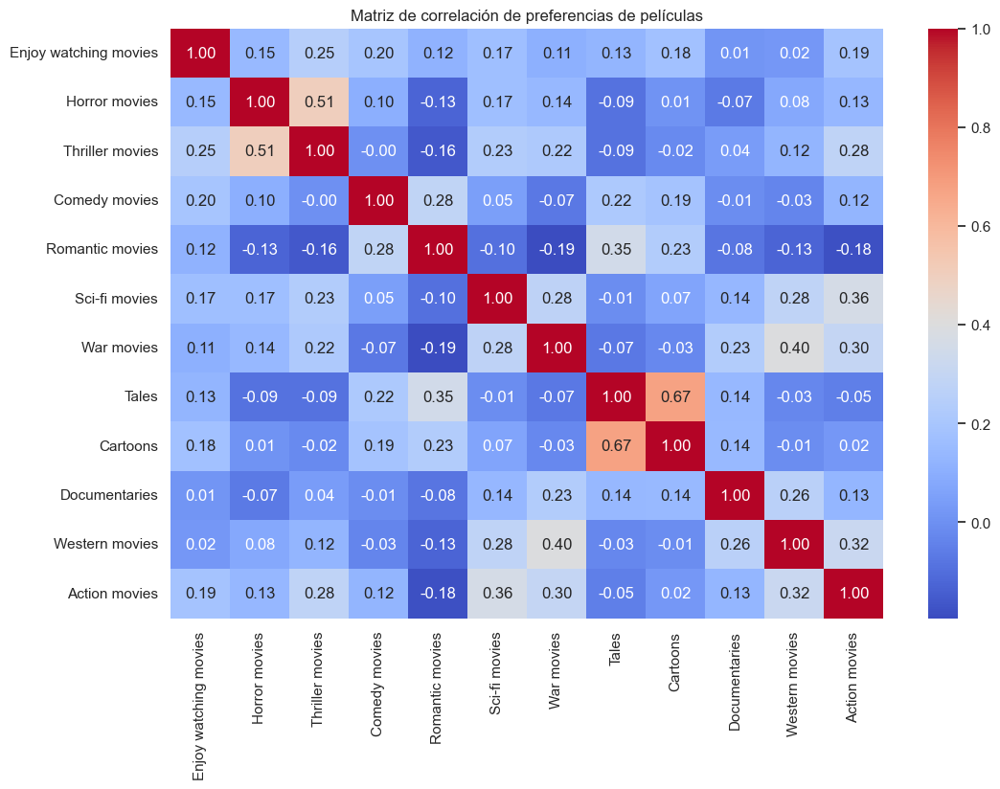

In [85]:
matrizCorrelacion = df[preferenciasPeliculas].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(matrizCorrelacion, annot=True, cmap="coolwarm", fmt=".2f")
plt.title('Matriz de correlación de preferencias de películas')
plt.show()

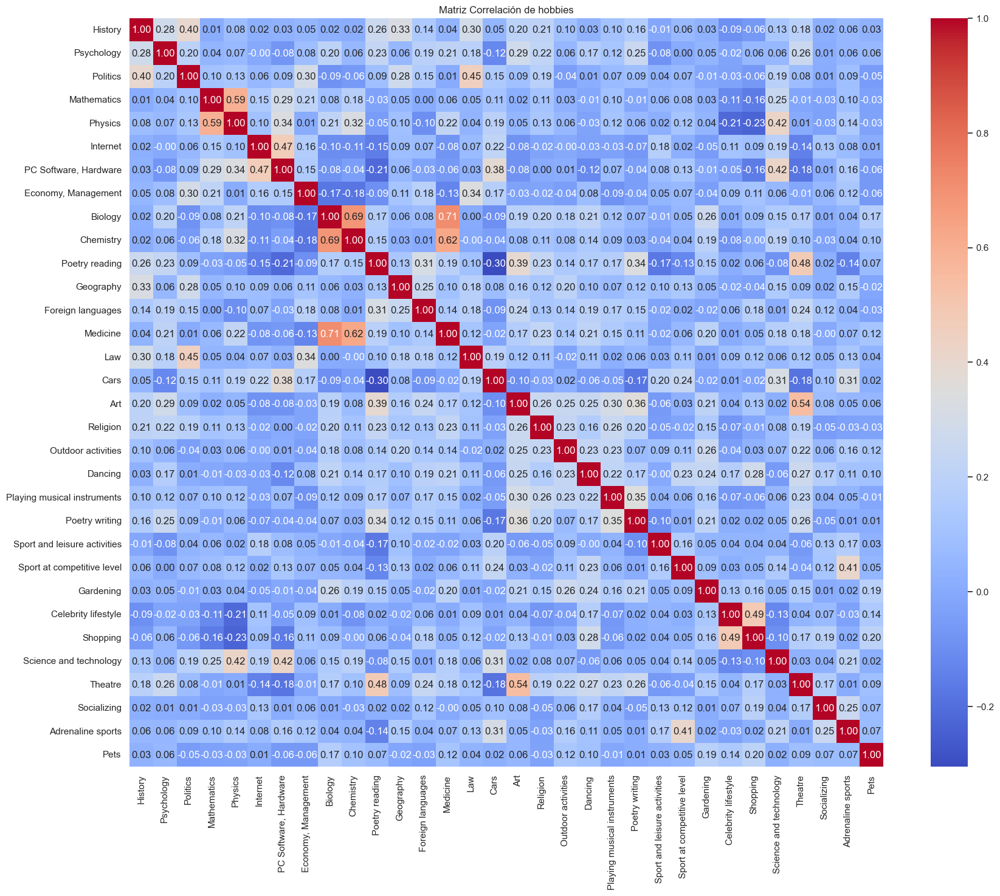

In [86]:
matrizCorrelacion = df[hobbies].corr()
plt.figure(figsize=(20, 16))
sns.heatmap(matrizCorrelacion, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Matriz Correlación de hobbies")
plt.show()

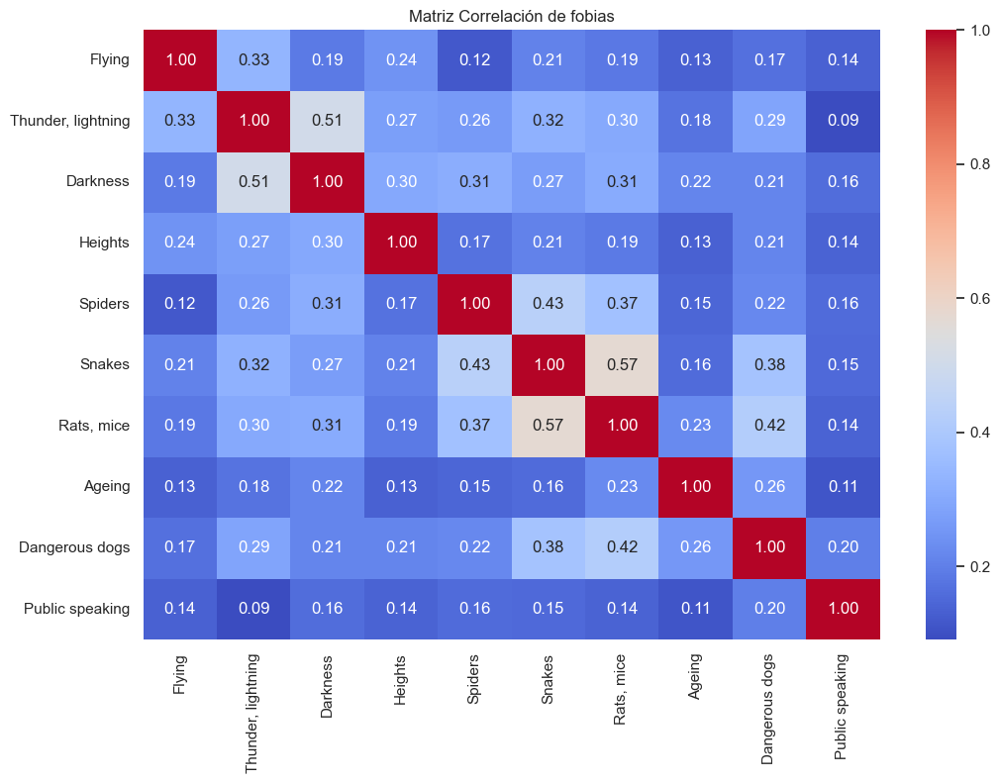

In [87]:
matrizCorrelacion = df[fobias].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(matrizCorrelacion, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Matriz Correlación de fobias")
plt.show()

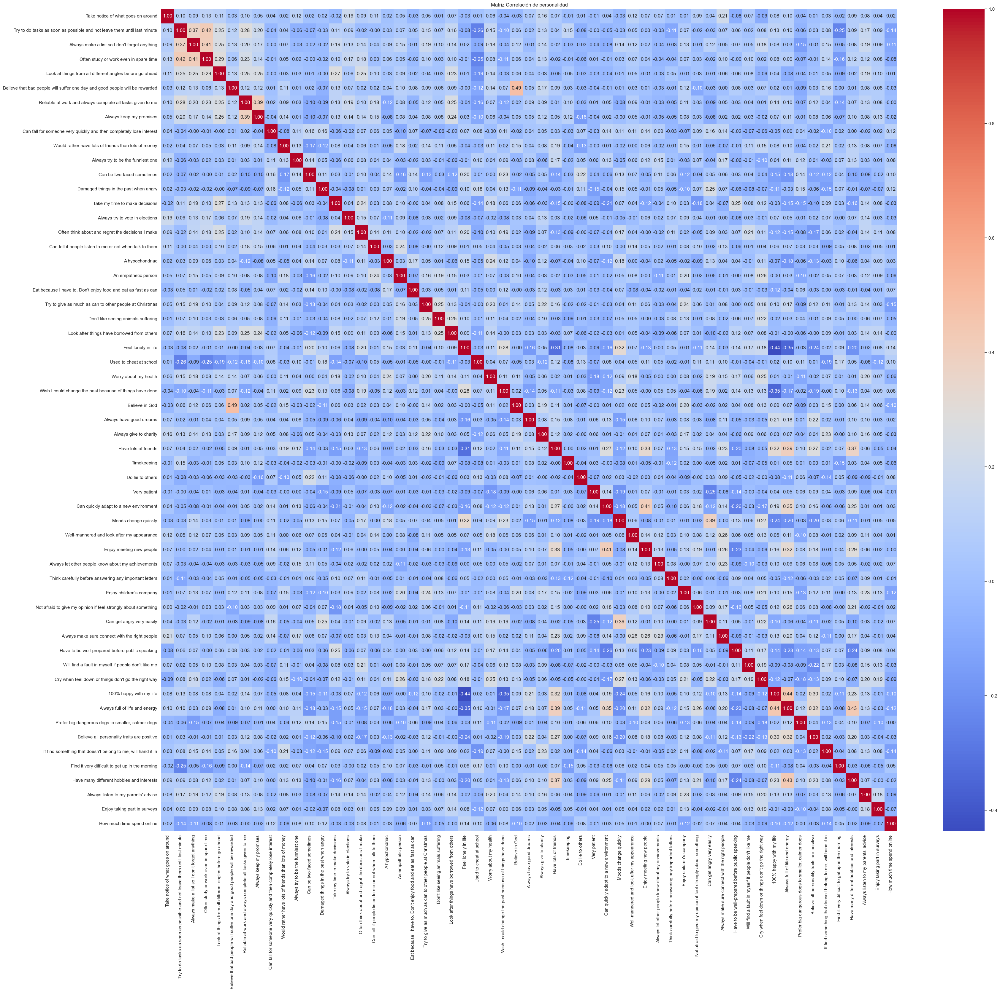

In [88]:
matrizCorrelacion = df[personalidad].corr()
plt.figure(figsize=(40, 36))
sns.heatmap(matrizCorrelacion, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Matriz Correlación de personalidad")
plt.show()

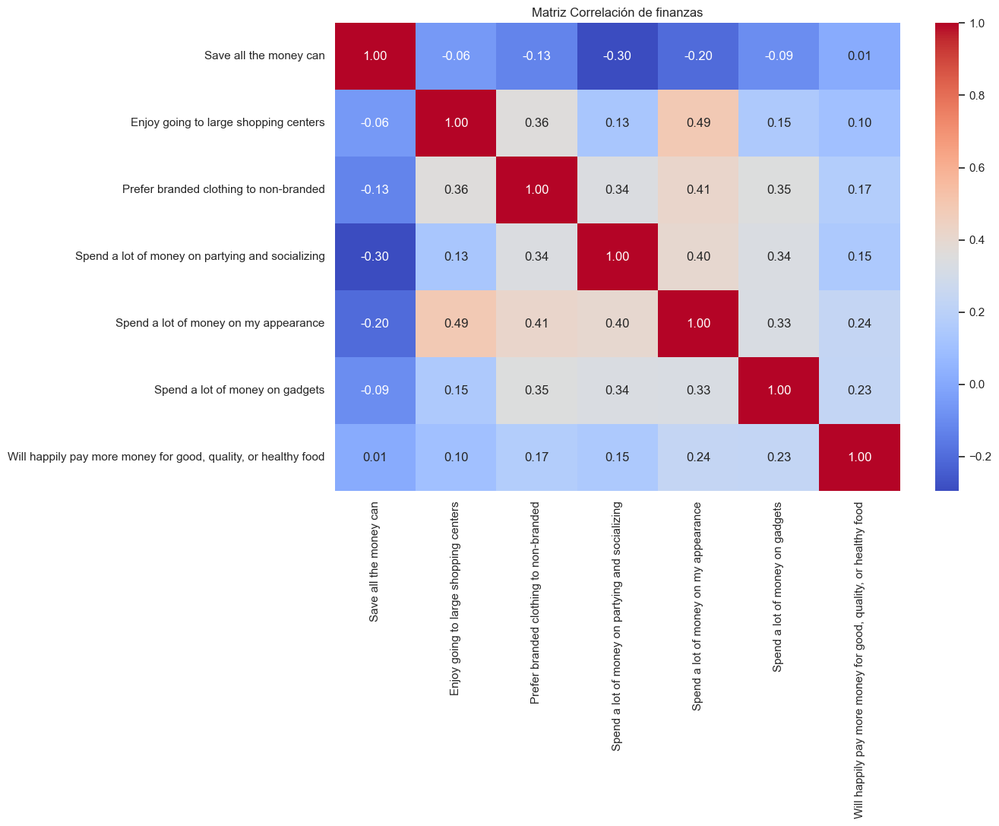

In [89]:
matrizCorrelacion = df[finanzas].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(matrizCorrelacion, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Matriz Correlación de finanzas")
plt.show()

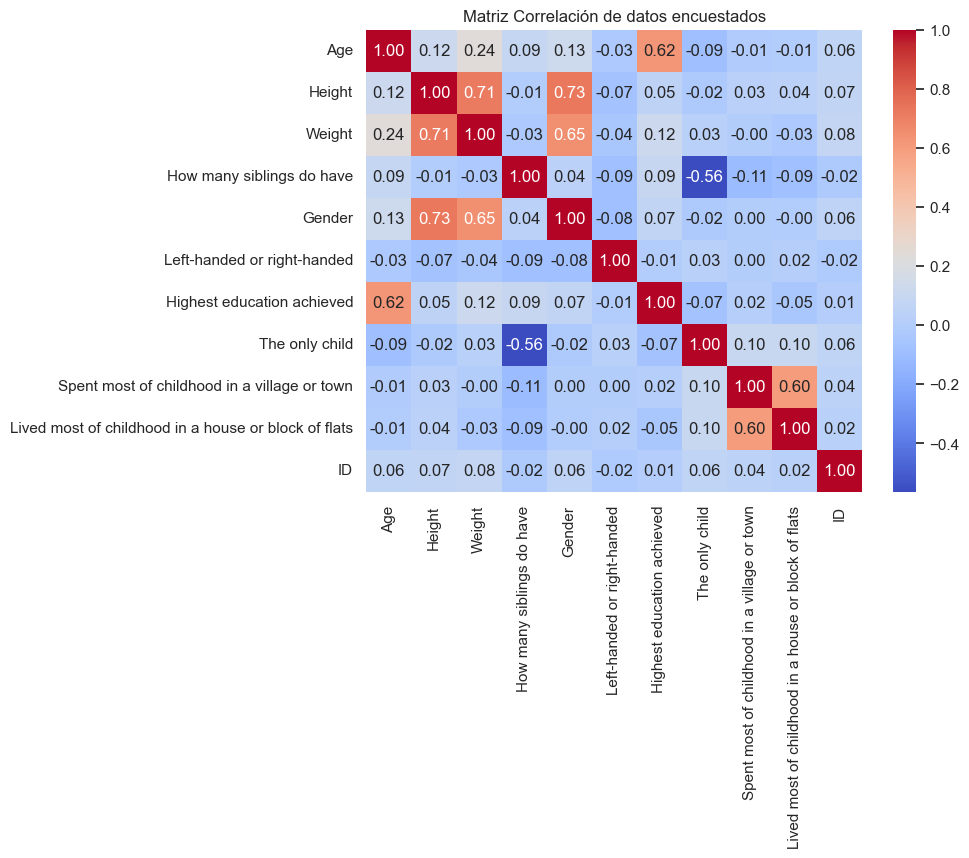

In [90]:
matrizCorrelacion = df[datosEncuestados].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(matrizCorrelacion, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Matriz Correlación de datos encuestados")
plt.show()

Aqui hay que tener en cuenta que cuando calculamos las correlaciones, hay algunas que no tienen sentido, ya que hemos recodificado algunas variables categoricas a valores numéricos, de tal manera que no tiene sentido asociarle valores numéricos. Así pues hay correlaciones que no corresponden como tal

## Análisis Gráfico de Correlaciones de Variables y Detección de Comunidades Mediante el Algoritmo Girvan-Newman

In [91]:
def grafo_correlaciones(Grupo_variable, cadena):
    Grupo_Variable_numericas = Grupo_variable.select_dtypes(include='number')

    corMat_df = Grupo_Variable_numericas.corr(method='pearson')
    G = nx.Graph()
    node_to_label = {i: name for i, name in enumerate(corMat_df.columns)}

    for i, name in enumerate(corMat_df.columns):
        if len(corMat_df.columns) > 15:
            G.add_node(i, label=str(i))
        else:
            G.add_node(i, label=name)

    for i in range(len(corMat_df.columns)):
        for j in range(i + 1, len(corMat_df.columns)):
            correlation = corMat_df.iloc[i, j]
            if abs(correlation) > 0.25:
                G.add_edge(i, j, weight=abs(correlation))

    weights = [d['weight'] for _, _, d in G.edges(data=True)]
    if weights:
        max_weight = max(weights)
        norm_weights = [(1.5 * (weight / max_weight))**2 for weight in weights]
    else:
        norm_weights = []

    pos = nx.circular_layout(G)
    plt.figure(figsize=(10, 8))
    plt.title(f'Grafo de Correlaciones de {cadena}', fontsize=16)

    if len(corMat_df.columns) > 15:
        nx.draw(G, pos, with_labels=True, labels={node: G.nodes[node]['label'] for node in G.nodes()},
                node_size=150, node_color='#41f1ea', font_size=10, width=norm_weights, node_shape='o')
        legend = {node: f"{node}: {node_to_label[node]}" for node in G.nodes()}
        plt.text(1.2, 1.1, "\nLeyenda:", fontsize=12, ha='left', fontweight='bold')
        for node, label in legend.items():
            plt.text(1.2, 1 - node * 0.07, label, fontsize=10, ha='left')
    else:
        nx.draw(G, pos, with_labels=True, labels={node: G.nodes[node]['label'] for node in G.nodes()},
                node_size=200, node_color='#41f1ea', font_size=10, width=norm_weights, node_shape='o')

    plt.show()

def grafo_girvan_newman(Grupo_variable, cadena):
    Grupo_Variable_numericas = Grupo_variable.select_dtypes(include='number')

    from networkx.algorithms import community

    corMat_df = Grupo_Variable_numericas.corr(method='pearson')
    G = nx.Graph()
    node_to_label = {i: name for i, name in enumerate(corMat_df.columns)}

    for i, name in enumerate(corMat_df.columns):
        G.add_node(i, label=name)

    for i in range(len(corMat_df.columns)):
        for j in range(i + 1, len(corMat_df.columns)):
            correlation = corMat_df.iloc[i, j]
            if abs(correlation) > 0.35:
                G.add_edge(i, j, weight=abs(correlation))
    
    communities_generator = community.girvan_newman(G)
    communities = tuple(sorted(c) for c in next(communities_generator))

    community_to_variables = {}
    for i, community in enumerate(communities):
        if len(community) > 1:
            community_to_variables[f'Comunidad {i+1}'] = [node_to_label[node] for node in community]

    if len(community_to_variables) > 0:


        print(f"Comunidades de {cadena}:\n", community_to_variables)
        
        # Visualización del grafo con comunidades
        node_to_community = {}
        for i, community in enumerate(communities):
            for node in community:
                node_to_community[node] = i

        weights = [d['weight'] for u, v, d in G.edges(data=True)]
        if weights:
            max_weight = max(weights)
            norm_weights = [(1.5 * (weight / max_weight))**2 for weight in weights]
        else:
            norm_weights = []

        edge_colors = []
        for u, v, d in G.edges(data=True):
            if node_to_community[u] == node_to_community[v]:
                edge_colors.append(plt.cm.tab10(node_to_community[u]))
            else:
                edge_colors.append('red')

        plt.figure(figsize=(8, 6))
        plt.title(f"Comunidades de {cadena}", fontsize=16)
        pos = nx.circular_layout(G)
        nx.draw(G, pos, with_labels=True, node_size=200, node_color='#ff99f7', font_size=10,
                width=norm_weights, node_shape='o', edge_color=edge_colors)

        plt.text(1.2, 1.1, "\n Leyenda:\n", fontsize=12, ha='left', fontweight='bold')
        contador = 0
        for i, community in enumerate(communities):
            if len(community) > 1:
                contador += 1
                plt.text(1.2, 1 - contador * 0.1, f"Comunidad {contador}", fontsize=10, ha='left', color=plt.cm.tab10(i))

        legend = {node: f"{node}: {node_to_label[node]}" for node in G.nodes()}
        for node, label in legend.items():
            plt.text(1.75, 1 - node * 0.07, label, fontsize=10, ha='left')

        plt.show()

    else:

        print(f'No hay comunidades notables para el grupo de variables {cadena}')

    return community_to_variables


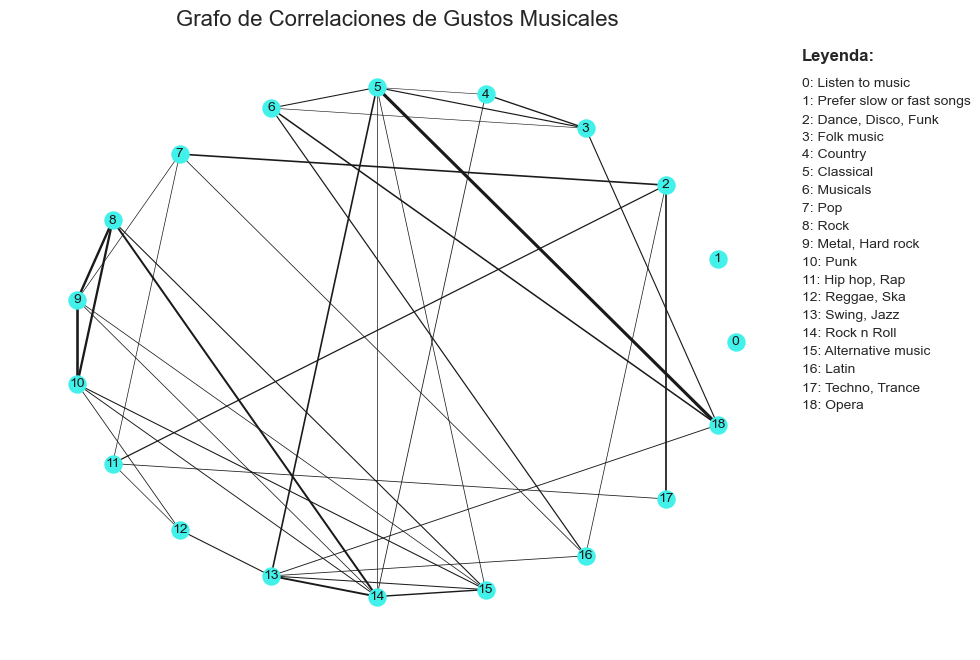

Comunidades de Gustos Musicales:
 {'Comunidad 3': ['Dance, Disco, Funk', 'Pop', 'Hip hop, Rap', 'Techno, Trance'], 'Comunidad 4': ['Folk music', 'Country', 'Classical', 'Musicals', 'Latin', 'Opera'], 'Comunidad 5': ['Rock', 'Metal, Hard rock', 'Punk', 'Reggae, Ska', 'Swing, Jazz', 'Rock n Roll', 'Alternative music']}


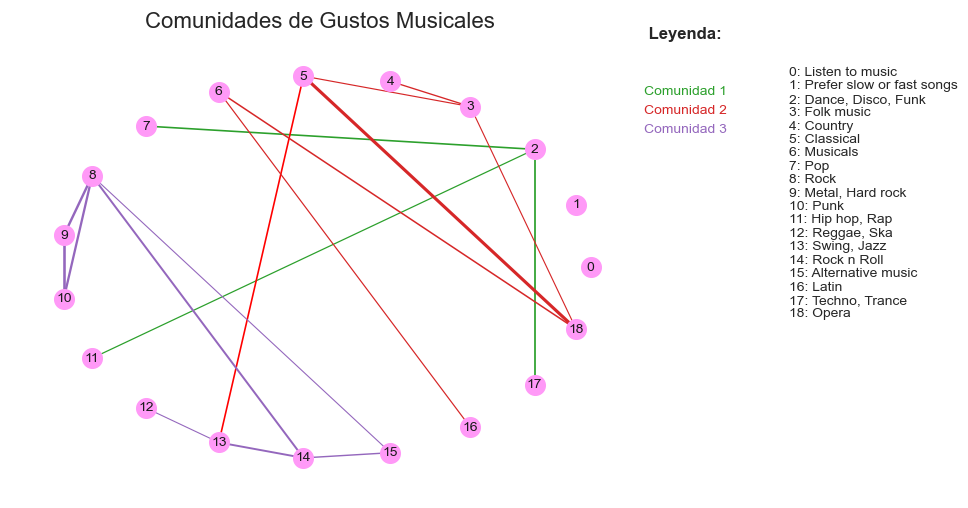

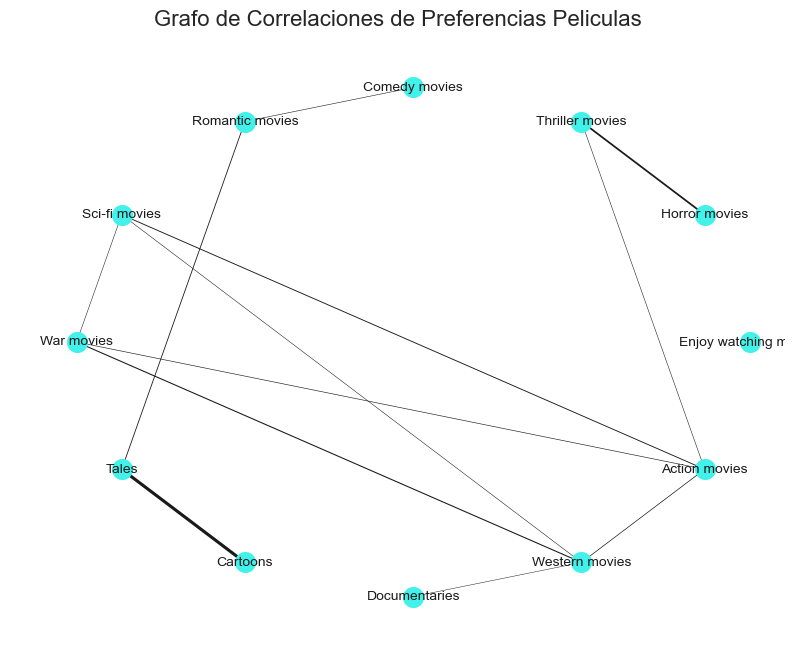

Comunidades de Preferencias Peliculas:
 {'Comunidad 6': ['Sci-fi movies', 'Action movies'], 'Comunidad 7': ['War movies', 'Western movies'], 'Comunidad 8': ['Tales', 'Cartoons']}


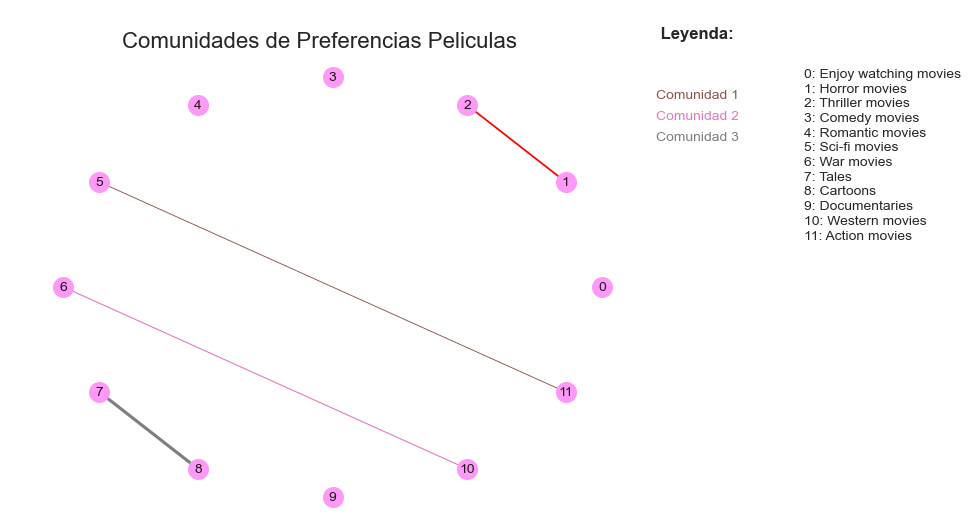

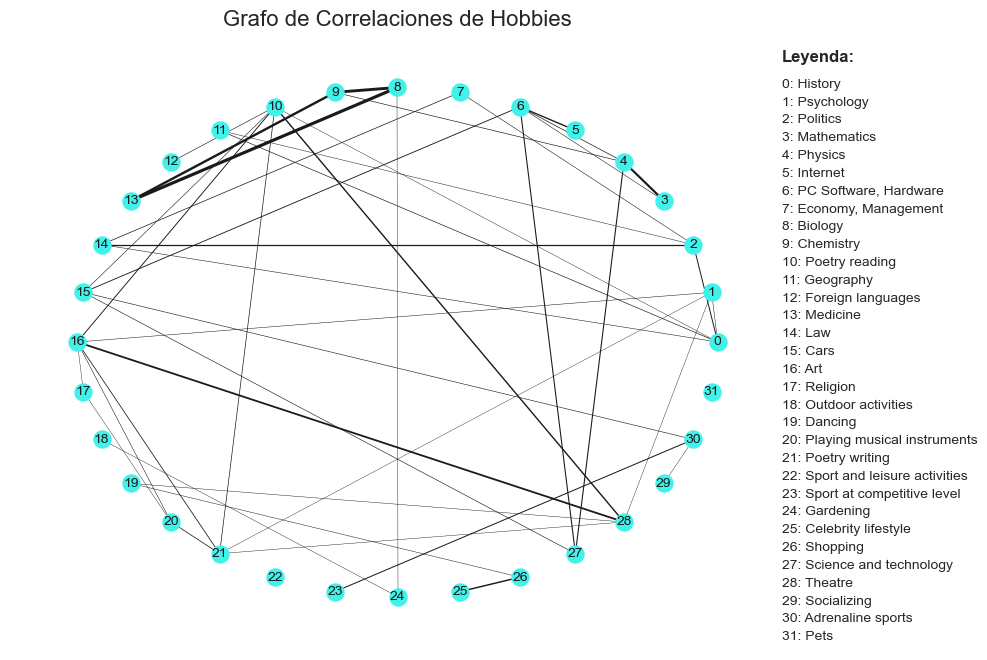

Comunidades de Hobbies:
 {'Comunidad 1': ['History', 'Politics', 'Law'], 'Comunidad 3': ['Mathematics', 'Physics', 'Science and technology'], 'Comunidad 4': ['Internet', 'PC Software, Hardware', 'Cars'], 'Comunidad 6': ['Biology', 'Chemistry', 'Medicine'], 'Comunidad 7': ['Poetry reading', 'Art', 'Poetry writing', 'Theatre'], 'Comunidad 15': ['Sport at competitive level', 'Adrenaline sports'], 'Comunidad 17': ['Celebrity lifestyle', 'Shopping']}


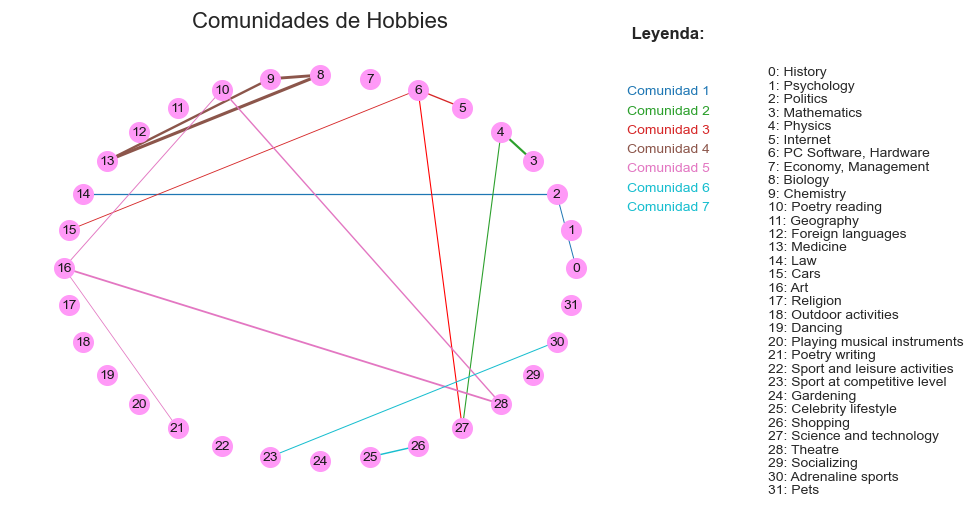

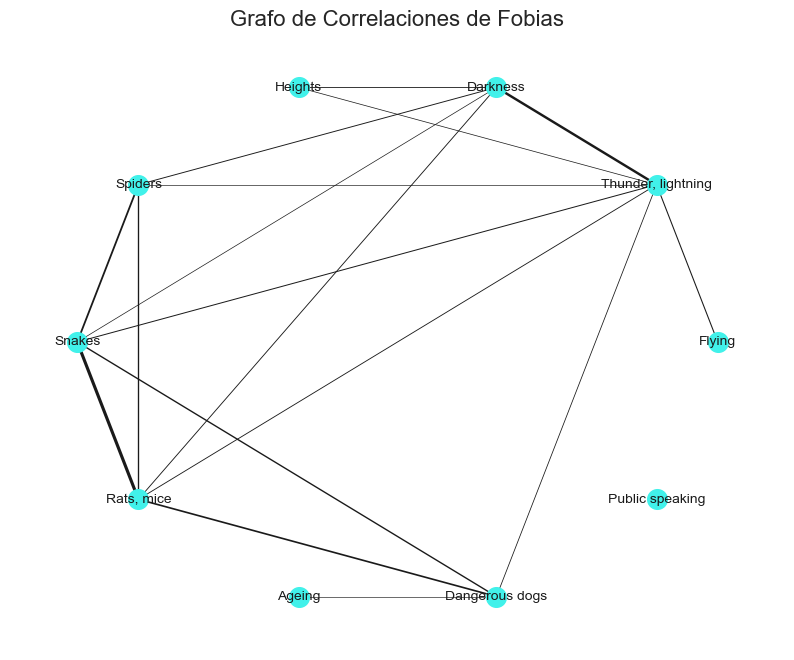

Comunidades de Fobias:
 {'Comunidad 2': ['Thunder, lightning', 'Darkness'], 'Comunidad 5': ['Snakes', 'Rats, mice', 'Dangerous dogs']}


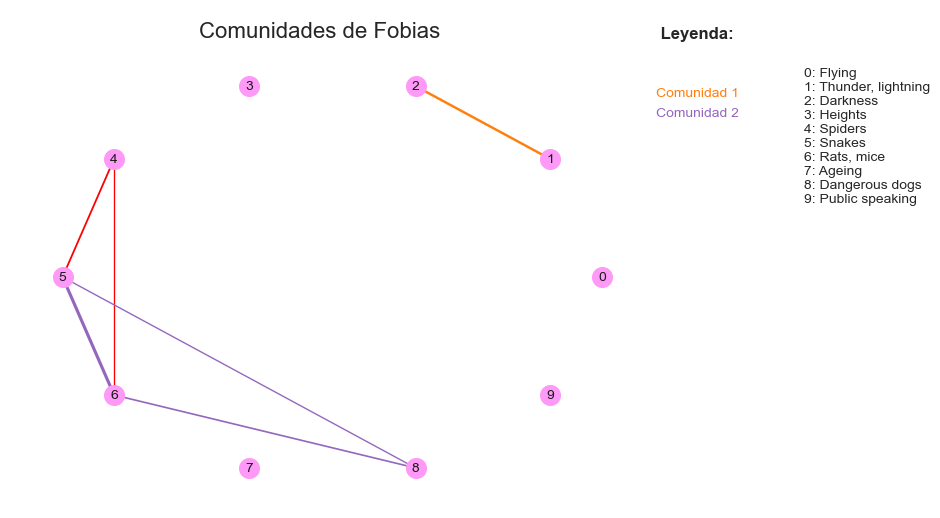

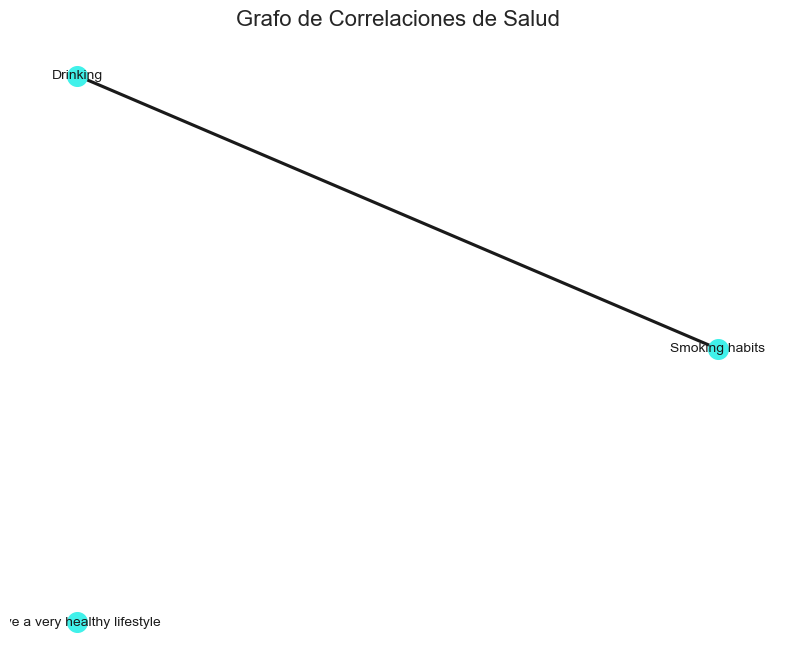

No hay comunidades notables para el grupo de variables Salud


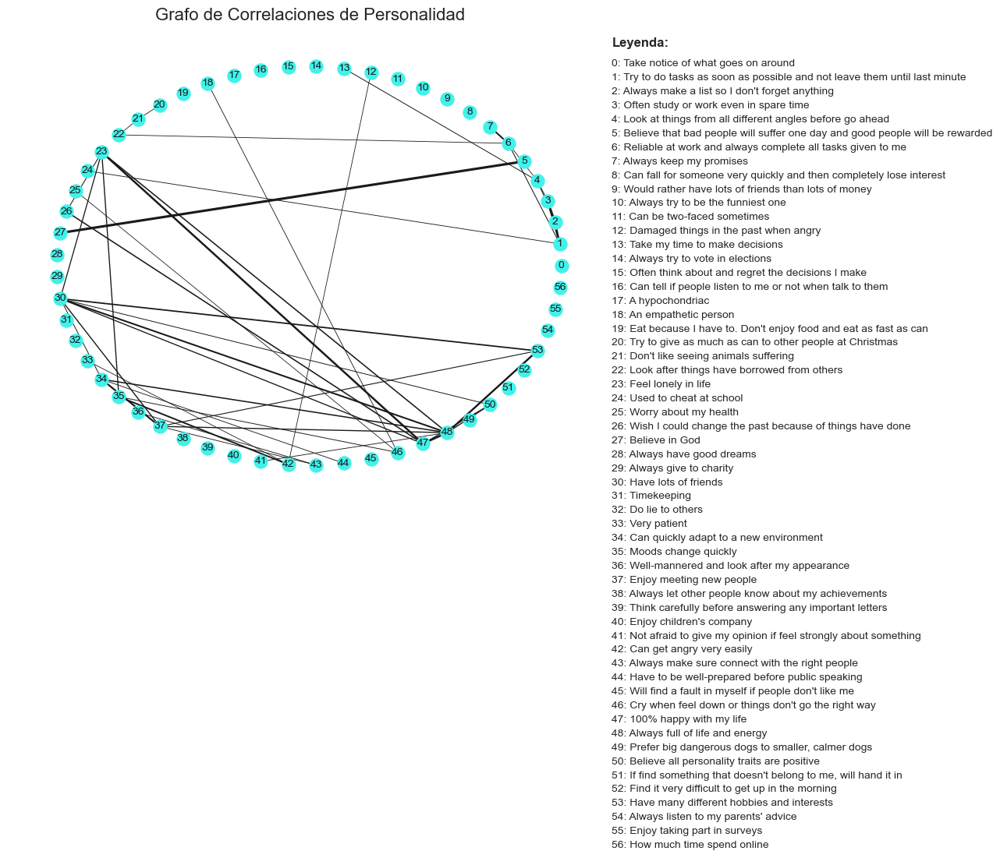

Comunidades de Personalidad:
 {'Comunidad 2': ['Try to do tasks as soon as possible and not leave them until last minute', "Always make a list so I don't forget anything", 'Often study or work even in spare time'], 'Comunidad 4': ['Believe that bad people will suffer one day and good people will be rewarded', 'Believe in God'], 'Comunidad 5': ['Reliable at work and always complete all tasks given to me', 'Always keep my promises'], 'Comunidad 21': ['Feel lonely in life', '100% happy with my life'], 'Comunidad 27': ['Have lots of friends', 'Always full of life and energy', 'Have many different hobbies and interests'], 'Comunidad 31': ['Can quickly adapt to a new environment', 'Enjoy meeting new people'], 'Comunidad 32': ['Moods change quickly', 'Can get angry very easily']}


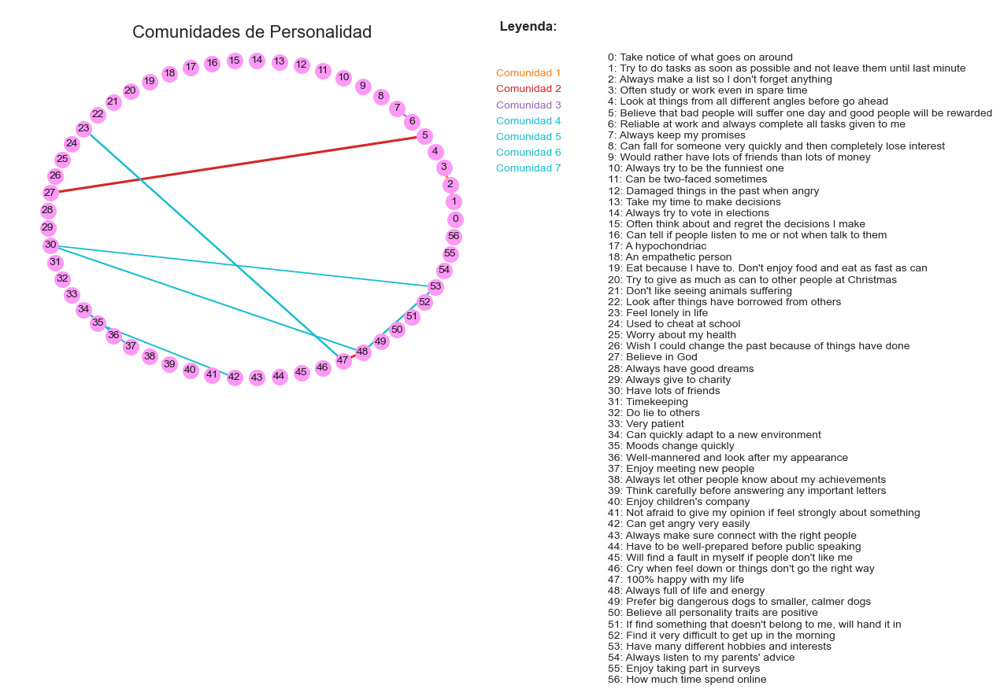

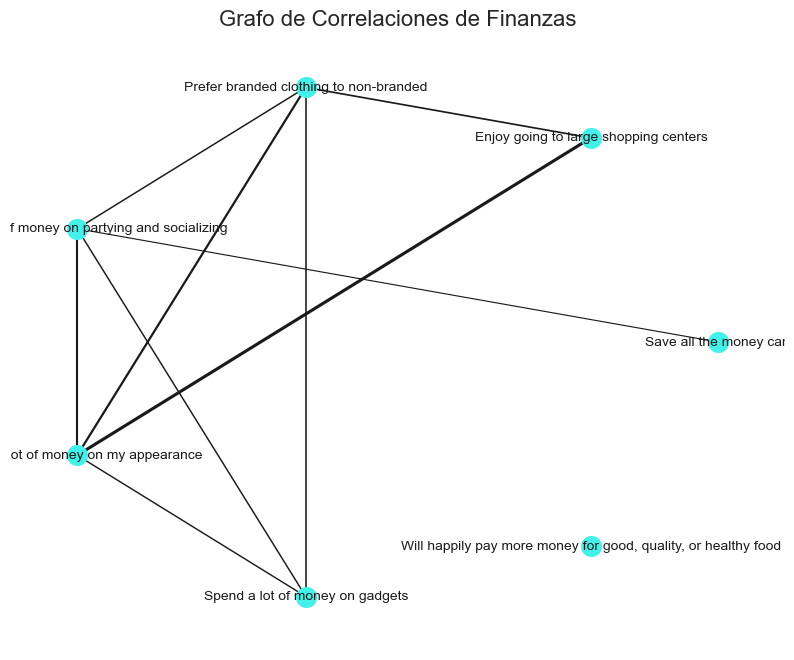

Comunidades de Finanzas:
 {'Comunidad 2': ['Enjoy going to large shopping centers', 'Prefer branded clothing to non-branded', 'Spend a lot of money on my appearance']}


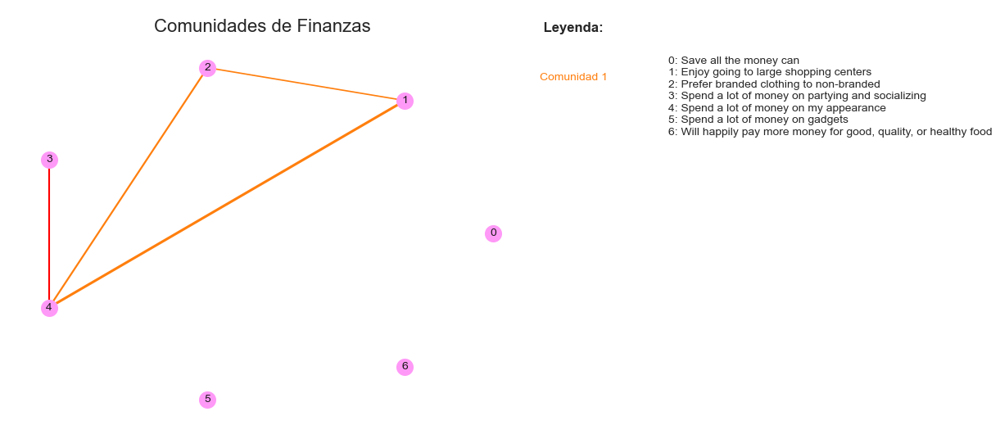

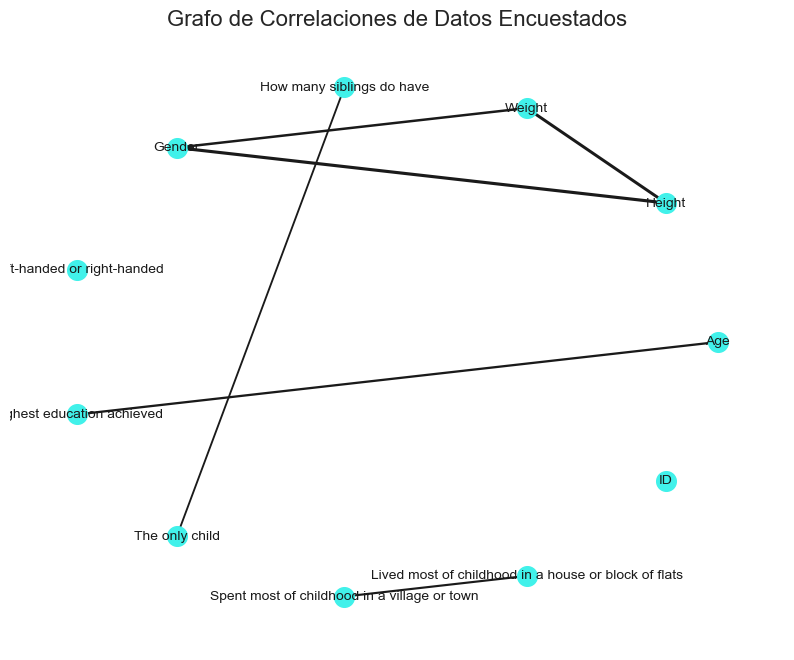

Comunidades de Datos Encuestados:
 {'Comunidad 2': ['Height', 'Weight', 'Gender'], 'Comunidad 3': ['How many siblings do have', 'The only child'], 'Comunidad 6': ['Spent most of childhood in a village or town', 'Lived most of childhood in a house or block of flats']}


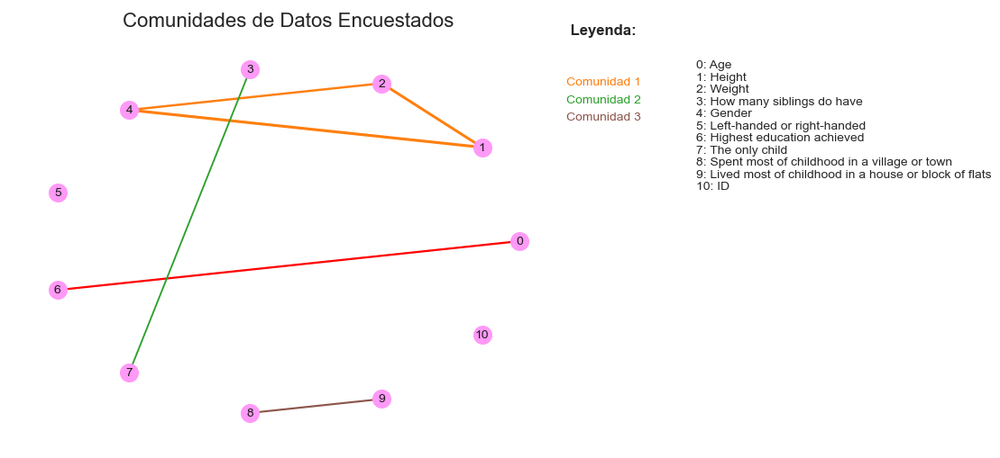

In [92]:
# Main
listaNombres = ['Gustos Musicales', 'Preferencias Peliculas', 'Hobbies', 'Fobias', 'Salud', 'Personalidad', 'Finanzas', 'Datos Encuestados']

preferenciasMusicales = df.iloc[:, :19].copy()
preferenciasPeliculas = df.iloc[:, 19:31].copy()
hobbies_ = df.iloc[:, 31:63].copy()
fobias_ = df.iloc[:, 63:73].copy()
salud_ = df.iloc[:, 73:76].copy()
personalidad_ = df.iloc[:, 76:133].copy()
finanzas_ = df.iloc[:, 133:140].copy()
datosEncuestados_ = df.iloc[:, 140:].copy()

gruposDf = [preferenciasMusicales, preferenciasPeliculas, hobbies_, fobias_, salud_, personalidad_, finanzas_, datosEncuestados_]

for i, grupo in enumerate(gruposDf):
    grafo_correlaciones(grupo, listaNombres[i])
    grafo_girvan_newman(grupo, listaNombres[i])


## PCA

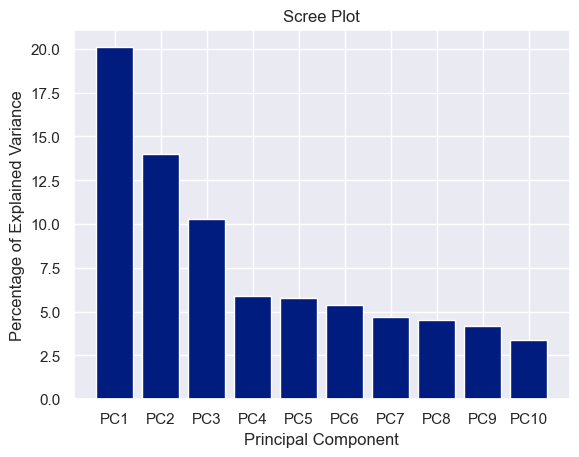

,Listen to music,Prefer slow or fast songs,"Dance, Disco, Funk",Folk music,Country,Classical,Musicals,Pop,Rock,"Metal, Hard rock",Punk,"Hip hop, Rap","Reggae, Ska","Swing, Jazz",Rock n Roll,Alternative music,Latin,"Techno, Trance",Opera
0,0.07,-0.08,-0.11,0.23,0.22,0.33,0.21,-0.08,0.31,0.27,0.26,-0.15,0.17,0.32,0.35,0.29,0.11,-0.10,0.29
1,0.07,0.03,0.41,0.21,0.16,0.12,0.28,0.37,-0.16,-0.27,-0.23,0.28,0.13,0.17,0.03,-0.12,0.40,0.24,0.15
2,-0.20,-0.34,-0.25,0.18,0.09,0.23,0.19,-0.11,-0.25,-0.21,-0.33,-0.32,-0.34,-0.03,-0.16,-0.16,0.03,-0.28,0.29
3,0.21,0.40,0.20,0.20,0.12,0.21,-0.01,0.01,0.08,0.22,0.03,-0.19,-0.47,-0.28,-0.14,-0.04,-0.20,0.39,0.23
4,-0.39,0.01,0.02,0.24,0.23,0.10,-0.33,-0.46,-0.33,0.04,-0.03,0.19,0.27,0.14,-0.13,0.11,-0.13,0.34,0.08
5,-0.49,0.06,0.05,0.20,0.48,-0.25,0.06,0.17,0.14,0.21,0.21,-0.04,0.03,-0.27,0.07,-0.37,0.09,-0.19,-0.15
6,-0.52,-0.08,0.05,-0.30,-0.44,0.23,0.24,0.18,0.07,0.19,0.23,0.16,0.04,-0.07,-0.19,-0.05,-0.04,0.15,0.33
7,0.24,0.48,-0.23,0.19,-0.10,0.01,0.27,-0.15,-0.20,0.01,0.15,0.21,0.33,-0.12,-0.28,-0.18,-0.06,-0.37,0.19
8,-0.39,0.63,0.00,-0.09,-0.18,-0.08,0.13,-0.10,-0.09,-0.09,-0.20,-0.30,-0.11,0.19,0.23,0.23,0.24,-0.05,-0.11
9,-0.08,-0.14,0.15,0.59,-0.34,-0.10,-0.06,0.19,-0.01,-0.10,0.17,-0.20,0.10,-0.25,-0.22,0.46,0.08,-0.07,-0.13


In [93]:
import pandas as pd
import numpy as np
import random as rd
from sklearn.decomposition import PCA
from sklearn import preprocessing
import matplotlib.pyplot as plt # NOTE: This was tested with matplotlib v. 2.1.0


data = preferenciasMusicales


scaled_data = preprocessing.scale(data)

pca = PCA(n_components= 10) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data

#The following code constructs the Scree plot
per_var = np.round(pca.explained_variance_ratio_* 100, decimals=1)
labels = ['PC' + str(x) for x in range(1, len(per_var)+1)]

plt.bar(x=range(1,len(per_var)+1), height=per_var, tick_label=labels)
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Component')
plt.title('Scree Plot')
plt.show()


components = pca.components_
weights = pca.explained_variance_ratio_

# Crear un DataFrame para almacenar los pesos de las variables en cada componente principal
variable_names = list(data.columns)
weights_df = pd.DataFrame(components, columns=variable_names)

# Añadir una fila para los pesos de cada componente
#weights_df = weights_df.append(pd.Series(weights, name='Weights'))

# Transponer el DataFrame para que las filas representen componentes y las columnas representen variables

weights_df

                              0     1     2     3     4     5     6     7  \
Listen to music            0.07  0.07 -0.20  0.21 -0.39 -0.49 -0.52  0.24   
Prefer slow or fast songs -0.08  0.03 -0.34  0.40  0.01  0.06 -0.08  0.48   
Dance, Disco, Funk        -0.11  0.41 -0.25  0.20  0.02  0.05  0.05 -0.23   
Folk music                 0.23  0.21  0.18  0.20  0.24  0.20 -0.30  0.19   
Country                    0.22  0.16  0.09  0.12  0.23  0.48 -0.44 -0.10   
Classical                  0.33  0.12  0.23  0.21  0.10 -0.25  0.23  0.01   
Musicals                   0.21  0.28  0.19 -0.01 -0.33  0.06  0.24  0.27   
Pop                       -0.08  0.37 -0.11  0.01 -0.46  0.17  0.18 -0.15   
Rock                       0.31 -0.16 -0.25  0.08 -0.33  0.14  0.07 -0.20   
Metal, Hard rock           0.27 -0.27 -0.21  0.22  0.04  0.21  0.19  0.01   
Punk                       0.26 -0.23 -0.33  0.03 -0.03  0.21  0.23  0.15   
Hip hop, Rap              -0.15  0.28 -0.32 -0.19  0.19 -0.04  0.16  0.21   

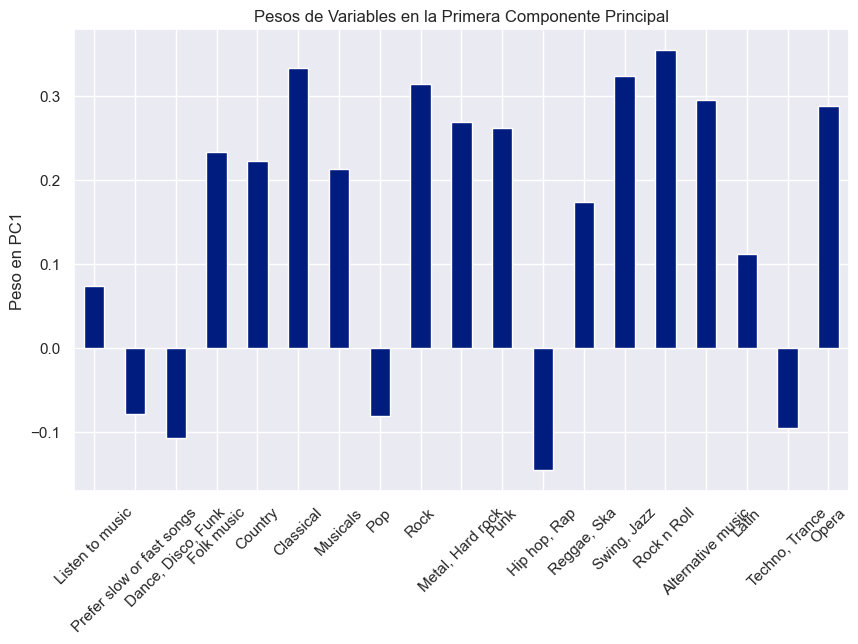

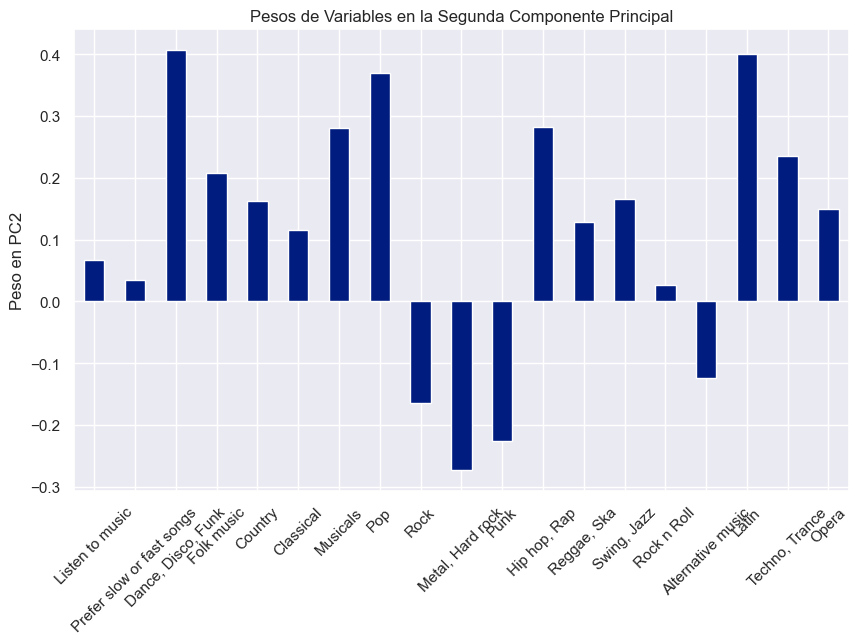

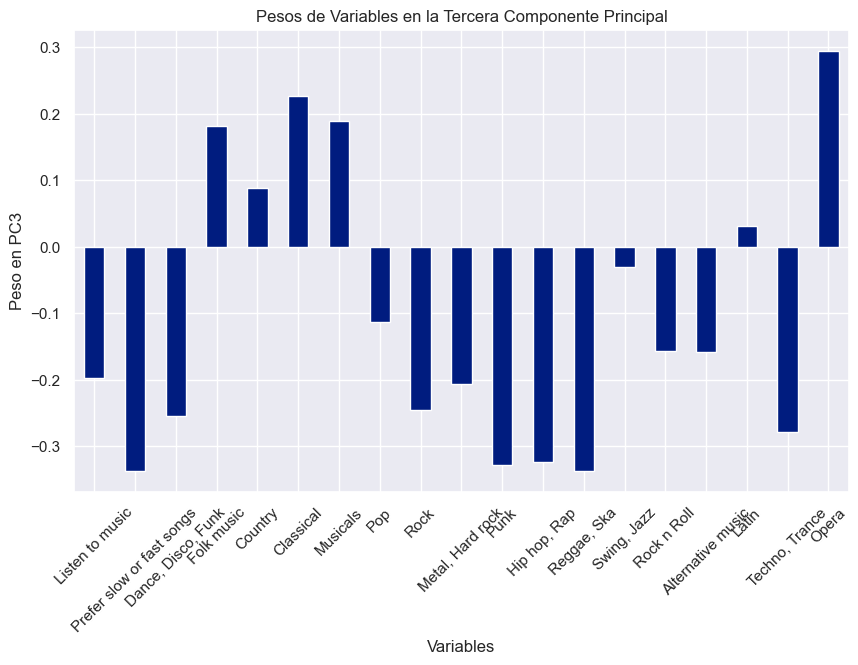

In [94]:
weights_traspuesta_musical_df = weights_df.T
print(weights_traspuesta_musical_df)

weights_pc1 = weights_traspuesta_musical_df[0]
weights_pc2 = weights_traspuesta_musical_df[1]
weights_pc3 = weights_traspuesta_musical_df[2]
weights_pc4 = weights_traspuesta_musical_df[3]


# Crear un gráfico de barras para visualizar los pesos de la primera componente principal
plt.figure(figsize=(10, 6))
weights_pc1.plot(kind='bar')
plt.title('Pesos de Variables en la Primera Componente Principal')
plt.ylabel('Peso en PC1')
plt.xticks(rotation=45)
plt.show()

# Crear un gráfico de barras para visualizar los pesos de la primera componente principal
plt.figure(figsize=(10, 6))
weights_pc2.plot(kind='bar')
plt.title('Pesos de Variables en la Segunda Componente Principal')
plt.ylabel('Peso en PC2')
plt.xticks(rotation=45)
plt.show()

# Crear un gráfico de barras para visualizar los pesos de la primera componente principal
plt.figure(figsize=(10, 6))
weights_pc3.plot(kind='bar')
plt.title('Pesos de Variables en la Tercera Componente Principal')
plt.xlabel('Variables')
plt.ylabel('Peso en PC3')
plt.xticks(rotation=45)
plt.show()

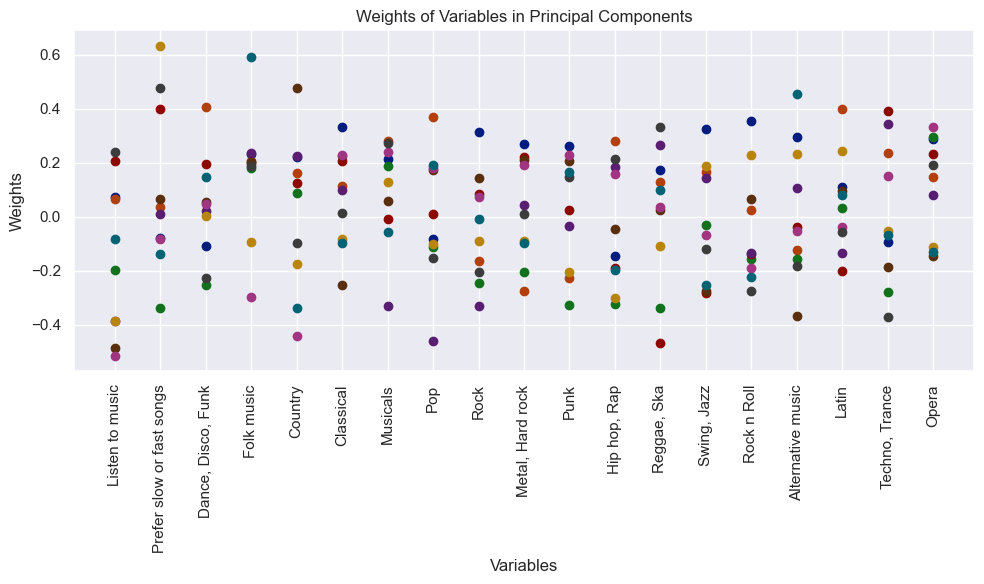

In [95]:
import matplotlib.pyplot as plt

# Transponer el DataFrame nuevamente para tener las variables en las filas y los componentes principales en las columnas
weights_transposed_df = weights_traspuesta_musical_df.T

# Obtener los nombres de los componentes principales (PC)
components = weights_transposed_df.index

# Obtener los nombres de las variables
variables = weights_transposed_df.columns

# Crear el gráfico
plt.figure(figsize=(10, 6))

# Iterar sobre cada componente principal y dibujar un punto para cada variable
for component in components:
    plt.scatter(variables, weights_transposed_df.loc[component], label=component)

# Añadir etiquetas y leyenda
plt.xlabel('Variables')
plt.ylabel('Weights')
plt.title('Weights of Variables in Principal Components')
plt.xticks(rotation=90)

# Mostrar el gráfico
plt.tight_layout()
plt.show()


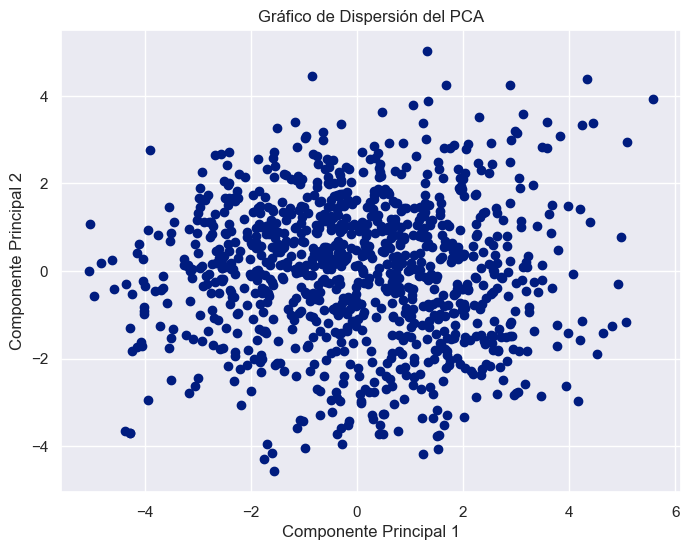

In [96]:
plt.figure(figsize=(8, 6))
plt.scatter(pca_data[:, 0], pca_data[:, 1])
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión del PCA')
plt.grid(True)
plt.show()

### Diagramas de dispersion filtrados por género

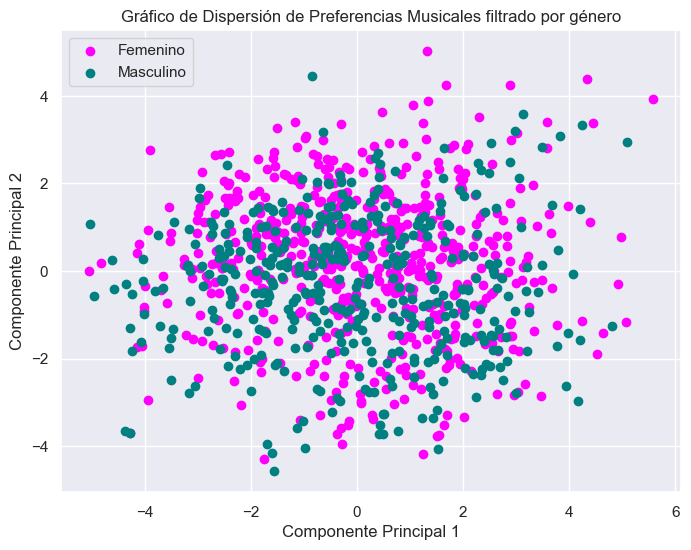

In [97]:
plt.figure(figsize=(8, 6))

colors = {0: 'magenta', 1: 'teal'}

# Iterar sobre las categorías de género
for gender in df['Gender'].unique():
    plt.scatter(pca_data[df['Gender'] == gender, 0],
                pca_data[df['Gender'] == gender, 1],
                label=gender, color = colors[gender])


plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión de Preferencias Musicales filtrado por género')
plt.legend(labels=['Femenino', 'Masculino'])
plt.grid(True)
plt.show()

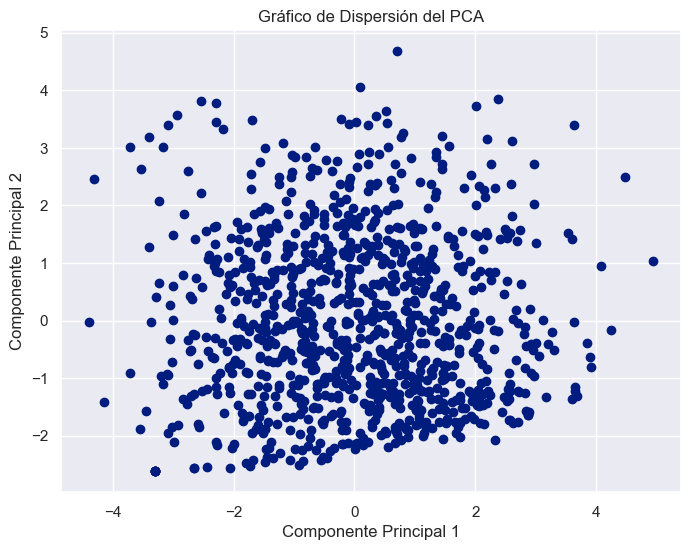

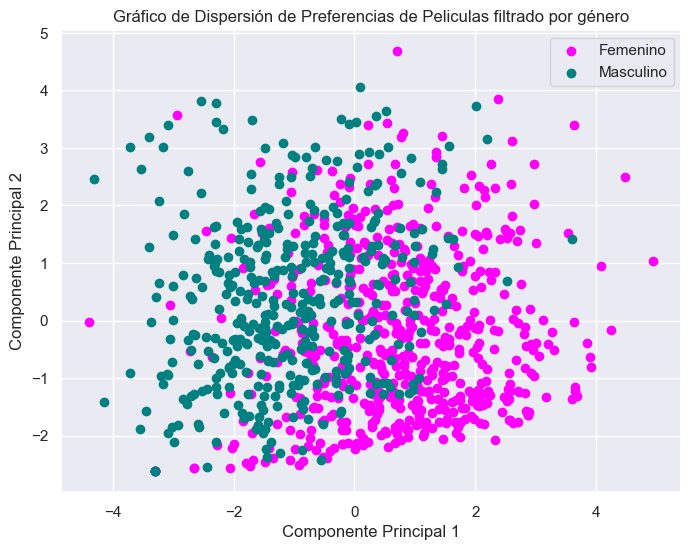

In [98]:
data = preferenciasPeliculas
scaled_data = preprocessing.scale(data)
pca = PCA(n_components= 10) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
plt.figure(figsize=(8, 6))
plt.scatter(pca_data[:, 0], pca_data[:, 1])
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión del PCA')
plt.grid(True)
plt.show()
plt.figure(figsize=(8, 6))

colors = {0: 'magenta', 1: 'teal'}

# Iterar sobre las categorías de género
for gender in df['Gender'].unique():
    plt.scatter(pca_data[df['Gender'] == gender, 0],
                pca_data[df['Gender'] == gender, 1],
                label=gender, color = colors[gender])


plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión de Preferencias de Peliculas filtrado por género')
plt.legend(labels=['Femenino', 'Masculino'])
plt.grid(True)
plt.show()

In [99]:
pca_data

array([[ 1.77935916, -1.5138781 , -1.07826498, ...,  0.90964244,
         0.62326889, -1.36312262],
       [ 0.9154732 , -0.06063145,  0.2286739 , ...,  0.74395736,
        -0.23495513, -0.61484605],
       [ 0.77873278, -0.31129877, -0.90767698, ...,  0.19487902,
         0.52595862, -1.73173484],
       ...,
       [ 1.12391782,  0.47475395, -1.73140718, ...,  0.79863785,
        -1.71230783,  1.01602397],
       [ 1.03126576, -1.11581718, -1.20208698, ..., -1.52247782,
        -0.38306613,  0.14233419],
       [ 0.67059429,  0.722008  , -0.50255904, ...,  0.20833041,
        -0.23513476, -0.52641048]])

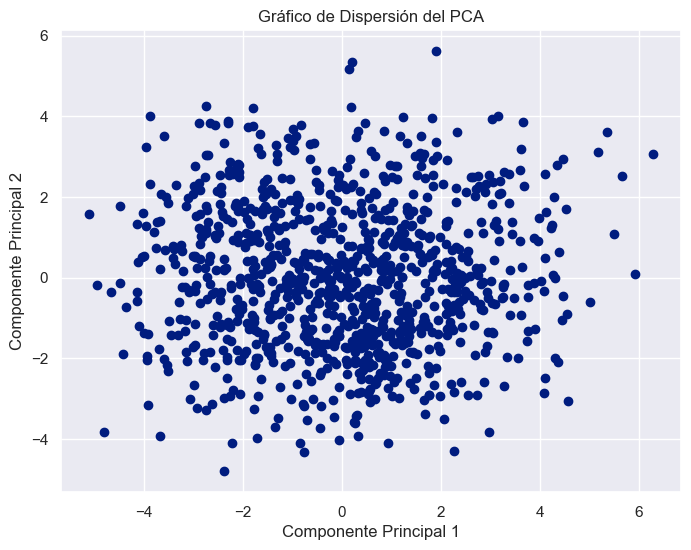

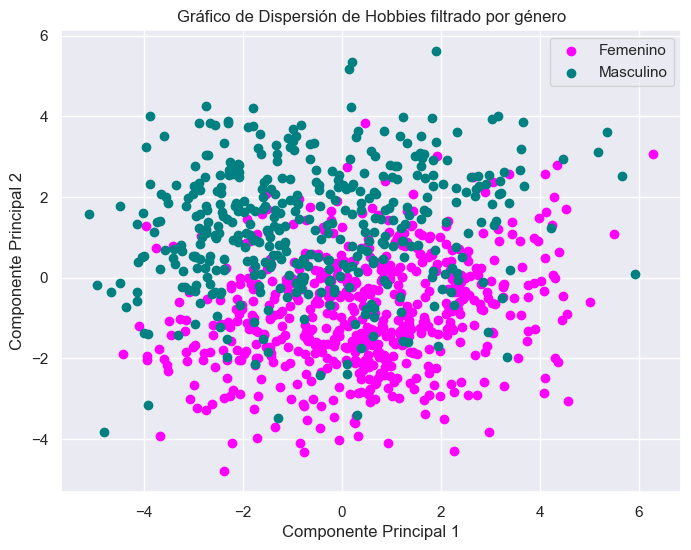

In [100]:
data = hobbies_
scaled_data = preprocessing.scale(data)
pca = PCA(n_components= 10) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
plt.figure(figsize=(8, 6))
plt.scatter(pca_data[:, 0], pca_data[:, 1])
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión del PCA')
plt.grid(True)
plt.show()
plt.figure(figsize=(8, 6))

colors = {0: 'magenta', 1: 'teal'}

# Iterar sobre las categorías de género
for gender in df['Gender'].unique():
    plt.scatter(pca_data[df['Gender'] == gender, 0],
                pca_data[df['Gender'] == gender, 1],
                label=gender, color = colors[gender])


plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión de Hobbies filtrado por género')
plt.legend(labels=['Femenino', 'Masculino'])
plt.grid(True)
plt.show()

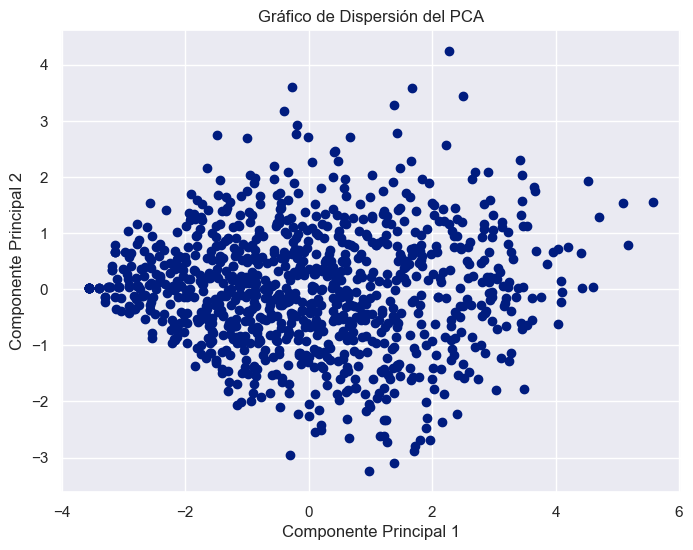

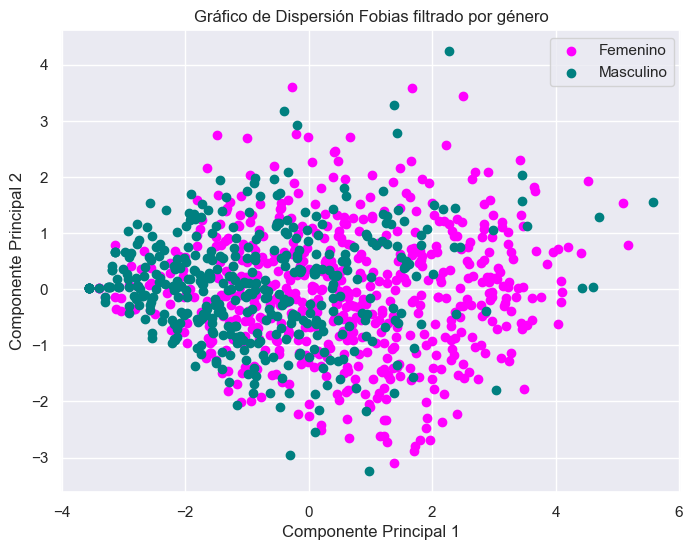

In [101]:
data = fobias_
scaled_data = preprocessing.scale(data)
pca = PCA(n_components= 10) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
plt.figure(figsize=(8, 6))
plt.scatter(pca_data[:, 0], pca_data[:, 1])
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión del PCA')
plt.grid(True)
plt.show()
plt.figure(figsize=(8, 6))

colors = {0: 'magenta', 1: 'teal'}

# Iterar sobre las categorías de género
for gender in df['Gender'].unique():
    plt.scatter(pca_data[df['Gender'] == gender, 0],
                pca_data[df['Gender'] == gender, 1],
                label=gender, color = colors[gender])


plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión Fobias filtrado por género')
plt.legend(labels=['Femenino', 'Masculino'])
plt.grid(True)
plt.show()

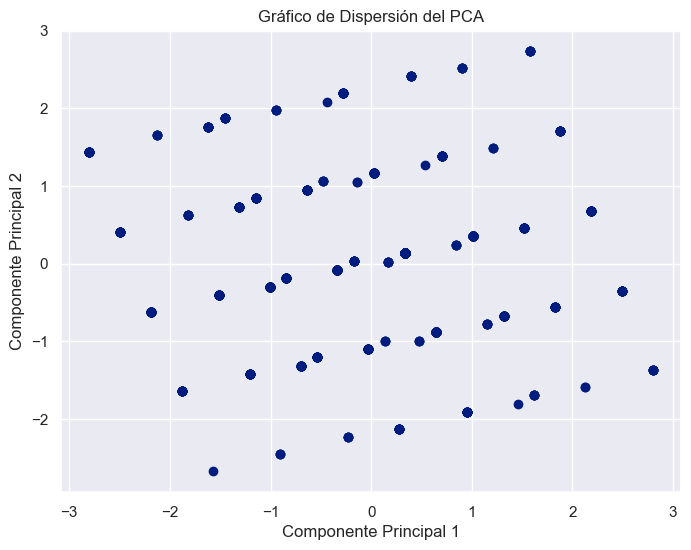

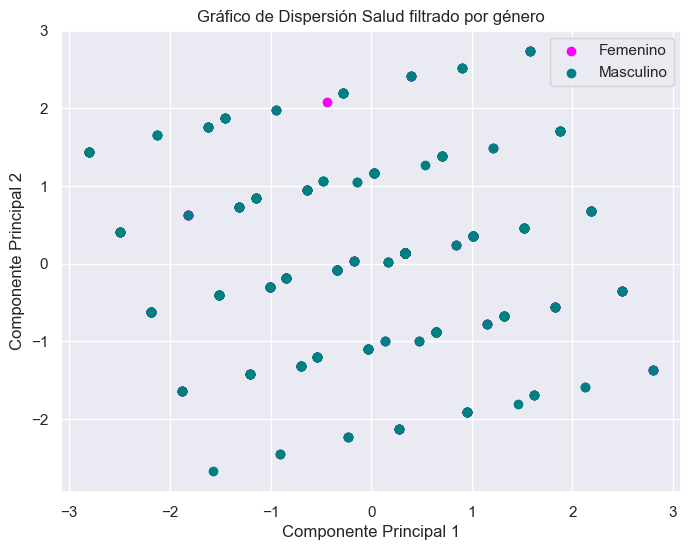

In [102]:
data = salud_
scaled_data = preprocessing.scale(data)
pca = PCA(n_components=3) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
plt.figure(figsize=(8, 6))
plt.scatter(pca_data[:, 0], pca_data[:, 1])
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión del PCA')
plt.grid(True)
plt.show()
plt.figure(figsize=(8, 6))

colors = {0: 'magenta', 1: 'teal'}

# Iterar sobre las categorías de género
for gender in df['Gender'].unique():
    plt.scatter(pca_data[df['Gender'] == gender, 0],
                pca_data[df['Gender'] == gender, 1],
                label=gender, color = colors[gender])


plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión Salud filtrado por género')
plt.legend(labels=['Femenino', 'Masculino'])
plt.grid(True)
plt.show()

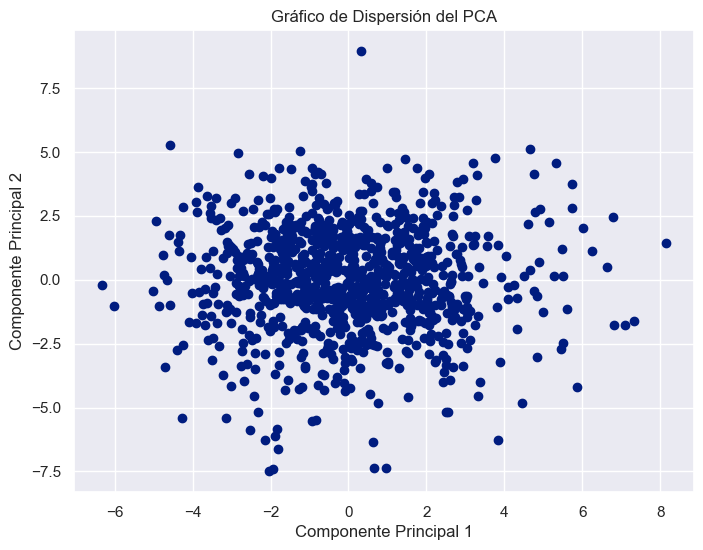

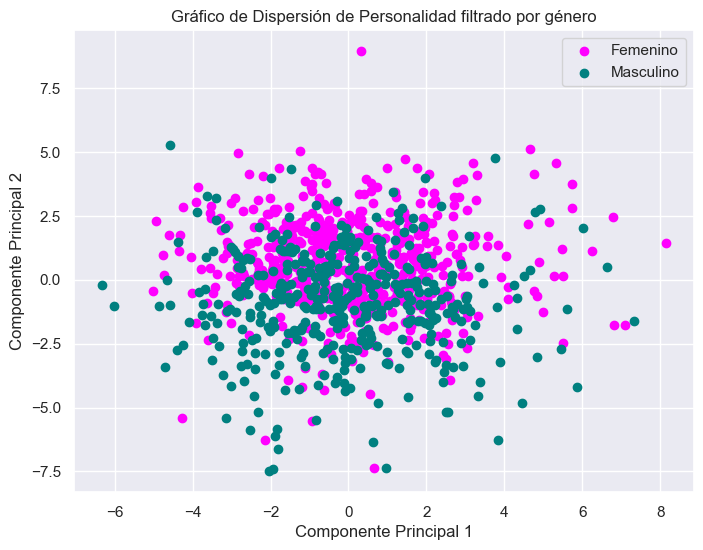

In [103]:
data = personalidad_
scaled_data = preprocessing.scale(data)
pca = PCA(n_components= 10) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
plt.figure(figsize=(8, 6))
plt.scatter(pca_data[:, 0], pca_data[:, 1])
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión del PCA')
plt.grid(True)
plt.show()
plt.figure(figsize=(8, 6))

colors = {0: 'magenta', 1: 'teal'}

# Iterar sobre las categorías de género
for gender in df['Gender'].unique():
    plt.scatter(pca_data[df['Gender'] == gender, 0],
                pca_data[df['Gender'] == gender, 1],
                label=gender, color = colors[gender])


plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión de Personalidad filtrado por género')
plt.legend(labels=['Femenino', 'Masculino'])
plt.grid(True)
plt.show()

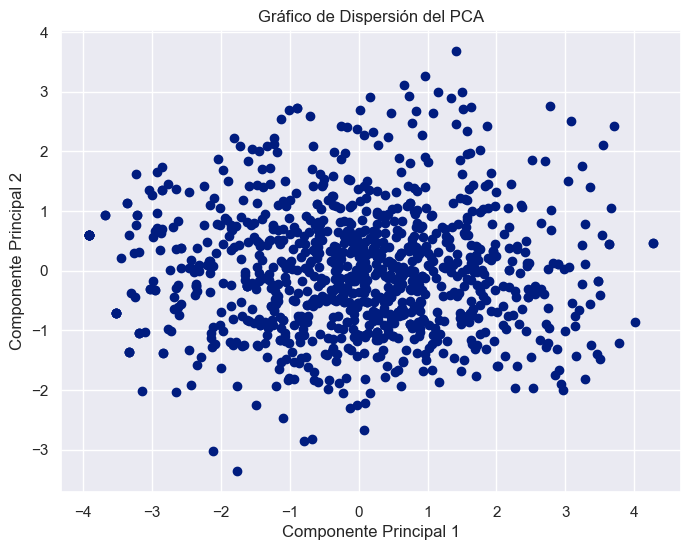

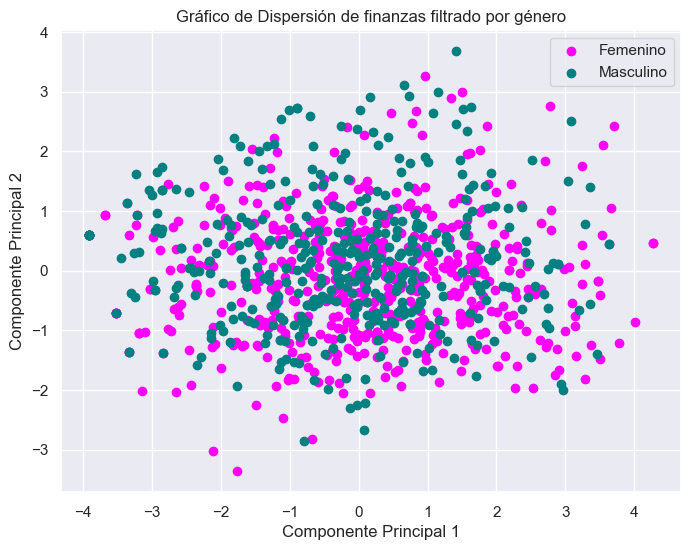

In [104]:
data = finanzas_
scaled_data = preprocessing.scale(data)
pca = PCA(n_components= 5) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
plt.figure(figsize=(8, 6))
plt.scatter(pca_data[:, 0], pca_data[:, 1])
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión del PCA')
plt.grid(True)
plt.show()
plt.figure(figsize=(8, 6))

colors = {0: 'magenta', 1: 'teal'}

# Iterar sobre las categorías de género
for gender in df['Gender'].unique():
    plt.scatter(pca_data[df['Gender'] == gender, 0],
                pca_data[df['Gender'] == gender, 1],
                label=gender, color = colors[gender])


plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión de finanzas filtrado por género')
plt.legend(labels=['Femenino', 'Masculino'])
plt.grid(True)
plt.show()

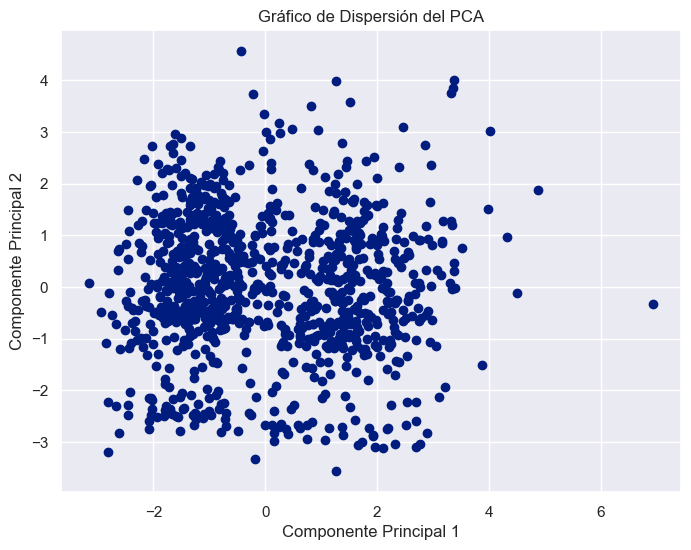

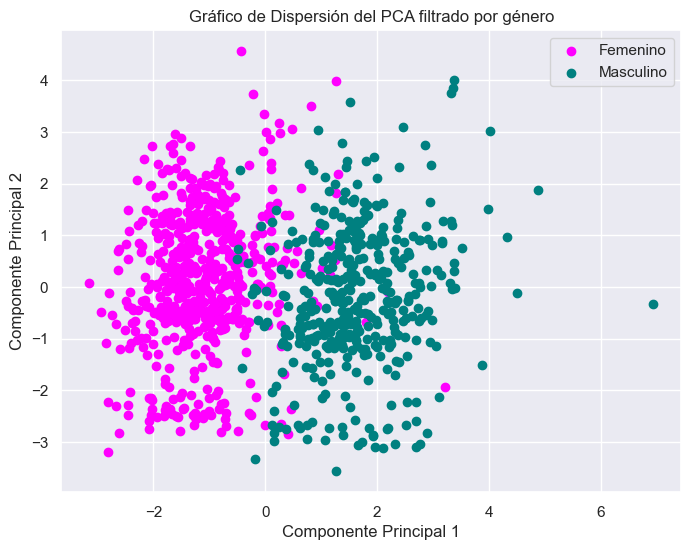

In [105]:
data = datosEncuestados_
scaled_data = preprocessing.scale(data)
pca = PCA(n_components= 10) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
plt.figure(figsize=(8, 6))
plt.scatter(pca_data[:, 0], pca_data[:, 1])
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión del PCA')
plt.grid(True)
plt.show()
plt.figure(figsize=(8, 6))

colors = {0: 'magenta', 1: 'teal'}

# Iterar sobre las categorías de género
for gender in df['Gender'].unique():
    plt.scatter(pca_data[df['Gender'] == gender, 0],
                pca_data[df['Gender'] == gender, 1],
                label=gender, color = colors[gender])


plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión del PCA filtrado por género')
plt.legend(labels=['Femenino', 'Masculino'])
plt.grid(True)
plt.show()

### Diagramas de dispersión filtrado por Edad


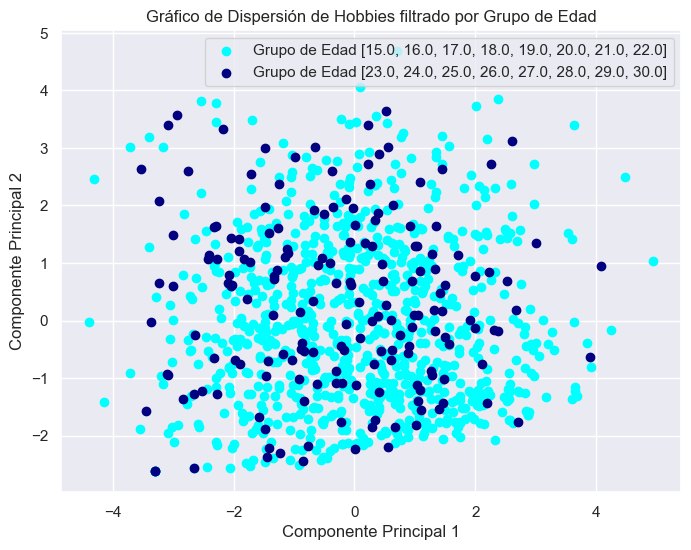

In [106]:
data = preferenciasPeliculas
scaled_data = preprocessing.scale(data)
pca = PCA(n_components= 10) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
# Crear una lista de colores
colors1 = ['#00FFFF','#000080']
# Filtrar por grupos de edades en intervalos de 8 en 8
age_groups = sorted(df['Age'].unique())
age_groups_divided = [age_groups[i:i+8] for i in range(0, len(age_groups), 8)]

plt.figure(figsize=(8, 6))

# Iterar sobre los grupos de edades y asignarles colores correspondientes
for i, age_group in enumerate(age_groups_divided):
    age_mask = df['Age'].isin(age_group)
    plt.scatter(pca_data[age_mask, 0],
                pca_data[age_mask, 1],
                label=f'Grupo de Edad {age_group}', color=colors1[i])

plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión de Hobbies filtrado por Grupo de Edad')
plt.legend()
plt.grid(True)
plt.show()

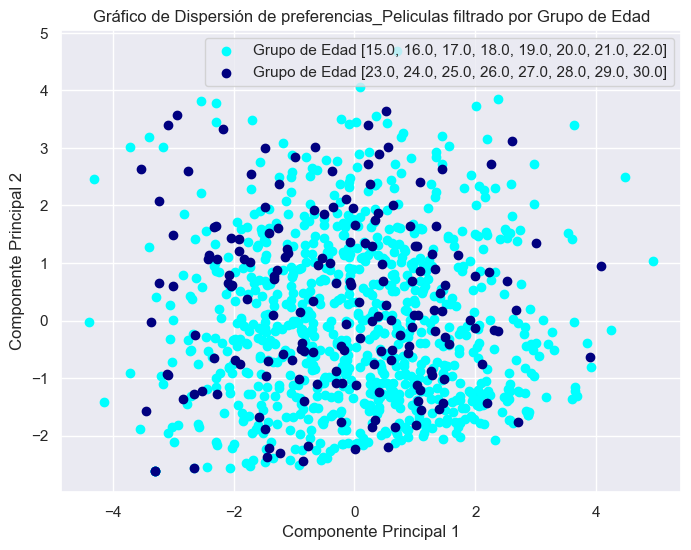

In [107]:
data = preferenciasPeliculas
scaled_data = preprocessing.scale(data)
pca = PCA(n_components= 10) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
# Crear una lista de colores
colors1 = ['#00FFFF','#000080']
# Filtrar por grupos de edades en intervalos de 8 en 8
age_groups = sorted(df['Age'].unique())
age_groups_divided = [age_groups[i:i+8] for i in range(0, len(age_groups), 8)]

plt.figure(figsize=(8, 6))

# Iterar sobre los grupos de edades y asignarles colores correspondientes
for i, age_group in enumerate(age_groups_divided):
    age_mask = df['Age'].isin(age_group)
    plt.scatter(pca_data[age_mask, 0],
                pca_data[age_mask, 1],
                label=f'Grupo de Edad {age_group}', color=colors1[i])

plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión de preferencias_Peliculas filtrado por Grupo de Edad')
plt.legend()
plt.grid(True)
plt.show()

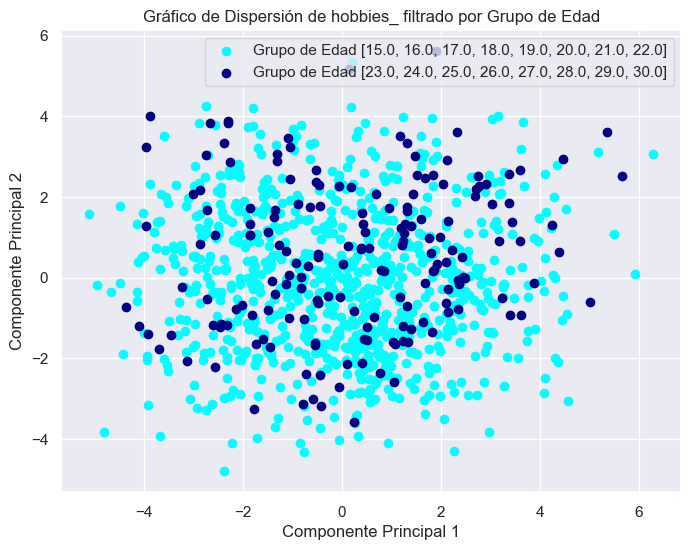

In [108]:
data = hobbies_
scaled_data = preprocessing.scale(data)
pca = PCA(n_components= 10) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
# Crear una lista de colores
colors1 = ['#00FFFF','#000080']
# Filtrar por grupos de edades en intervalos de 8 en 8
age_groups = sorted(df['Age'].unique())
age_groups_divided = [age_groups[i:i+8] for i in range(0, len(age_groups), 8)]

plt.figure(figsize=(8, 6))

# Iterar sobre los grupos de edades y asignarles colores correspondientes
for i, age_group in enumerate(age_groups_divided):
    age_mask = df['Age'].isin(age_group)
    plt.scatter(pca_data[age_mask, 0],
                pca_data[age_mask, 1],
                label=f'Grupo de Edad {age_group}', color=colors1[i])

plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión de hobbies_ filtrado por Grupo de Edad')
plt.legend()
plt.grid(True)
plt.show()

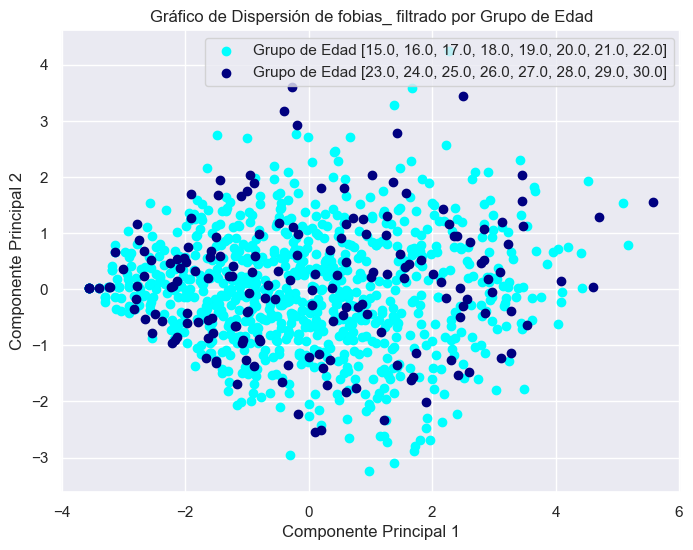

In [109]:
data = fobias_
scaled_data = preprocessing.scale(data)
pca = PCA(n_components= 10) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
# Crear una lista de colores
colors1 = ['#00FFFF','#000080']
# Filtrar por grupos de edades en intervalos de 8 en 8
age_groups = sorted(df['Age'].unique())
age_groups_divided = [age_groups[i:i+8] for i in range(0, len(age_groups), 8)]

plt.figure(figsize=(8, 6))

# Iterar sobre los grupos de edades y asignarles colores correspondientes
for i, age_group in enumerate(age_groups_divided):
    age_mask = df['Age'].isin(age_group)
    plt.scatter(pca_data[age_mask, 0],
                pca_data[age_mask, 1],
                label=f'Grupo de Edad {age_group}', color=colors1[i])

plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión de fobias_ filtrado por Grupo de Edad')
plt.legend()
plt.grid(True)
plt.show()

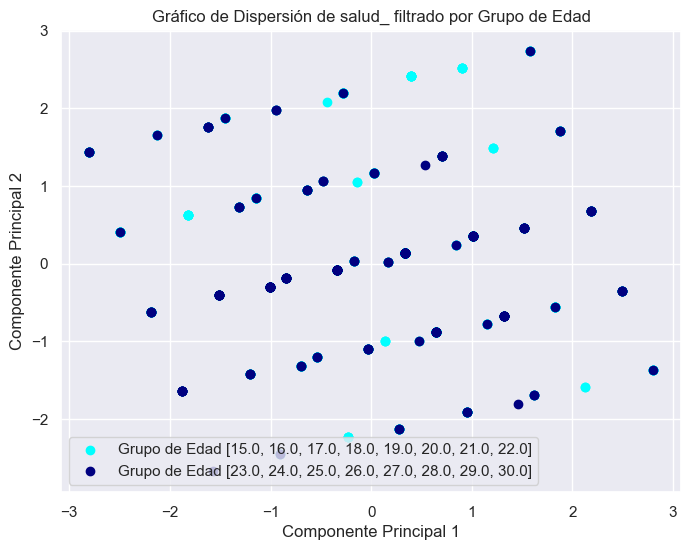

In [110]:
data = salud_
scaled_data = preprocessing.scale(data)
pca = PCA(n_components= 3) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
# Crear una lista de colores
colors1 = ['#00FFFF','#000080']
# Filtrar por grupos de edades en intervalos de 8 en 8
age_groups = sorted(df['Age'].unique())
age_groups_divided = [age_groups[i:i+8] for i in range(0, len(age_groups), 8)]

plt.figure(figsize=(8, 6))

# Iterar sobre los grupos de edades y asignarles colores correspondientes
for i, age_group in enumerate(age_groups_divided):
    age_mask = df['Age'].isin(age_group)
    plt.scatter(pca_data[age_mask, 0],
                pca_data[age_mask, 1],
                label=f'Grupo de Edad {age_group}', color=colors1[i])

plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión de salud_ filtrado por Grupo de Edad')
plt.legend()
plt.grid(True)
plt.show()

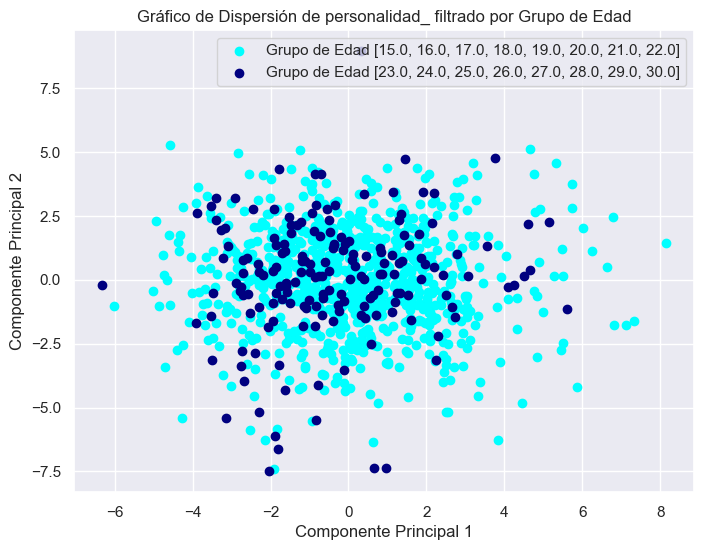

In [111]:
data = personalidad_
scaled_data = preprocessing.scale(data)
pca = PCA(n_components= 10) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
# Crear una lista de colores
colors1 = ['#00FFFF','#000080']
# Filtrar por grupos de edades en intervalos de 8 en 8
age_groups = sorted(df['Age'].unique())
age_groups_divided = [age_groups[i:i+8] for i in range(0, len(age_groups), 8)]

plt.figure(figsize=(8, 6))

# Iterar sobre los grupos de edades y asignarles colores correspondientes
for i, age_group in enumerate(age_groups_divided):
    age_mask = df['Age'].isin(age_group)
    plt.scatter(pca_data[age_mask, 0],
                pca_data[age_mask, 1],
                label=f'Grupo de Edad {age_group}', color=colors1[i])

plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión de personalidad_ filtrado por Grupo de Edad')
plt.legend()
plt.grid(True)
plt.show()

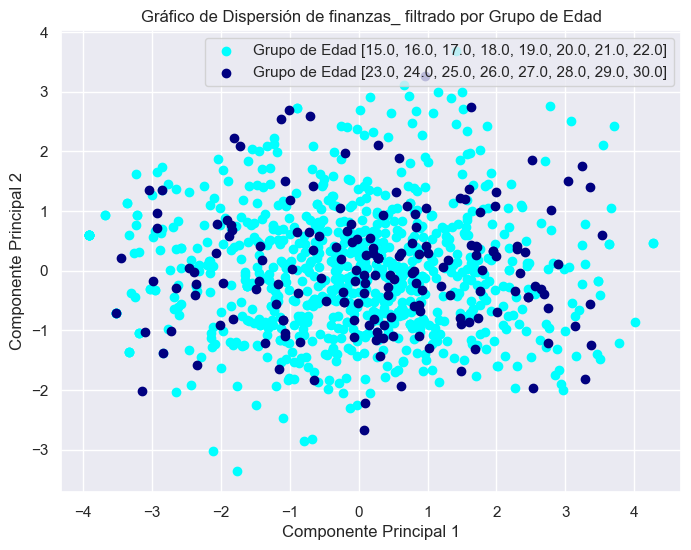

In [112]:
data = finanzas_
scaled_data = preprocessing.scale(data)
pca = PCA(n_components= 5) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
# Crear una lista de colores
colors1 = ['#00FFFF','#000080']
# Filtrar por grupos de edades en intervalos de 8 en 8
age_groups = sorted(df['Age'].unique())
age_groups_divided = [age_groups[i:i+8] for i in range(0, len(age_groups), 8)]

plt.figure(figsize=(8, 6))

# Iterar sobre los grupos de edades y asignarles colores correspondientes
for i, age_group in enumerate(age_groups_divided):
    age_mask = df['Age'].isin(age_group)
    plt.scatter(pca_data[age_mask, 0],
                pca_data[age_mask, 1],
                label=f'Grupo de Edad {age_group}', color=colors1[i])

plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión de finanzas_ filtrado por Grupo de Edad')
plt.legend()
plt.grid(True)
plt.show()

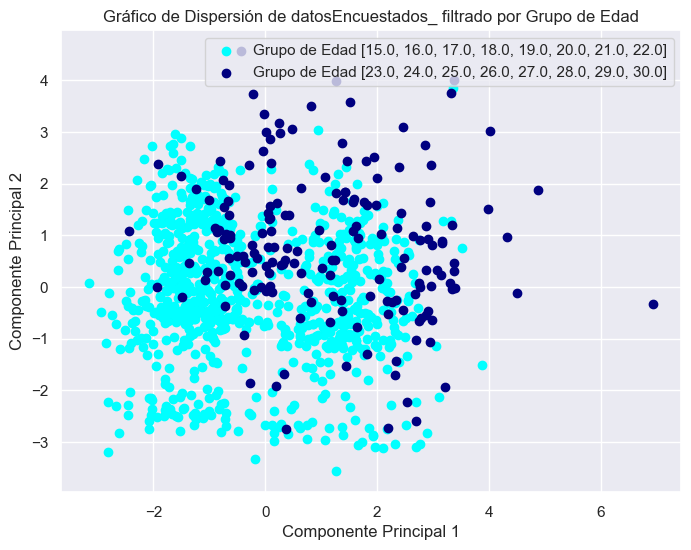

In [113]:
data = datosEncuestados_
scaled_data = preprocessing.scale(data)
pca = PCA(n_components= 5) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
# Crear una lista de colores
colors1 = ['#00FFFF','#000080']
# Filtrar por grupos de edades en intervalos de 8 en 8
age_groups = sorted(df['Age'].unique())
age_groups_divided = [age_groups[i:i+8] for i in range(0, len(age_groups), 8)]

plt.figure(figsize=(8, 6))

# Iterar sobre los grupos de edades y asignarles colores correspondientes
for i, age_group in enumerate(age_groups_divided):
    age_mask = df['Age'].isin(age_group)
    plt.scatter(pca_data[age_mask, 0],
                pca_data[age_mask, 1],
                label=f'Grupo de Edad {age_group}', color=colors1[i])

plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión de datosEncuestados_ filtrado por Grupo de Edad')
plt.legend()
plt.grid(True)
plt.show()

### PCA General

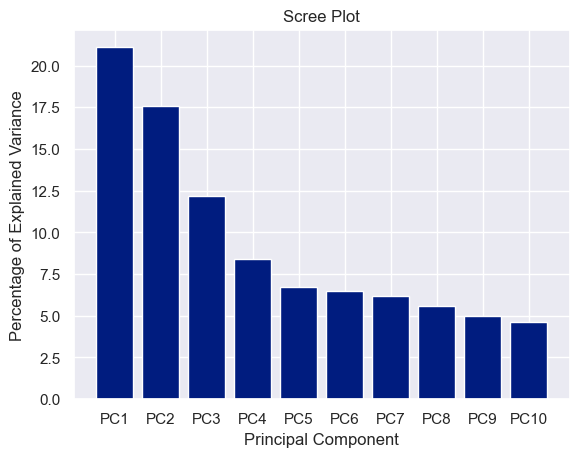

,Enjoy watching movies,Horror movies,Thriller movies,Comedy movies,Romantic movies,Sci-fi movies,War movies,Tales,Cartoons,Documentaries,Western movies,Action movies
0,-0.18,-0.30,-0.39,0.01,0.26,-0.38,-0.41,0.13,0.05,-0.19,-0.36,-0.41
1,-0.30,-0.03,-0.03,-0.36,-0.36,-0.12,-0.00,-0.55,-0.55,-0.15,-0.03,-0.09
2,-0.29,-0.49,-0.40,-0.23,-0.09,0.05,0.24,0.15,0.10,0.48,0.36,0.04
3,0.16,-0.34,-0.32,0.51,0.28,0.19,-0.01,-0.28,-0.36,-0.20,0.14,0.33
4,0.59,-0.41,-0.05,-0.49,-0.17,0.24,-0.03,0.02,0.11,-0.21,-0.28,0.13
5,-0.54,0.05,-0.11,-0.04,-0.19,0.46,-0.25,0.17,0.25,-0.45,-0.02,0.30
6,0.01,-0.09,0.02,0.33,-0.49,-0.09,-0.39,-0.06,0.02,0.49,-0.39,0.31
7,-0.06,0.05,0.09,-0.11,0.33,0.66,-0.29,-0.14,-0.17,0.40,-0.15,-0.33
8,-0.03,0.08,-0.29,0.30,-0.27,0.25,0.60,-0.02,0.07,-0.06,-0.44,-0.34
9,-0.33,-0.20,0.34,-0.13,0.41,-0.11,0.35,0.04,-0.08,0.07,-0.50,0.39


In [114]:
import pandas as pd
import numpy as np
import random as rd
from sklearn.decomposition import PCA
from sklearn import preprocessing
import matplotlib.pyplot as plt # NOTE: This was tested with matplotlib v. 2.1.0


data = preferenciasPeliculas


scaled_data = preprocessing.scale(data)

pca = PCA(n_components= 10) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data

#The following code constructs the Scree plot
per_var = np.round(pca.explained_variance_ratio_* 100, decimals=1)
labels = ['PC' + str(x) for x in range(1, len(per_var)+1)]

plt.bar(x=range(1,len(per_var)+1), height=per_var, tick_label=labels)
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Component')
plt.title('Scree Plot')
plt.show()


components = pca.components_
weights = pca.explained_variance_ratio_

# Crear un DataFrame para almacenar los pesos de las variables en cada componente principal
variable_names = list(data.columns)
weights_df = pd.DataFrame(components, columns=variable_names)

# Añadir una fila para los pesos de cada componente
#weights_df = weights_df.append(pd.Series(weights, name='Weights'))

# Transponer el DataFrame para que las filas representen componentes y las columnas representen variables

weights_df

                          0     1     2     3     4     5     6     7     8  \
Enjoy watching movies -0.18 -0.30 -0.29  0.16  0.59 -0.54  0.01 -0.06 -0.03   
Horror movies         -0.30 -0.03 -0.49 -0.34 -0.41  0.05 -0.09  0.05  0.08   
Thriller movies       -0.39 -0.03 -0.40 -0.32 -0.05 -0.11  0.02  0.09 -0.29   
Comedy movies          0.01 -0.36 -0.23  0.51 -0.49 -0.04  0.33 -0.11  0.30   
Romantic movies        0.26 -0.36 -0.09  0.28 -0.17 -0.19 -0.49  0.33 -0.27   
Sci-fi movies         -0.38 -0.12  0.05  0.19  0.24  0.46 -0.09  0.66  0.25   
War movies            -0.41 -0.00  0.24 -0.01 -0.03 -0.25 -0.39 -0.29  0.60   
Tales                  0.13 -0.55  0.15 -0.28  0.02  0.17 -0.06 -0.14 -0.02   
Cartoons               0.05 -0.55  0.10 -0.36  0.11  0.25  0.02 -0.17  0.07   
Documentaries         -0.19 -0.15  0.48 -0.20 -0.21 -0.45  0.49  0.40 -0.06   
Western movies        -0.36 -0.03  0.36  0.14 -0.28 -0.02 -0.39 -0.15 -0.44   
Action movies         -0.41 -0.09  0.04  0.33  0.13 

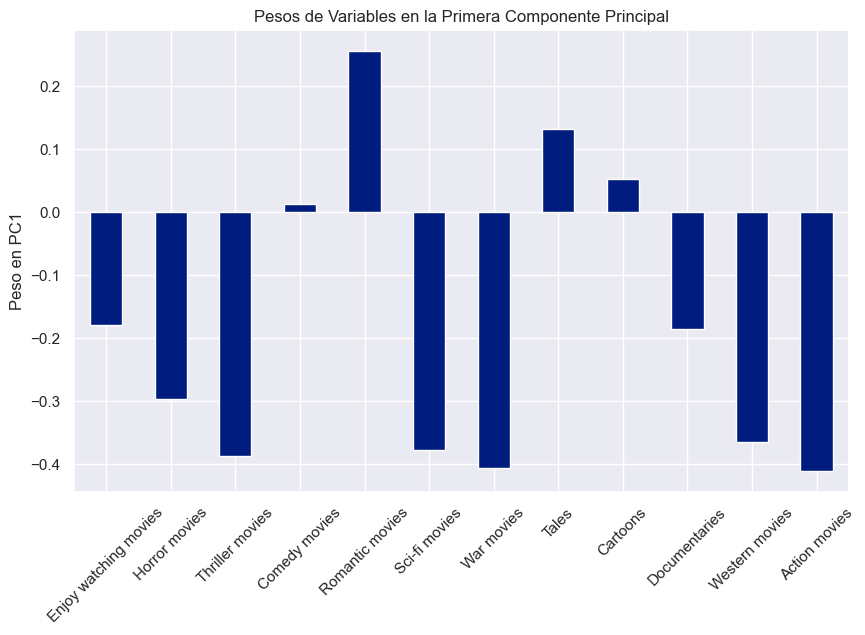

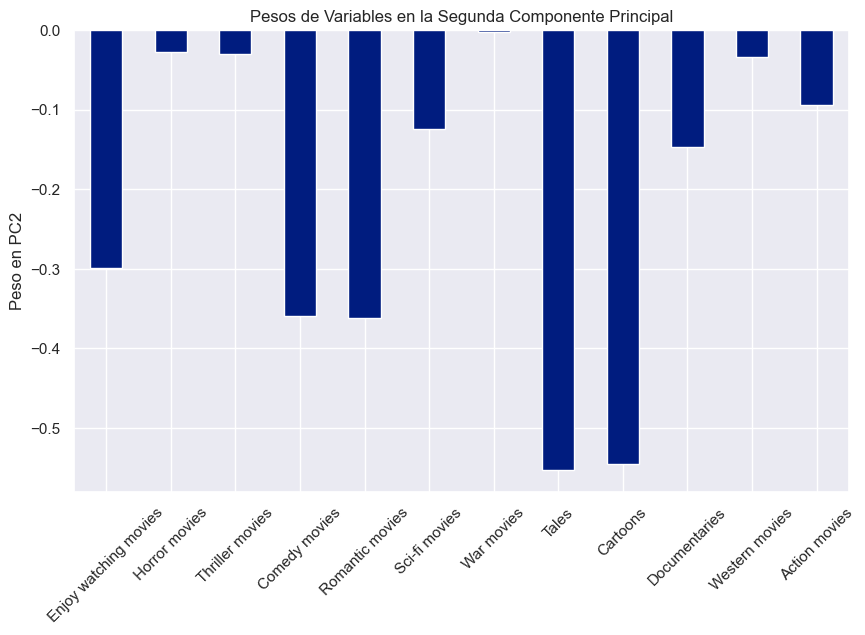

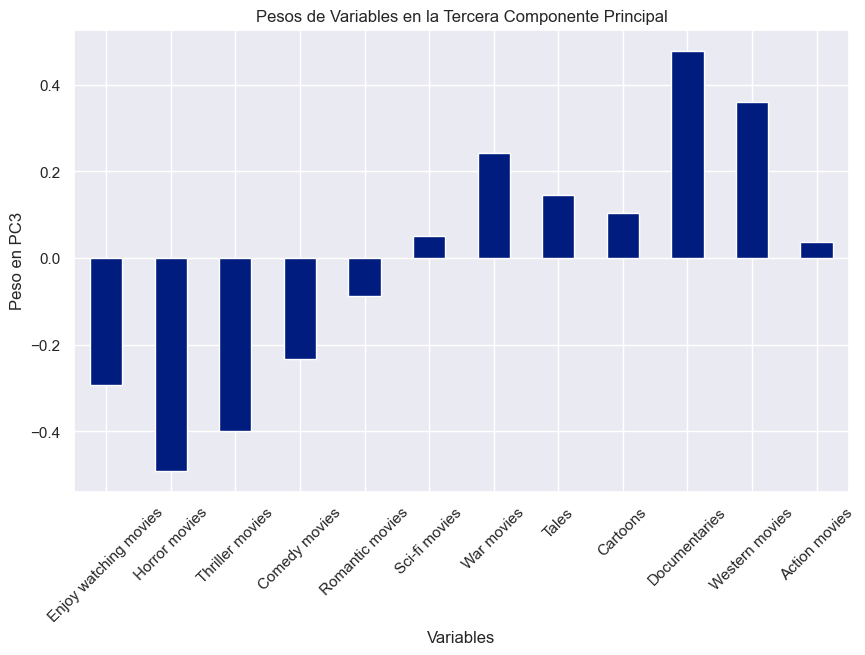

In [115]:
weights_traspuesta_musical_df = weights_df.T
print(weights_traspuesta_musical_df)

weights_pc1 = weights_traspuesta_musical_df[0]
weights_pc2 = weights_traspuesta_musical_df[1]
weights_pc3 = weights_traspuesta_musical_df[2]
weights_pc4 = weights_traspuesta_musical_df[3]


# Crear un gráfico de barras para visualizar los pesos de la primera componente principal
plt.figure(figsize=(10, 6))
weights_pc1.plot(kind='bar')
plt.title('Pesos de Variables en la Primera Componente Principal')
plt.ylabel('Peso en PC1')
plt.xticks(rotation=45)
plt.show()

# Crear un gráfico de barras para visualizar los pesos de la primera componente principal
plt.figure(figsize=(10, 6))
weights_pc2.plot(kind='bar')
plt.title('Pesos de Variables en la Segunda Componente Principal')
plt.ylabel('Peso en PC2')
plt.xticks(rotation=45)
plt.show()

# Crear un gráfico de barras para visualizar los pesos de la primera componente principal
plt.figure(figsize=(10, 6))
weights_pc3.plot(kind='bar')
plt.title('Pesos de Variables en la Tercera Componente Principal')
plt.xlabel('Variables')
plt.ylabel('Peso en PC3')
plt.xticks(rotation=45)
plt.show()

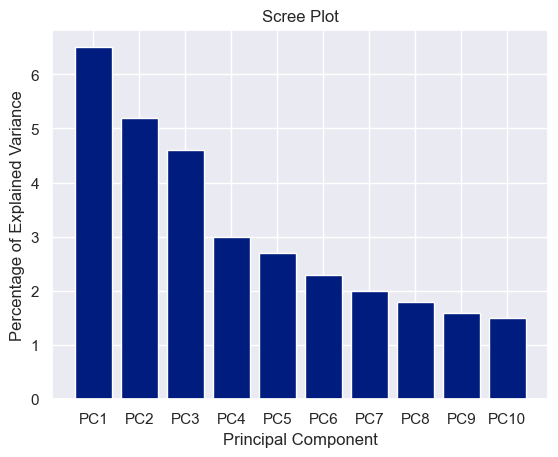

,Listen to music,Prefer slow or fast songs,"Dance, Disco, Funk",Folk music,Country,Classical,Musicals,Pop,Rock,"Metal, Hard rock",Punk,"Hip hop, Rap","Reggae, Ska","Swing, Jazz",Rock n Roll,Alternative music,Latin,"Techno, Trance",Opera,Enjoy watching movies,Horror movies,Thriller movies,Comedy movies,Romantic movies,Sci-fi movies,War movies,Tales,Cartoons,Documentaries,Western movies,Action movies,History,Psychology,Politics,Mathematics,Physics,Internet,"PC Software, Hardware","Economy, Management",Biology,Chemistry,Poetry reading,Geography,Foreign languages,Medicine,Law,Cars,Art,Religion,Outdoor activities,Dancing,Playing musical instruments,Poetry writing,Sport and leisure activities,Sport at competitive level,Gardening,Celebrity lifestyle,Shopping,Science and technology,Theatre,Socializing,Adrenaline sports,Pets,Flying,"Thunder, lightning",Darkness,Heights,Spiders,Snakes,"Rats, mice",Ageing,Dangerous dogs,Public speaking,Smoking habits,Drinking,Live a very healthy lifestyle,Take notice of what goes on around,Try to do tasks as soon as possible and not leave them until last minute,Always make a list so I don't forget anything,Often study or work even in spare time,Look at things from all different angles before go ahead,Believe that bad people will suffer one day and good people will be rewarded,Reliable at work and always complete all tasks given to me,Always keep my promises,Can fall for someone very quickly and then completely lose interest,Would rather have lots of friends than lots of money,Always try to be the funniest one,Can be two-faced sometimes,Damaged things in the past when angry,Take my time to make decisions,Always try to vote in elections,Often think about and regret the decisions I make,Can tell if people listen to me or not when talk to them,A hypochondriac,An empathetic person,Eat because I have to. Don't enjoy food and eat as fast as can,Try to give as much as can to other people at Christmas,Don't like seeing animals suffering,Look after things have borrowed from others,Feel lonely in life,Used to cheat at school,Worry about my health,Wish I could change the past because of things have done,Believe in God,Always have good dreams,Always give to charity,Have lots of friends,Timekeeping,Do lie to others,Very patient,Can quickly adapt to a new environment,Moods change quickly,Well-mannered and look after my appearance,Enjoy meeting new people,Always let other people know about my achievements,Think carefully before answering any important letters,Enjoy children's company,Not afraid to give my opinion if feel strongly about something,Can get angry very easily,Always make sure connect with the right people,Have to be well-prepared before public speaking,Will find a fault in myself if people don't like me,Cry when feel down or things don't go the right way,100% happy with my life,Always full of life and energy,"Prefer big dangerous dogs to smaller, calmer dogs",Believe all personality traits are positive,"If find something that doesn't belong to me, will hand it in",Find it very difficult to get up in the morning,Have many different hobbies and interests,Always listen to my parents' advice,Enjoy taking part in surveys,How much time spend online,Save all the money can,Enjoy going to large shopping centers,Prefer branded clothing to non-branded,Spend a lot of money on partying and socializing,Spend a lot of money on my appearance,Spend a lot of money on gadgets,"Will happily pay more money for good, quality, or healthy food",Age,Height,Weight,How many siblings do have,Gender,Left-handed or right-handed,Highest education achieved,The only child,Spent most of childhood in a village or town,Lived most of childhood in a house or block of flats,ID
0,-0.04,0.05,-0.03,-0.07,-0.01,-0.05,-0.13,-0.08,0.01,0.08,0.04,0.03,0.01,-0.05,-0.02,-0.01,-0.13,0.04,-0.06,-0.01,0.09,0.09,-0.02,-0.18,0.10,0.13,-0.14,-0.08,0.01,0.10,0.14,0.01,-0.08,0.05,0.06,0.09,0.06,0.14,0.02,-0.10,-0.05,-0.14,0.01,-0.09,-0.09,-0.00,0.14,-0.11,-0.07,-

In [116]:
import pandas as pd
import numpy as np
import random as rd
from sklearn.decomposition import PCA
from sklearn import preprocessing
import matplotlib.pyplot as plt # NOTE: This was tested with matplotlib v. 2.1.0
 

data = df


scaled_data = preprocessing.scale(data)
 
pca = PCA(n_components= 10) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
 
#The following code constructs the Scree plot
per_var = np.round(pca.explained_variance_ratio_* 100, decimals=1)
labels = ['PC' + str(x) for x in range(1, len(per_var)+1)]
 
plt.bar(x=range(1,len(per_var)+1), height=per_var, tick_label=labels)
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Component')
plt.title('Scree Plot')
plt.show()


components = pca.components_
weights = pca.explained_variance_ratio_

# Crear un DataFrame para almacenar los pesos de las variables en cada componente principal
variable_names = list(data.columns)
weights_df = pd.DataFrame(components, columns=variable_names)

# Añadir una fila para los pesos de cada componente
#weights_df = weights_df.append(pd.Series(weights, name='Weights'))

weights_df

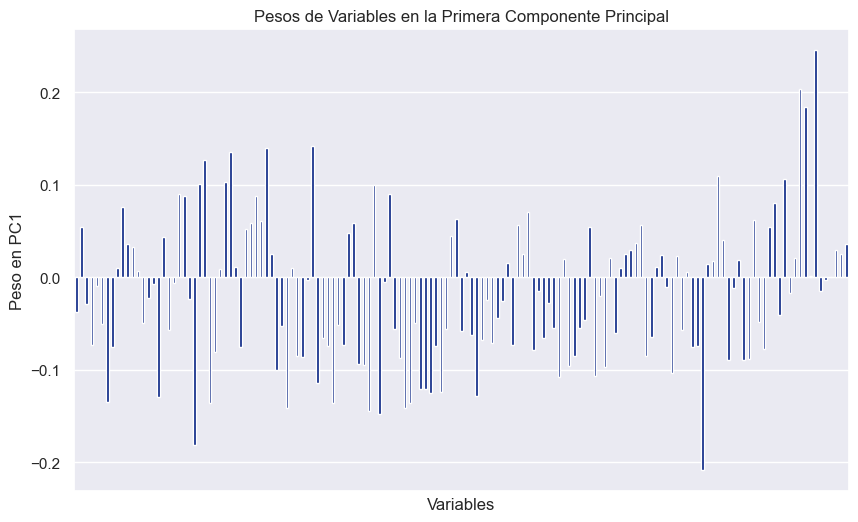

In [117]:
weights_traspuesta_df = weights_df.T

weights_pc1 = weights_traspuesta_df[0]

# Crear un gráfico de barras para visualizar los pesos de la primera componente principal
plt.figure(figsize=(10, 6))
weights_pc1.plot(kind='bar')
plt.title('Pesos de Variables en la Primera Componente Principal')
plt.xlabel('Variables')
plt.ylabel('Peso en PC1')
plt.xticks([])  # Esto elimina los ticks y etiquetas del eje x
plt.show()


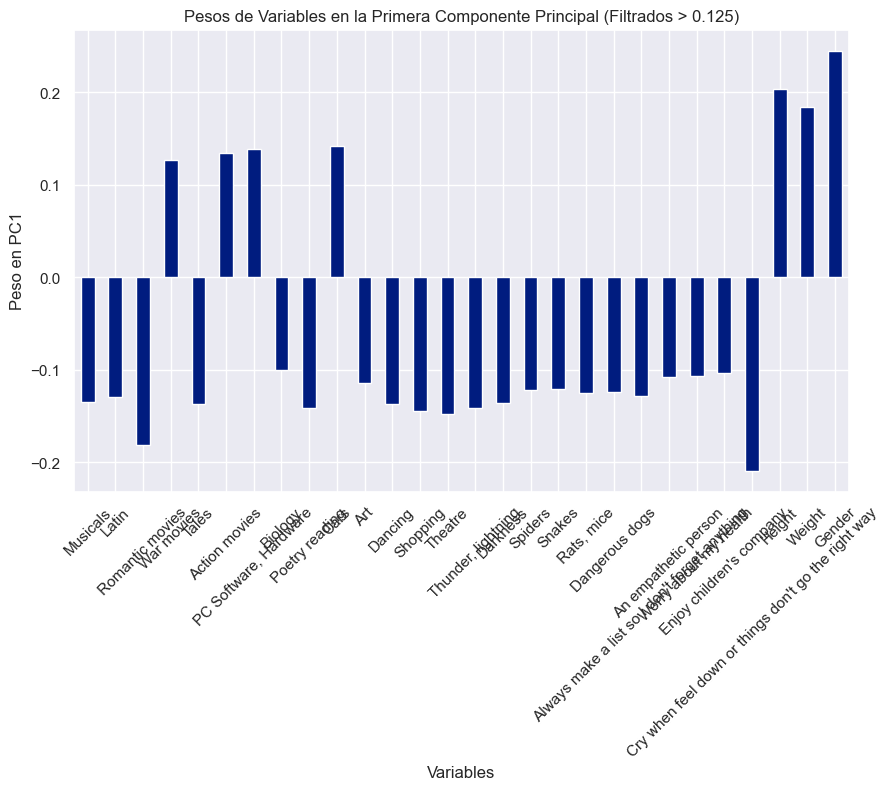

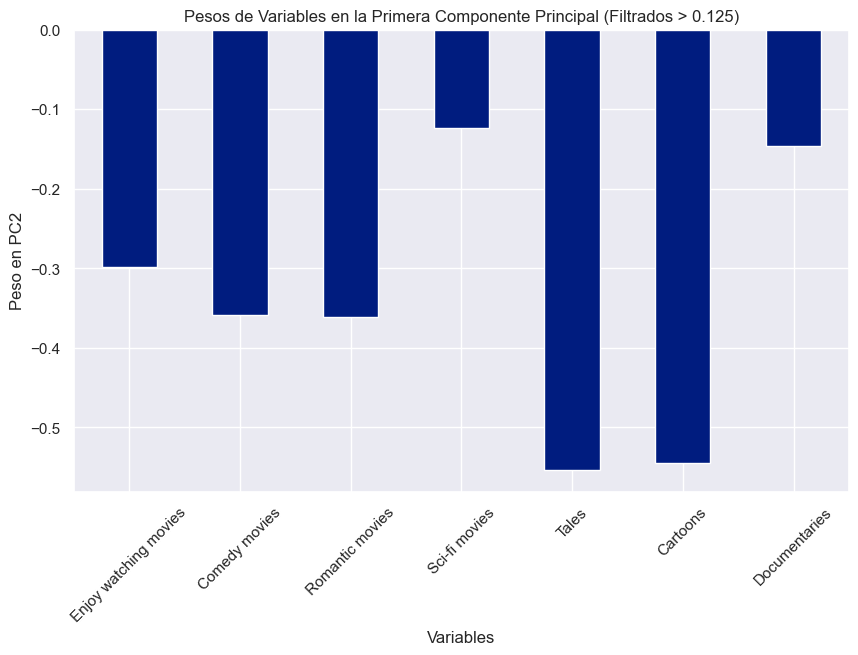

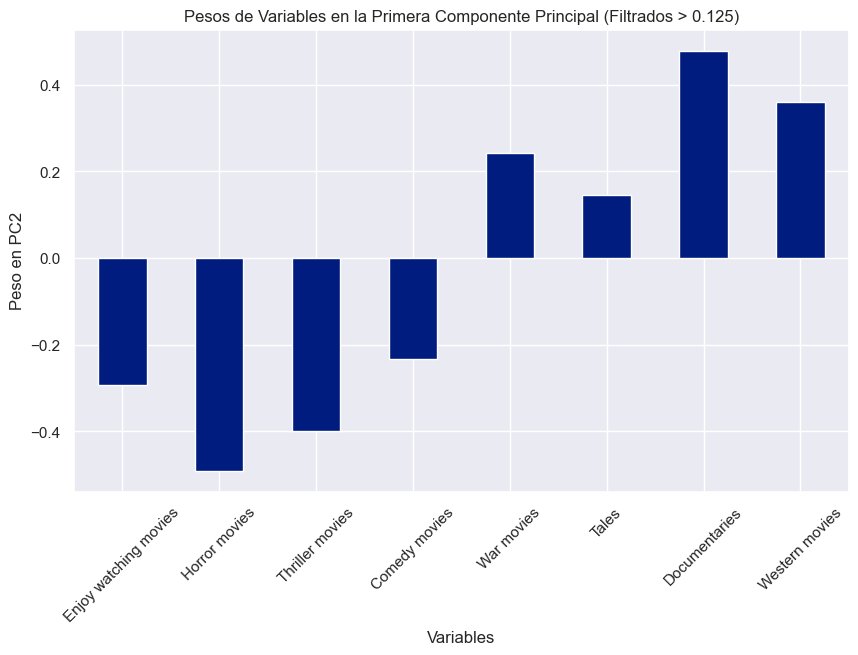

In [118]:

# Filtrar los valores mayores que 0.125
weights_filtered_1 = weights_pc1[(weights_pc1 > 0.125) | (weights_pc1 < -0.10)]
weights_filtered_dict_1 = weights_filtered_1.to_dict()

# Crear un gráfico de barras para visualizar los pesos filtrados de la primera componente principal
plt.figure(figsize=(10, 6))
weights_filtered_1.plot(kind='bar')
plt.title('Pesos de Variables en la Primera Componente Principal (Filtrados > 0.125)')
plt.xlabel('Variables')
plt.ylabel('Peso en PC1')
plt.xticks(rotation=45)
plt.show()

# Filtrar los valores mayores que 0.125
weights_filtered_2 = weights_pc2[(weights_pc2 > 0.125) | (weights_pc2 < -0.10)]
weights_filtered_dict_2 = weights_filtered_2.to_dict()

# Crear un gráfico de barras para visualizar los pesos filtrados de la primera componente principal
plt.figure(figsize=(10, 6))
weights_filtered_2.plot(kind='bar')
plt.title('Pesos de Variables en la Primera Componente Principal (Filtrados > 0.125)')
plt.xlabel('Variables')
plt.ylabel('Peso en PC2')
plt.xticks(rotation=45)
plt.show()

# Filtrar los valores mayores que 0.125
weights_filtered_3 = weights_pc3[(weights_pc3 > 0.125) | (weights_pc3 < -0.10)]
weights_filtered_dict_3 = weights_filtered_3.to_dict()

# Crear un gráfico de barras para visualizar los pesos filtrados de la primera componente principal
plt.figure(figsize=(10, 6))
weights_filtered_3.plot(kind='bar')
plt.title('Pesos de Variables en la Primera Componente Principal (Filtrados > 0.125)')
plt.xlabel('Variables')
plt.ylabel('Peso en PC2')
plt.xticks(rotation=45)
plt.show()

                                                       1     2     3
Action movies                                       0.14  0.07  0.06
Adrenaline sports                                   0.09  0.11  0.12
Ageing                                             -0.07 -0.05  0.06
Always try to be the funniest one                   0.06  0.07  0.05
Biology                                            -0.10  0.10 -0.05
Can quickly adapt to a new environment              0.06  0.09  0.11
Cars                                                0.14  0.08  0.12
Chemistry                                          -0.05  0.09 -0.07
Classical                                          -0.05  0.18 -0.13
Dancing                                            -0.14  0.09  0.11
Enjoy children's company                           -0.10  0.05  0.06
Folk music                                         -0.07  0.13 -0.07
Latin                                              -0.13  0.10  0.06
Live a very healthy lifestyle     

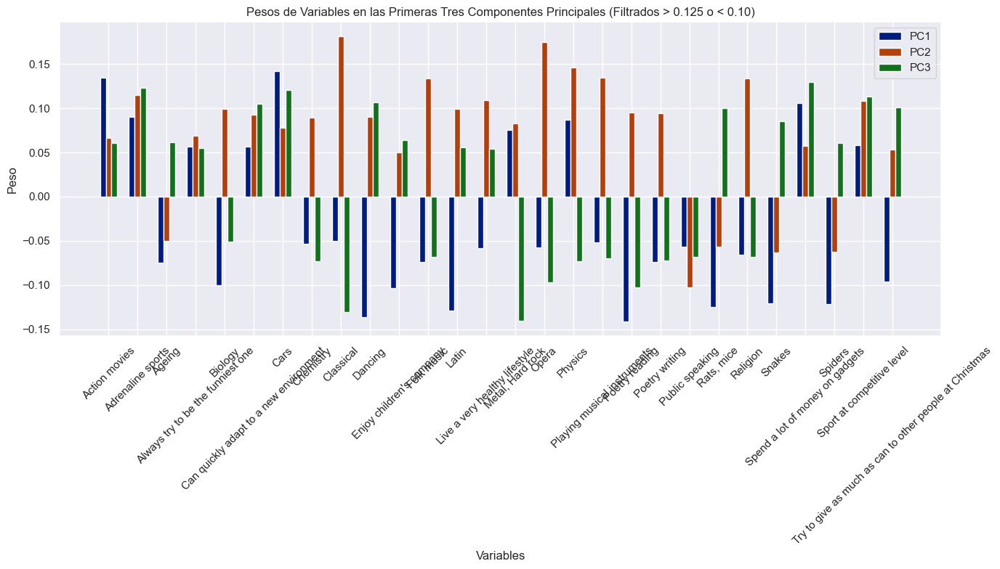

In [119]:

filtered_weights = {}
for i in range(3):  # Considerar las primeras tres componentes principales
    weights_pc = weights_traspuesta_df[i]
    filtered_weights[i + 1] = weights_pc[(weights_pc > 0.05) | (weights_pc < -0.05)]


# Crear un DataFrame con los pesos filtrados para las primeras tres componentes principales
filtered_weights_df = pd.DataFrame(filtered_weights)

# Eliminar las filas (variables) que no cumplen con el filtro en todas las componentes
filtered_weights_df.dropna(inplace=True)

# Crear un gráfico de barras agrupadas
fig, ax = plt.subplots(figsize=(14, 8))

# Configuración de las posiciones de las barras
bar_width = 0.2
indices = np.arange(len(filtered_weights_df))

# Graficar cada componente principal
for i, (pc, weights) in enumerate(filtered_weights_df.items()):
    ax.bar(indices + i * bar_width, weights, bar_width, label=f'PC{pc}')
print(filtered_weights_df)
# Configurar etiquetas y título
ax.set_xlabel('Variables')
ax.set_ylabel('Peso')
ax.set_title('Pesos de Variables en las Primeras Tres Componentes Principales (Filtrados > 0.125 o < 0.10)')
ax.set_xticks(indices + bar_width)
ax.set_xticklabels(filtered_weights_df.index, rotation=45)
ax.legend()

plt.tight_layout()
plt.show()

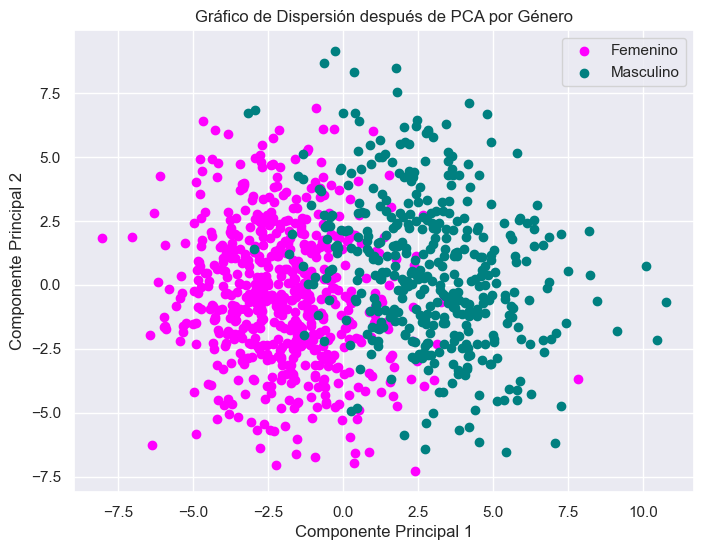

In [120]:
plt.figure(figsize=(8, 6))

colors = {0: 'magenta', 1: 'teal'}
def titulo(gen):
    if gen == 0:
        return 'Femenino'
    else:
        return 'Masculino'
# Iterar sobre las categorías de género
for gender in df['Gender'].unique():
    plt.scatter(pca_data[df['Gender'] == gender, 0], 
                pca_data[df['Gender'] == gender, 1],
                label=titulo(gender), color = colors[gender])


plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión después de PCA por Género')
plt.legend()
plt.grid(True)
plt.show()

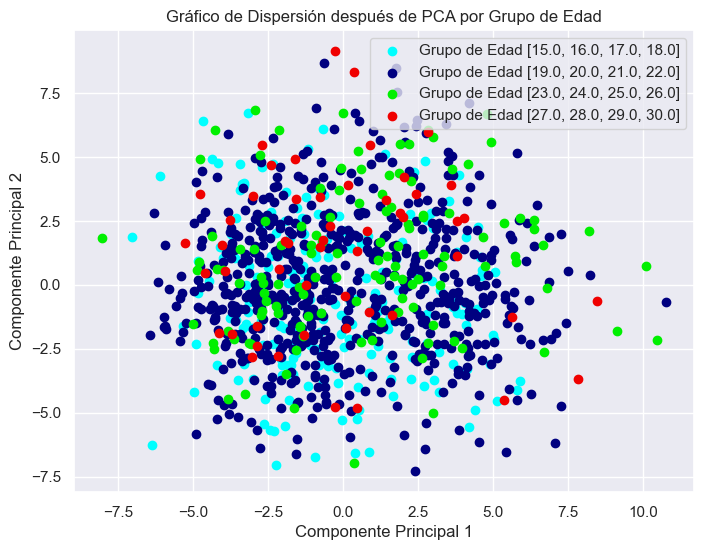

In [121]:
data = df
scaled_data = preprocessing.scale(data)
pca = PCA(n_components= 10) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
# Crear una lista de colores
colors1 = ['#00FFFF','#000080','#00F000','#F00000']
# Filtrar por grupos de edades en intervalos de 8 en 8
age_groups = sorted(df['Age'].unique())
age_groups_divided = [age_groups[i:i+4] for i in range(0, len(age_groups), 4)]

plt.figure(figsize=(8, 6))

# Iterar sobre los grupos de edades y asignarles colores correspondientes
for i, age_group in enumerate(age_groups_divided):
    age_mask = df['Age'].isin(age_group)
    plt.scatter(pca_data[age_mask, 0],
                pca_data[age_mask, 1],
                label=f'Grupo de Edad {age_group}', color=colors1[i])

plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de Dispersión después de PCA por Grupo de Edad')
plt.legend()
plt.grid(True)
plt.show()

# Contraste de Hipótesis 

### Dos poblaciones

In [122]:
import scipy.stats as stats
import matplotlib.pyplot as plt
import pandas as pd




def media_dicotomicas(dataframe, variable_dicotomica):
    # Obtener los valores únicos de la variable dicotómica
    valores_dicotomicos = dataframe[variable_dicotomica].unique()

    # Inicializar diccionarios para almacenar los resultados por cada valor dicotómico
    resultados1 = {}
    resultados2 = {}

    # Filtrar solo las columnas numéricas para evitar errores de tipo
    columnas_numericas = dataframe.select_dtypes(include=[float, int]).columns

    # Calcular la media y la varianza para cada valor dicotómico
    for i, valor in enumerate(valores_dicotomicos):
        # Filtrar el DataFrame por cada valor dicotómico
        df_filtrado = dataframe[dataframe[variable_dicotomica] == valor]

        # Calcular la cantidad de observaciones (n)
        n = len(df_filtrado)

        print(f'El tamaño de la muestra N {i+1} es: {n}')
        # Calcular la media y la varianza de cada columna numérica para este subconjunto de datos
        medias_por_columna = df_filtrado[columnas_numericas].mean()
        varianza_por_columna = df_filtrado[columnas_numericas].var()

        # Almacenar las medias y varianzas en los diccionarios de resultados
        if i == 0:
            resultados1[valor] = (medias_por_columna.tolist(), varianza_por_columna.tolist(), n)
        elif i == i:
            resultados2[valor] = (medias_por_columna.tolist(), varianza_por_columna.tolist(), n)

    return resultados1, resultados2



#95% de confianza, es decir, 5% de probabilidad de cometer un error de 1era especie (rechazar H0 cuando esta es cierta)
#Recibe dos diccionarios con la clave = nombre de comunidad, y valor una tupla con dos listas y un valor que hace  referencia a n1 o n2, una lista de las medias, y otra con las varianzas
def test_contraste(dic1, dic2, alpha = 0.05):
    proporcionDiferentes = 0
    proporcionIguales = 0
    #Accedemos a las dos comunidades y a sus listas asociadas para filtrar las variables que si se comportan de manera diferente para estas comunidad
    #Las listas tienen las medias de cada variable para cada comunidad
    for tupla1 in dic1.values():
        for tupla2 in dic2.values():
                listamedias1 = tupla1[0]
                listavarianzas1 = tupla1[1]
                listamedias2 = tupla2[0]
                listavarianzas2 = tupla2[1]
                n1 = tupla1[2]
                n2 = tupla2[2]
                #Criterio de contraste:
                #Inferencia sobre 2 poblaciones e independientes para la diferencia de medias
                #Primero vemos si podemos asumir la homocedasticidad, (varianzas iguales), para ello:
                #Contraste sobre las varianzas:
                lista_pos = list()
                for i in range(len(listavarianzas1)):
                    #Intervalo de confianza

                    if listavarianzas1[i] != 0 and listavarianzas2[i] != 0:
                        parametro = listavarianzas1[i]/listavarianzas2[i]
                        #Valores de las f para un 95 % de confianza
                        f1 = stats.f.ppf(alpha / 2, n1, n2)
                        f2 = stats.f.ppf(1 - alpha / 2, n1, n2)
                        intervaloConfianza = [parametro/f2, parametro/f1]

                        homocedastico = intervaloConfianza[0] <= 1 and intervaloConfianza[1] >= 1 #Devuelve un booleano

                        if homocedastico: #Test t normal
                            #Calculamos el estadistico de la diferencia de media:
                            s2 = (listavarianzas1[i] + listavarianzas2[i])/2
                            s = (s2/n1 + s2/n2)**(1/2)
                            estadistico = (listamedias1[i] - listamedias2[i])/s
                            #Region de aceptacion de t0.025
                            v = (n1-1) + (n2-1)
                            t_superior = stats.t.ppf(1 - alpha / 2, v)
                            t_inferior = (-1)*t_superior


                            #H0: las medias son iguales, asi que no hay diferencia entre las dos poblaciones (comunidades)
                            if t_inferior <= estadistico and estadistico <= t_superior:
                                proporcionIguales += 1
                            #H1: las medias son diferentes asi que si que hay diferencia entre las dos poblaciones (comunidades)
                            else:
                                proporcionDiferentes += 1
                                lista_pos.append(i)
                        #Heterocedasticidad
                        else: #Test t de Welch

                            s = (listavarianzas1[i]/n1 + listavarianzas2[i]/n2)**(1/2)
                            v = int(((listavarianzas1[i]/n1 + listavarianzas2[i]/n2)**2/((listavarianzas1[i]/(n1-1))+((listavarianzas2[i]/(n2-1))))-2))
                            estadistico = (listamedias1[i] - listamedias2[i])/s
                            t_superior = stats.t.ppf(1 - alpha / 2, v)
                            t_inferior = (-1)*t_superior

                            #H0: las medias son iguales, asi que no hay diferencia entre las dos poblaciones (comunidades)
                            if t_inferior <= estadistico and estadistico <= t_superior:
                                proporcionIguales += 1
                            #H1: las medias son diferentes asi que si que hay diferencia entre las dos poblaciones (comunidades)
                            else:
                                proporcionDiferentes += 1
                                lista_pos.append(i)


    lista_plot = []
    lista_plot.append(proporcionDiferentes)
    lista_plot.append(proporcionIguales)

    return lista_plot , lista_pos #El primer elemnto de la lista, referencia a la cantidad de Variables iguales, el segundo, a las diferentes


def grafico_tarta(lista_proporcion, variable):
    fondo_color = '#f0f0f0'
    nombres = ["Diferente", "Igual"]
    colores = ["#22946d", "#b170ef"]
    desfase = (0, 0.1)

    plt.rcParams['font.family'] = 'Serif'  # Cambiar a la familia de fuentes deseada
    plt.rcParams['font.size'] = 16  # Ajustar el tamaño de la fuente si es necesario

    wedges, texts, autotexts = plt.pie(lista_proporcion, labels=nombres, autopct="%0.1f %%", colors=colores, explode=desfase, shadow=True)
    plt.title(variable, fontweight='bold', fontsize=16)  # Título en negrita

    # Cambiar el texto de las etiquetas a negrita y ajustar el tamaño de la fuente
    for text in texts:
        text.set_fontweight('bold')
        text.set_fontsize(16)
    for autotext in autotexts:
        autotext.set_fontweight('bold')
        autotext.set_fontsize(16)

    # Añadir un círculo en el centro para que parezca más un donut
    centro_circulo = plt.Circle((0, 0), 0.30, fc=fondo_color)
    plt.gca().add_artist(centro_circulo)

    plt.show()




El tamaño de la muestra N 1 es: 596
El tamaño de la muestra N 2 es: 412


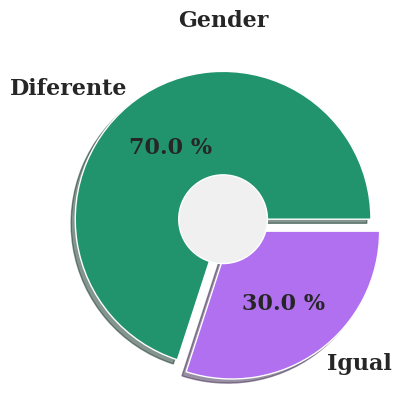

Las variables en las que se diferencian los individuos ['Listen to music', 'Prefer slow or fast songs', 'Country', 'Musicals', 'Pop', 'Metal, Hard rock', 'Hip hop, Rap', 'Latin', 'Techno, Trance', 'Horror movies', 'Thriller movies', 'Romantic movies', 'Sci-fi movies', 'War movies', 'Tales', 'Cartoons', 'Documentaries', 'Western movies', 'Action movies', 'History', 'Psychology', 'Politics', 'Mathematics', 'Physics', 'Internet', 'PC Software, Hardware', 'Biology', 'Chemistry', 'Poetry reading', 'Geography', 'Foreign languages', 'Medicine', 'Cars', 'Art', 'Outdoor activities', 'Dancing', 'Poetry writing', 'Sport and leisure activities', 'Sport at competitive level', 'Gardening', 'Celebrity lifestyle', 'Shopping', 'Science and technology', 'Theatre', 'Adrenaline sports', 'Pets', 'Flying', 'Thunder, lightning', 'Darkness', 'Spiders', 'Snakes', 'Rats, mice', 'Ageing', 'Dangerous dogs', 'Public speaking', 'Drinking', 'Live a very healthy lifestyle', 'Take notice of what goes on around', "Alwa

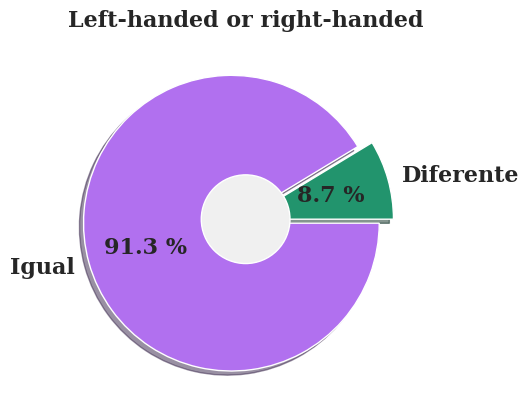

Las variables en las que se diferencian los individuos ['Rock', 'Cartoons', 'Physics', 'Socializing', 'Darkness', 'Drinking', 'Live a very healthy lifestyle', 'Damaged things in the past when angry', 'Always have good dreams', 'Well-mannered and look after my appearance', 'Height', 'How many siblings do have', 'Gender']
Número de variables en el que se diferencian los individuos de Left-handed or right-handed: 13



El tamaño de la muestra N 1 es: 845
El tamaño de la muestra N 2 es: 163


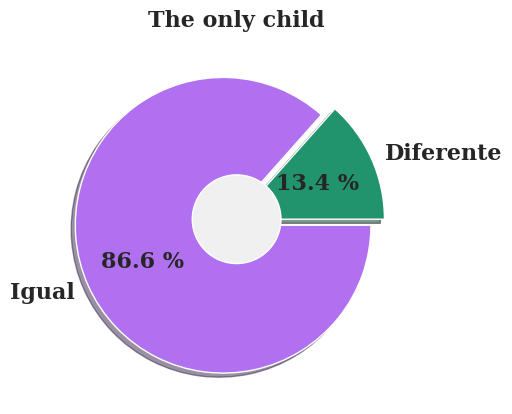

Las variables en las que se diferencian los individuos ['Listen to music', 'Swing, Jazz', 'Foreign languages', 'Law', 'Celebrity lifestyle', 'Socializing', 'Can fall for someone very quickly and then completely lose interest', 'Always give to charity', "Enjoy children's company", 'Always full of life and energy', 'Find it very difficult to get up in the morning', 'Spend a lot of money on my appearance', 'Spend a lot of money on gadgets', 'Will happily pay more money for good, quality, or healthy food', 'Age', 'Weight', 'Highest education achieved', 'Spent most of childhood in a village or town', 'Lived most of childhood in a house or block of flats', 'ID']
Número de variables en el que se diferencian los individuos de The only child: 20



El tamaño de la muestra N 1 es: 299
El tamaño de la muestra N 2 es: 709


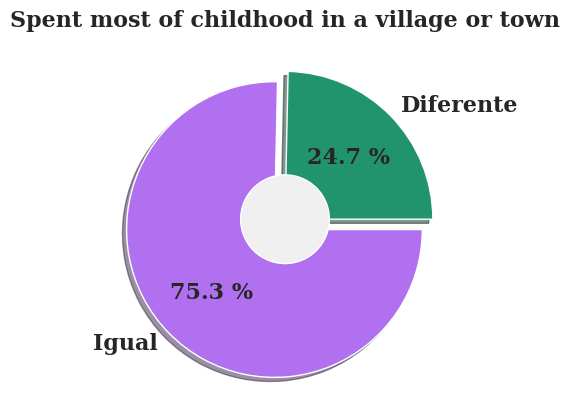

Las variables en las que se diferencian los individuos ['Prefer slow or fast songs', 'Dance, Disco, Funk', 'Folk music', 'Country', 'Enjoy watching movies', 'Biology', 'Chemistry', 'Medicine', 'Religion', 'Outdoor activities', 'Gardening', 'Pets', 'Thunder, lightning', 'Spiders', 'Snakes', 'Rats, mice', 'Dangerous dogs', 'Drinking', 'Try to do tasks as soon as possible and not leave them until last minute', 'Believe that bad people will suffer one day and good people will be rewarded', 'Would rather have lots of friends than lots of money', 'A hypochondriac', 'An empathetic person', "Eat because I have to. Don't enjoy food and eat as fast as can", 'Believe in God', 'Always have good dreams', 'Always give to charity', 'Always let other people know about my achievements', "Enjoy children's company", 'Can get angry very easily', 'Believe all personality traits are positive', 'Save all the money can', 'Spend a lot of money on my appearance', 'Spend a lot of money on gadgets', 'How many sib

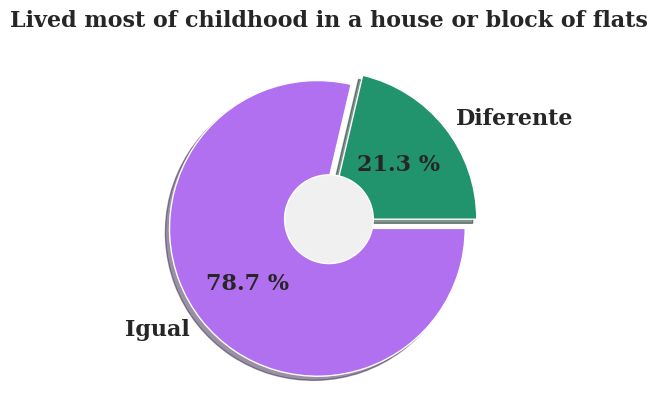

Las variables en las que se diferencian los individuos ['Listen to music', 'Prefer slow or fast songs', 'Folk music', 'Horror movies', 'Comedy movies', 'Biology', 'Chemistry', 'Foreign languages', 'Medicine', 'Religion', 'Outdoor activities', 'Gardening', 'Pets', 'Thunder, lightning', 'Rats, mice', 'Dangerous dogs', 'Try to do tasks as soon as possible and not leave them until last minute', 'Believe that bad people will suffer one day and good people will be rewarded', 'Can tell if people listen to me or not when talk to them', 'A hypochondriac', "Eat because I have to. Don't enjoy food and eat as fast as can", "Don't like seeing animals suffering", 'Believe in God', 'Always have good dreams', 'Timekeeping', 'Always let other people know about my achievements', 'Believe all personality traits are positive', 'How much time spend online', 'Enjoy going to large shopping centers', 'How many siblings do have', 'The only child', 'Spent most of childhood in a village or town']
Número de varia

In [123]:
#Main


dic = {}
listaDosPoblaciones = []
lista_variables = []

for variable in df:
    dic[variable] = len(df[variable].unique())
    lista_variables.append(variable)

for nombre, value in dic.items():
    if value == 2:
        listaDosPoblaciones.append(nombre)

for variable in listaDosPoblaciones:
    dicPrincipal1 ,dicPrincipal2 = media_dicotomicas(df, variable)
    listaContraste, lista_pos = test_contraste(dicPrincipal1, dicPrincipal2)
    grafico_tarta(listaContraste,variable)

    for i in range(len(lista_variables)):
        lista_def = []
        for pos in lista_pos:
             lista_def.append(lista_variables[pos])
    print(f'Las variables en las que se diferencian los individuos {lista_def}')
    print(f'Número de variables en el que se diferencian los individuos de {variable}: {len(lista_def)}')
    print('\n\n')

### Tres Poblaciones

El tamaño de la muestra N 1 es: 222
El tamaño de la muestra N 2 es: 663
El tamaño de la muestra N 3 es: 123


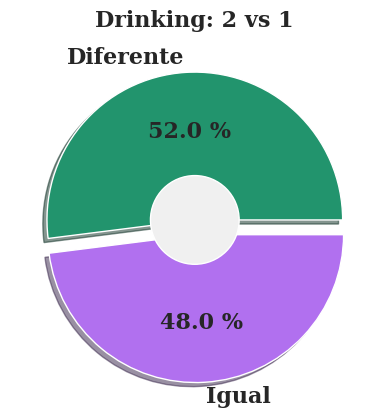

Las variables en las que se diferencian los individuos: ['Listen to music', 'Pop', 'Rock', 'Metal, Hard rock', 'Punk', 'Reggae, Ska', 'Rock n Roll', 'Alternative music', 'Horror movies', 'Comedy movies', 'Romantic movies', 'War movies', 'Tales', 'Politics', 'Biology', 'Chemistry', 'Medicine', 'Religion', 'Outdoor activities', 'Dancing', 'Playing musical instruments', 'Gardening', 'Celebrity lifestyle', 'Socializing', 'Adrenaline sports', 'Flying', 'Thunder, lightning', 'Snakes', 'Rats, mice', 'Dangerous dogs', 'Smoking habits', 'Live a very healthy lifestyle', 'Try to do tasks as soon as possible and not leave them until last minute', "Always make a list so I don't forget anything", 'Often study or work even in spare time', 'Look at things from all different angles before go ahead', 'Believe that bad people will suffer one day and good people will be rewarded', 'Reliable at work and always complete all tasks given to me', 'Always keep my promises', 'Can fall for someone very quickly an

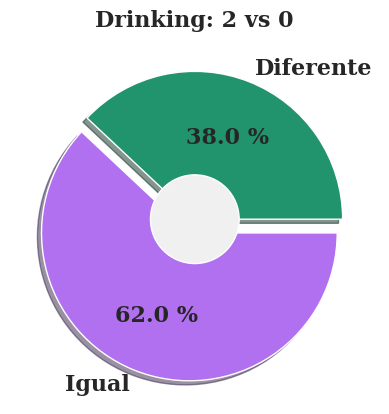

Las variables en las que se diferencian los individuos: ['Listen to music', 'Rock', 'Punk', 'Reggae, Ska', 'Rock n Roll', 'Alternative music', 'Romantic movies', 'Biology', 'Foreign languages', 'Medicine', 'Religion', 'Outdoor activities', 'Playing musical instruments', 'Gardening', 'Socializing', 'Adrenaline sports', 'Flying', 'Thunder, lightning', 'Rats, mice', 'Smoking habits', 'Try to do tasks as soon as possible and not leave them until last minute', 'Look at things from all different angles before go ahead', 'Always keep my promises', 'Can fall for someone very quickly and then completely lose interest', 'Always try to be the funniest one', 'Damaged things in the past when angry', 'Take my time to make decisions', 'Always try to vote in elections', 'Try to give as much as can to other people at Christmas', 'Look after things have borrowed from others', 'Used to cheat at school', 'Worry about my health', 'Believe in God', 'Always give to charity', 'Have lots of friends', 'Timekeep

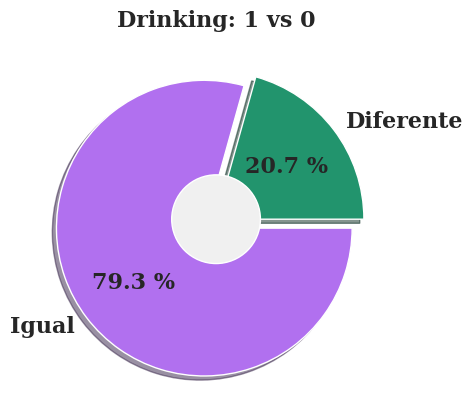

Las variables en las que se diferencian los individuos: ['Listen to music', 'Pop', 'Rock', 'Reggae, Ska', 'Rock n Roll', 'Enjoy watching movies', 'Horror movies', 'Comedy movies', 'Western movies', 'Foreign languages', 'Outdoor activities', 'Gardening', 'Socializing', 'Ageing', 'Smoking habits', 'Live a very healthy lifestyle', 'Try to do tasks as soon as possible and not leave them until last minute', 'Always keep my promises', 'Always try to vote in elections', 'Often think about and regret the decisions I make', 'Try to give as much as can to other people at Christmas', 'Used to cheat at school', 'Do lie to others', 'Believe all personality traits are positive', "If find something that doesn't belong to me, will hand it in", 'How much time spend online', 'Spend a lot of money on partying and socializing', 'Age', 'Weight', 'Left-handed or right-handed', 'Highest education achieved']
Número de variables en el que se diferencian los individuos de Drinking (1 vs 0): 31



El tamaño de l

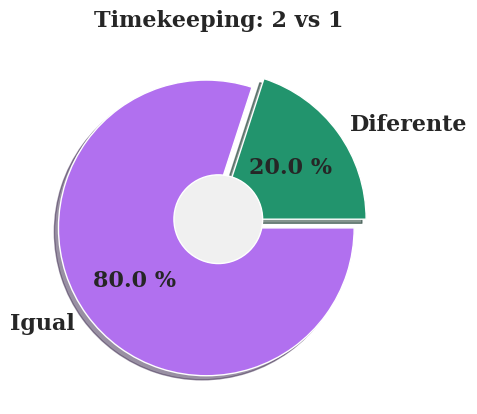

Las variables en las que se diferencian los individuos: ['Listen to music', 'Dancing', 'Sport at competitive level', 'Celebrity lifestyle', 'Socializing', 'Adrenaline sports', 'Public speaking', 'Often study or work even in spare time', 'Look at things from all different angles before go ahead', 'Often think about and regret the decisions I make', "Eat because I have to. Don't enjoy food and eat as fast as can", "Don't like seeing animals suffering", 'Look after things have borrowed from others', 'Feel lonely in life', 'Always have good dreams', 'Have lots of friends', 'Think carefully before answering any important letters', 'Have to be well-prepared before public speaking', "Will find a fault in myself if people don't like me", '100% happy with my life', 'Always full of life and energy', 'Prefer big dangerous dogs to smaller, calmer dogs', 'Find it very difficult to get up in the morning', 'Have many different hobbies and interests', 'How much time spend online', 'Prefer branded clot

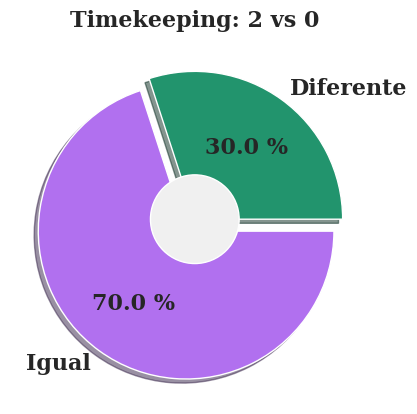

Las variables en las que se diferencian los individuos: ['Listen to music', 'Classical', 'Reggae, Ska', 'Alternative music', 'Tales', 'Cartoons', 'Western movies', 'Action movies', 'Physics', 'Economy, Management', 'Foreign languages', 'Cars', 'Sport at competitive level', 'Celebrity lifestyle', 'Socializing', 'Darkness', 'Spiders', 'Ageing', 'Drinking', 'Live a very healthy lifestyle', 'Try to do tasks as soon as possible and not leave them until last minute', 'Reliable at work and always complete all tasks given to me', 'Always keep my promises', 'Take my time to make decisions', 'Often think about and regret the decisions I make', "Don't like seeing animals suffering", 'Look after things have borrowed from others', 'Feel lonely in life', 'Used to cheat at school', 'Always have good dreams', 'Moods change quickly', 'Enjoy meeting new people', 'Think carefully before answering any important letters', 'Always make sure connect with the right people', "Will find a fault in myself if peo

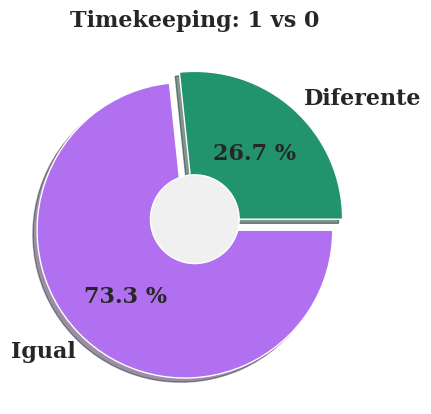

Las variables en las que se diferencian los individuos: ['Listen to music', 'Country', 'Swing, Jazz', 'Rock n Roll', 'Alternative music', 'Comedy movies', 'PC Software, Hardware', 'Foreign languages', 'Cars', 'Art', 'Dancing', 'Socializing', 'Ageing', 'Smoking habits', 'Drinking', 'Live a very healthy lifestyle', 'Try to do tasks as soon as possible and not leave them until last minute', 'Often study or work even in spare time', 'Look at things from all different angles before go ahead', 'Reliable at work and always complete all tasks given to me', 'Always keep my promises', 'Look after things have borrowed from others', 'Used to cheat at school', 'Always have good dreams', 'Have lots of friends', 'Enjoy meeting new people', 'Always let other people know about my achievements', 'Have to be well-prepared before public speaking', 'Prefer big dangerous dogs to smaller, calmer dogs', 'Find it very difficult to get up in the morning', "Always listen to my parents' advice", 'Enjoy taking par

In [124]:
listaTresPoblaciones = []
for variable in df:
    dic[variable] = len(df[variable].unique())
    lista_variables.append(variable)

for nombre, value in dic.items():
    if value == 3:
        listaTresPoblaciones.append(nombre)

for variable in listaTresPoblaciones:
    dicPrincipal1, dicPrincipal2 = media_dicotomicas(df, variable)
    valores = list(dicPrincipal1.keys()) + list(dicPrincipal2.keys())

    for i in range(len(valores)):
        for j in range(i + 1, len(valores)):
            dic1 = {valores[i]: dicPrincipal1.get(valores[i], dicPrincipal2.get(valores[i]))}
            dic2 = {valores[j]: dicPrincipal1.get(valores[j], dicPrincipal2.get(valores[j]))}

            listaContraste, lista_pos = test_contraste(dic1, dic2)
            grafico_tarta(listaContraste, f"{variable}: {valores[i]} vs {valores[j]}")

            lista_def = [lista_variables[pos] for pos in lista_pos]
            print(f'Las variables en las que se diferencian los individuos: {lista_def}')
            print(f'Número de variables en el que se diferencian los individuos de {variable} ({valores[i]} vs {valores[j]}): {len(lista_def)}')
            print('\n\n')